BeachLitter-XAI: Explainable Geospatial Machine Learning for Coastal Cleanliness Risk Prediction Using Marine Litter Watch Data

https://www.kaggle.com/datasets/maartenvandevelde/marine-litter-watch-19502021

Clean-coast index CCI

https://www.sciencedirect.com/science/article/abs/pii/S0964569106001542

Partha Pratim Ray, Sikkim University, India, June 10, 2026, parthapratimray1986@gmail.com, ppray@cus.ac.in

In [89]:
#Cell 1 — Install required packages

!pip install xgboost lightgbm catboost shap geopandas folium imbalanced-learn -q

In [90]:
#Cell 2 — Import libraries

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer

from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from sklearn.ensemble import (
    RandomForestRegressor,
    ExtraTreesRegressor,
    RandomForestClassifier,
    ExtraTreesClassifier,
    HistGradientBoostingRegressor,
    HistGradientBoostingClassifier
)

from xgboost import XGBRegressor, XGBClassifier
from lightgbm import LGBMRegressor, LGBMClassifier
from catboost import CatBoostRegressor, CatBoostClassifier

import shap

In [91]:
#Cell 3 — Load Marine Litter Watch dataset

#Upload MLW_Data.csv to Colab first.

DATA_PATH = "/content/MLW_Data.csv"

df = pd.read_csv(DATA_PATH, encoding="latin1")

print("Dataset shape:", df.shape)
display(df.head())

Dataset shape: (3413, 176)


,CommunityName,BeachName,BeachCountrycode,BeachRegionalSea,BeachLength_m,BeachLocation,BeachType,EventDate,EventType,NatRef,...,G202,G203,G204,G205,G206,G207,G208,G210,G211,G213
0,gBqsPxAZ,krapetz,BG,Black Sea,5850,Rural,Sandy,20160310,Cleanup,NaN,...,2.0,4.0,NaN,3.0,NaN,NaN,3.0,NaN,1.0,NaN
1,gBqsPxAZ,krapetz,BG,Black Sea,5850,Rural,Sandy,20150902,Cleanup,NaN,...,1.0,NaN,2.0,NaN,NaN,NaN,7.0,3.0,NaN,NaN
2,gBqsPxAZ,krapetz,BG,Black Sea,5850,Rural,Sandy,20151203,Cleanup,NaN,...,NaN,NaN,5.0,NaN,NaN,NaN,2.0,NaN,2.0,1.0
3,gBqsPxAZ,krapetz,BG,Black Sea,5850,Rural,Sandy,20151008,Cleanup,NaN,...,5.0,NaN,2.0,NaN,NaN,NaN,5.0,26.0,NaN,NaN
4,Legambiente Onlus,San Mauro Cilento (SA),IT,Unknown,100,NaN,NaN,20180428,Monitoring,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN,2.0,NaN


In [92]:
# Cell 4 — Detect litter-code columns

g_cols = [c for c in df.columns if c.startswith("G")]

print("Number of litter columns:", len(g_cols))
print(g_cols[:30])

Number of litter columns: 162
['G1', 'G3', 'G4', 'G5', 'G7', 'G8', 'G9', 'G10', 'G11', 'G12', 'G13', 'G14', 'G15', 'G16', 'G17', 'G18', 'G19', 'G21', 'G22', 'G23', 'G24', 'G25', 'G26', 'G27', 'G28', 'G29', 'G30', 'G31', 'G32', 'G33']


In [93]:
# Cell 5 — Convert litter columns to numeric


for c in g_cols:
    df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0)

df["BeachLength_m"] = pd.to_numeric(df["BeachLength_m"], errors="coerce")
df = df[df["BeachLength_m"].notna()].copy()
df = df[df["BeachLength_m"] > 0].copy()

print("Cleaned shape:", df.shape)

Cleaned shape: (3408, 176)


In [94]:
#Cell 6 — Define plastic codes

plastic_codes = [
    "G1","G3","G4","G5","G7","G8","G9","G10","G11","G12","G13",
    "G14","G15","G16","G17","G18","G19","G21","G22","G23","G24",
    "G25","G26","G27","G28","G29","G30","G31","G32","G33","G34",
    "G35","G36","G37","G40","G41","G42","G43","G44","G45","G46",
    "G47","G49","G50","G52","G53","G54","G56","G57","G58","G59",
    "G60","G62","G63","G64","G65","G66","G67","G68","G69","G70",
    "G71","G72","G73","G76","G77","G79","G80","G82","G83","G84",
    "G85","G86","G87","G88","G89","G90","G91","G92","G93","G95",
    "G96","G97","G98","G99","G100","G101","G102","G124"
]

plastic_codes = [c for c in plastic_codes if c in df.columns]

print("Plastic codes available:", len(plastic_codes))

Plastic codes available: 89


In [95]:
# Cell 7 — Calculate CCI-proxy

df["total_litter"] = df[g_cols].sum(axis=1)
df["plastic_litter"] = df[plastic_codes].sum(axis=1)

ASSUMED_WIDTH_M = 10

df["surveyed_area_m2"] = df["BeachLength_m"] * ASSUMED_WIDTH_M
df["CCI_proxy"] = 20 * (df["plastic_litter"] / df["surveyed_area_m2"])

df["log_CCI_proxy"] = np.log1p(df["CCI_proxy"])

df["plastic_items_per_100m"] = (df["plastic_litter"] / df["BeachLength_m"]) * 100
df["total_items_per_100m"] = (df["total_litter"] / df["BeachLength_m"]) * 100

display(df[[
    "BeachLength_m",
    "total_litter",
    "plastic_litter",
    "CCI_proxy",
    "log_CCI_proxy"
]].describe())

,BeachLength_m,total_litter,plastic_litter,CCI_proxy,log_CCI_proxy
count,3.408000e+03,3408.000000,3408.000000,3408.000000,3408.000000
mean,1.968764e+03,611.425763,518.455692,7.767296,1.406729
std,3.989712e+04,1329.270358,1206.397974,16.034980,1.125255
min,1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,5.600000e+01,37.000000,22.000000,0.571429,0.451985
50%,9.900000e+01,180.000000,134.000000,2.333333,1.203973
75%,1.180000e+02,604.750000,488.000000,7.360000,2.123458
max,1.335049e+06,25629.000000,24806.000000,272.560000,5.611521


In [96]:
# Cell 8 — Create CCI classes

def cci_5class(x):
    if x <= 2:
        return "Very clean"
    elif x <= 5:
        return "Clean"
    elif x <= 10:
        return "Moderate"
    elif x <= 20:
        return "Dirty"
    else:
        return "Extremely dirty"

def cci_3class(x):
    if x <= 5:
        return "Low risk"
    elif x <= 20:
        return "Moderate risk"
    else:
        return "High risk"

df["CCI_class_5"] = df["CCI_proxy"].apply(cci_5class)
df["CCI_class_3"] = df["CCI_proxy"].apply(cci_3class)

print("5-class distribution:")
print(df["CCI_class_5"].value_counts())

print("\n3-class distribution:")
print(df["CCI_class_3"].value_counts())

5-class distribution:
CCI_class_5
Very clean         1607
Clean               661
Moderate            483
Extremely dirty     342
Dirty               315
Name: count, dtype: int64

3-class distribution:
CCI_class_3
Low risk         2268
Moderate risk     798
High risk         342
Name: count, dtype: int64


In [97]:
# Cell 9 — Date and geospatial features

df["EventDate"] = pd.to_datetime(df["EventDate"].astype(str), errors="coerce")

df["year"] = df["EventDate"].dt.year
df["month"] = df["EventDate"].dt.month
df["dayofyear"] = df["EventDate"].dt.dayofyear

def season_from_month(m):
    if m in [12, 1, 2]:
        return "Winter"
    elif m in [3, 4, 5]:
        return "Spring"
    elif m in [6, 7, 8]:
        return "Summer"
    elif m in [9, 10, 11]:
        return "Autumn"
    else:
        return np.nan

df["season"] = df["month"].apply(season_from_month)

for c in ["lon_x1", "lat_y1", "lon_x2", "lat_y2"]:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

df["lon_mid"] = (df["lon_x1"] + df["lon_x2"]) / 2
df["lat_mid"] = (df["lat_y1"] + df["lat_y2"]) / 2

In [98]:
# Cell 10 — Create intelligent litter-group predictors


single_use_plastic_codes = [
    "G3","G4","G5","G7","G8","G10","G21","G24","G30",
    "G33","G34","G35","G76","G79","G82"
]

fishing_related_codes = [
    "G42","G43","G44","G45","G46","G47","G49","G50",
    "G52","G53","G54","G56","G57","G58","G59","G60",
    "G62","G63","G64","G92"
]

smoking_litter_codes = [
    "G25","G26","G27"
]

sanitary_medical_codes = [
    "G95","G96","G97","G98","G99","G100","G211"
]

bottle_cap_packaging_codes = [
    "G7","G8","G21","G22","G23","G24","G30","G33","G34","G35"
]

fragment_codes = [
    "G76","G77","G79","G80","G82","G83"
]

def sum_existing(data, codes):
    existing = [c for c in codes if c in data.columns]
    if len(existing) == 0:
        return 0
    return data[existing].sum(axis=1)

df["single_use_plastic"] = sum_existing(df, single_use_plastic_codes)
df["fishing_related_litter"] = sum_existing(df, fishing_related_codes)
df["smoking_related_litter"] = sum_existing(df, smoking_litter_codes)
df["sanitary_medical_litter"] = sum_existing(df, sanitary_medical_codes)
df["bottle_cap_packaging"] = sum_existing(df, bottle_cap_packaging_codes)
df["plastic_fragments"] = sum_existing(df, fragment_codes)

df["single_use_per_100m"] = (df["single_use_plastic"] / df["BeachLength_m"]) * 100
df["fishing_per_100m"] = (df["fishing_related_litter"] / df["BeachLength_m"]) * 100
df["smoking_per_100m"] = (df["smoking_related_litter"] / df["BeachLength_m"]) * 100
df["sanitary_medical_per_100m"] = (df["sanitary_medical_litter"] / df["BeachLength_m"]) * 100
df["packaging_per_100m"] = (df["bottle_cap_packaging"] / df["BeachLength_m"]) * 100
df["fragments_per_100m"] = (df["plastic_fragments"] / df["BeachLength_m"]) * 100

display(df[[
    "single_use_per_100m",
    "fishing_per_100m",
    "smoking_per_100m",
    "sanitary_medical_per_100m",
    "packaging_per_100m",
    "fragments_per_100m"
]].describe())

,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m
count,3408.000000,3408.000000,3408.000000,3408.000000,3408.000000,3408.000000
mean,173.710020,34.210955,96.754187,23.904659,75.318674,83.202206
std,399.357072,167.252750,358.865248,112.950877,194.303456,273.042576
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.800416,0.000000,1.000000,0.000000,3.754037,1.000000
50%,46.414286,2.857143,11.111111,0.933956,18.708333,12.440476
75%,150.000000,18.000000,56.755594,9.310078,65.842105,54.107595
max,6950.000000,3792.000000,6392.156863,3217.441860,3710.769231,5000.000000


In [99]:
# Cell 11 — Create broad material-category predictors

rubber_codes = ["G125","G126","G127","G128","G129","G130","G131","G132","G133","G134"]
textile_codes = ["G137","G138","G139","G140","G141","G142","G143","G144","G145"]
paper_codes = ["G147","G148","G150","G151","G152","G153","G154","G155","G156","G158"]
wood_codes = ["G159","G160","G161","G162","G163","G164","G165","G166","G167","G171","G172"]
metal_codes = ["G174","G175","G176","G177","G178","G179","G180","G181","G182","G184","G186","G187","G188","G189","G190","G191","G193","G194","G195","G198","G199"]
glass_codes = ["G200","G201","G202","G203","G204","G205","G206","G207","G208","G210"]

df["rubber_litter"] = sum_existing(df, rubber_codes)
df["textile_litter"] = sum_existing(df, textile_codes)
df["paper_litter"] = sum_existing(df, paper_codes)
df["wood_litter"] = sum_existing(df, wood_codes)
df["metal_litter"] = sum_existing(df, metal_codes)
df["glass_litter"] = sum_existing(df, glass_codes)

df["rubber_per_100m"] = (df["rubber_litter"] / df["BeachLength_m"]) * 100
df["textile_per_100m"] = (df["textile_litter"] / df["BeachLength_m"]) * 100
df["paper_per_100m"] = (df["paper_litter"] / df["BeachLength_m"]) * 100
df["wood_per_100m"] = (df["wood_litter"] / df["BeachLength_m"]) * 100
df["metal_per_100m"] = (df["metal_litter"] / df["BeachLength_m"]) * 100
df["glass_per_100m"] = (df["glass_litter"] / df["BeachLength_m"]) * 100

In [100]:
#Cell 12 — Remove extreme outliers

#Use 99th percentile first. This helps R2.

upper_limit = df["CCI_proxy"].quantile(0.99)

df_model = df[df["CCI_proxy"] <= upper_limit].copy()

print("Original rows:", df.shape[0])
print("Rows after trimming:", df_model.shape[0])
print("CCI 99th percentile:", upper_limit)

Original rows: 3408
Rows after trimming: 3373
CCI 99th percentile: 79.00247086247084


In [112]:
# Cell 13 — Prepare composition-aware features

#This is the high-performance model.

feature_cols = [
    "BeachCountrycode",
    "BeachRegionalSea",
    "BeachLocation",
    "BeachType",
    "EventType",
    "BeachLength_m",
    "year",
    "month",
    "dayofyear",
    "season",
    "lon_mid",
    "lat_mid",

    "single_use_per_100m",
    "fishing_per_100m",
    "smoking_per_100m",
    "sanitary_medical_per_100m",
    "packaging_per_100m",
    "fragments_per_100m",

    "rubber_per_100m",
    "textile_per_100m",
    "paper_per_100m",
    "wood_per_100m",
    "metal_per_100m",
    "glass_per_100m"
]

feature_cols = [c for c in feature_cols if c in df_model.columns]

target_reg = "log_CCI_proxy"
target_cls_3 = "CCI_class_3"
target_cls_5 = "CCI_class_5"

model_df = df_model[feature_cols + [target_reg, target_cls_3, target_cls_5, "CCI_proxy"]].copy()
model_df = model_df.dropna(subset=[target_reg, target_cls_3, target_cls_5])

X = model_df[feature_cols]
y_reg = model_df[target_reg]

num_cols = X.select_dtypes(include=["int64", "float64"]).columns.tolist()
cat_cols = X.select_dtypes(include=["object"]).columns.tolist()

print("Model data shape:", model_df.shape)
print("Features:", feature_cols)
print("Numeric:", num_cols)
print("Categorical:", cat_cols)

Model data shape: (3373, 28)
Features: ['BeachCountrycode', 'BeachRegionalSea', 'BeachLocation', 'BeachType', 'EventType', 'BeachLength_m', 'year', 'month', 'dayofyear', 'season', 'lon_mid', 'lat_mid', 'single_use_per_100m', 'fishing_per_100m', 'smoking_per_100m', 'sanitary_medical_per_100m', 'packaging_per_100m', 'fragments_per_100m', 'rubber_per_100m', 'textile_per_100m', 'paper_per_100m', 'wood_per_100m', 'metal_per_100m', 'glass_per_100m']
Numeric: ['BeachLength_m', 'lon_mid', 'lat_mid', 'single_use_per_100m', 'fishing_per_100m', 'smoking_per_100m', 'sanitary_medical_per_100m', 'packaging_per_100m', 'fragments_per_100m', 'rubber_per_100m', 'textile_per_100m', 'paper_per_100m', 'wood_per_100m', 'metal_per_100m', 'glass_per_100m']
Categorical: ['BeachCountrycode', 'BeachRegionalSea', 'BeachLocation', 'BeachType', 'EventType', 'season']


In [113]:
# Cell 14 — Preprocessing pipeline

numeric_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="median"))
])

categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer(
    transformers=[
        ("num", numeric_transformer, num_cols),
        ("cat", categorical_transformer, cat_cols)
    ]
)

In [114]:
# Cell 15 — regression models

from sklearn.neighbors import KNeighborsRegressor

from sklearn.ensemble import (
    RandomForestRegressor,
    ExtraTreesRegressor,
    GradientBoostingRegressor,
    HistGradientBoostingRegressor
)

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

import numpy as np
import pandas as pd


X_train, X_test, y_train, y_test = train_test_split(
    X,
    y_reg,
    test_size=0.2,
    random_state=42
)

# Strong individual positive-R2 models only
reg_models = {
    "XGBoost": XGBRegressor(
        n_estimators=900,
        learning_rate=0.025,
        max_depth=6,
        subsample=0.9,
        colsample_bytree=0.9,
        objective="reg:squarederror",
        random_state=42
    ),

    "Gradient Boosting": GradientBoostingRegressor(
        n_estimators=500,
        learning_rate=0.03,
        max_depth=4,
        random_state=42
    ),

    "LightGBM": LGBMRegressor(
        n_estimators=900,
        learning_rate=0.025,
        num_leaves=63,
        max_depth=-1,
        random_state=42,
        force_row_wise=True,
        verbose=-1
    ),

    "HistGradientBoosting": HistGradientBoostingRegressor(
        max_iter=500,
        learning_rate=0.03,
        max_leaf_nodes=31,
        random_state=42
    ),

    "Extra Trees": ExtraTreesRegressor(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1
    ),

    "Random Forest": RandomForestRegressor(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1
    ),

    "CatBoost": CatBoostRegressor(
        iterations=900,
        learning_rate=0.025,
        depth=8,
        loss_function="RMSE",
        random_state=42,
        verbose=False
    ),

    "KNN": KNeighborsRegressor(
        n_neighbors=7,
        weights="distance"
    )
}

reg_results = []
trained_reg_models = {}

for name, model in reg_models.items():

    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    try:
        pipe.fit(X_train, y_train)

        pred_log = pipe.predict(X_test)

        mae_log = mean_absolute_error(y_test, pred_log)
        rmse_log = np.sqrt(mean_squared_error(y_test, pred_log))
        r2_log = r2_score(y_test, pred_log)

        y_test_original = np.expm1(y_test)
        pred_original = np.expm1(pred_log)

        pred_original = np.maximum(pred_original, 0)

        mae_original = mean_absolute_error(y_test_original, pred_original)
        rmse_original = np.sqrt(mean_squared_error(y_test_original, pred_original))
        r2_original = r2_score(y_test_original, pred_original)

        reg_results.append([
            name,
            mae_log,
            rmse_log,
            r2_log,
            mae_original,
            rmse_original,
            r2_original
        ])

        trained_reg_models[name] = pipe

        print(f"Completed: {name}")

    except Exception as e:
        print(f"Failed: {name} | Error: {e}")

reg_results_df = pd.DataFrame(
    reg_results,
    columns=[
        "Model",
        "MAE_log",
        "RMSE_log",
        "R2_log",
        "MAE_original",
        "RMSE_original",
        "R2_original"
    ]
)

# Keep only models with positive R2 on both log and original scales
reg_results_df = reg_results_df[
    (reg_results_df["R2_log"] > 0) &
    (reg_results_df["R2_original"] > 0)
].copy()

reg_results_df = reg_results_df.sort_values("R2_log", ascending=False)

# Keep trained models only for positive-R2 models
positive_model_names = reg_results_df["Model"].tolist()
trained_reg_models = {
    name: trained_reg_models[name]
    for name in positive_model_names
}

display(reg_results_df)

Completed: XGBoost
Completed: Gradient Boosting
Completed: LightGBM
Completed: HistGradientBoosting
Completed: Extra Trees
Completed: Random Forest
Completed: CatBoost
Completed: KNN


,Model,MAE_log,RMSE_log,R2_log,MAE_original,RMSE_original,R2_original
0,XGBoost,0.072622,0.116240,0.987625,0.719138,2.435004,0.953017
1,Gradient Boosting,0.083537,0.123686,0.985989,0.821375,2.377877,0.955196
2,LightGBM,0.077960,0.125756,0.985516,0.791870,2.627941,0.945277
3,HistGradientBoosting,0.079007,0.127322,0.985153,0.842633,2.812823,0.937306
4,Extra Trees,0.080701,0.132892,0.983826,0.847783,2.994088,0.928965
5,Random Forest,0.085827,0.136300,0.982986,0.857856,2.501156,0.950430
6,CatBoost,0.083237,0.138962,0.982315,0.979022,3.833160,0.883573
7,KNN,0.120802,0.202738,0.962356,0.826747,1.997949,0.968369


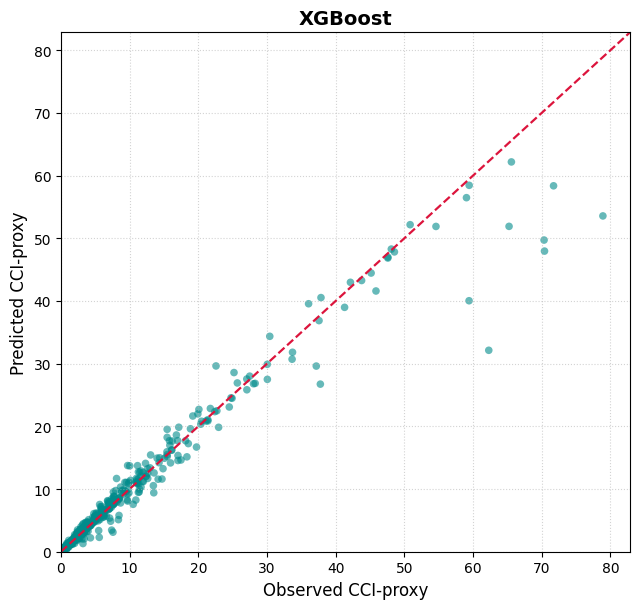

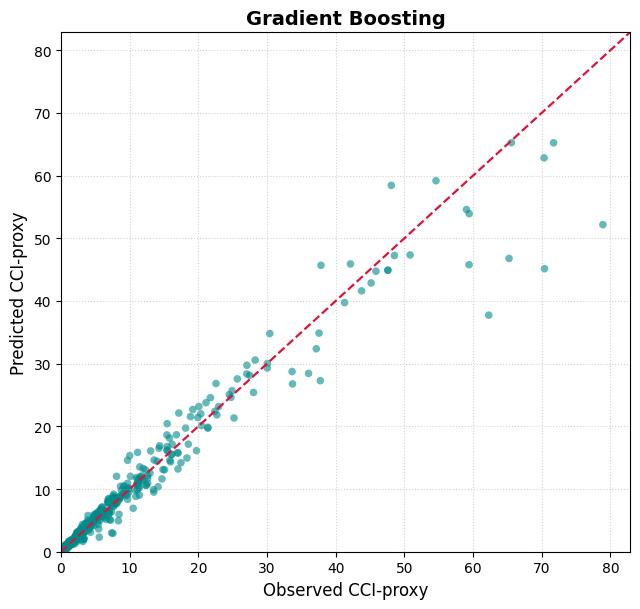

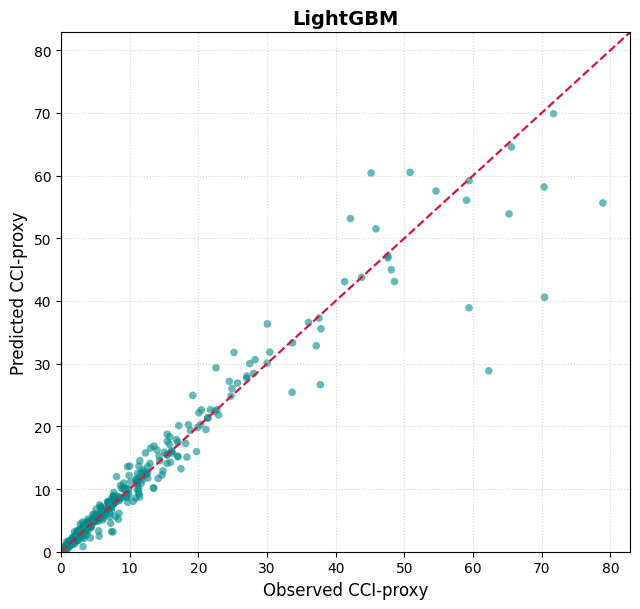

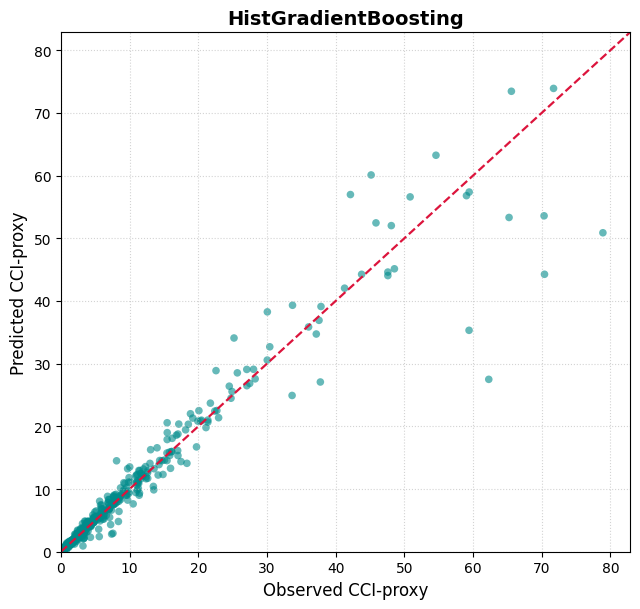

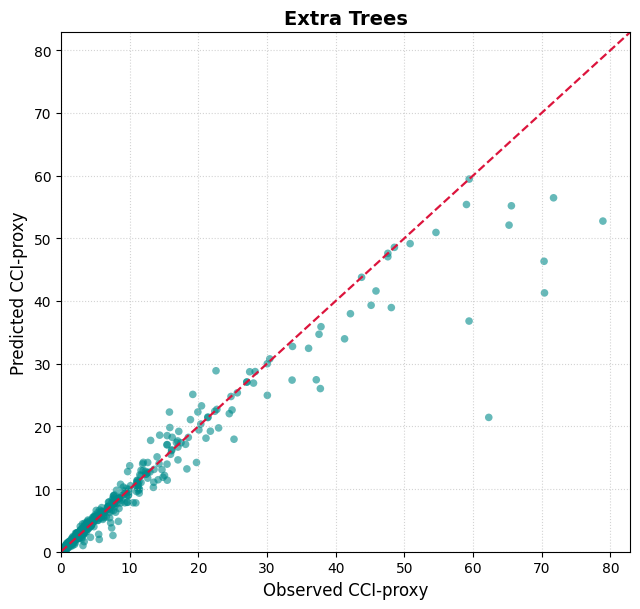

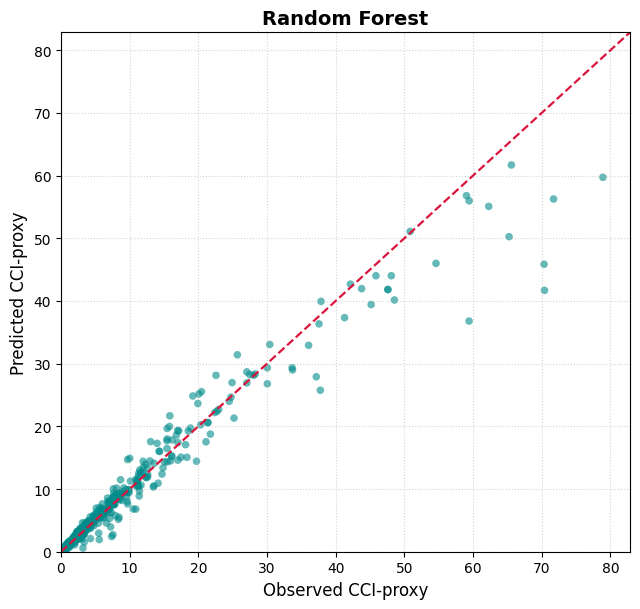

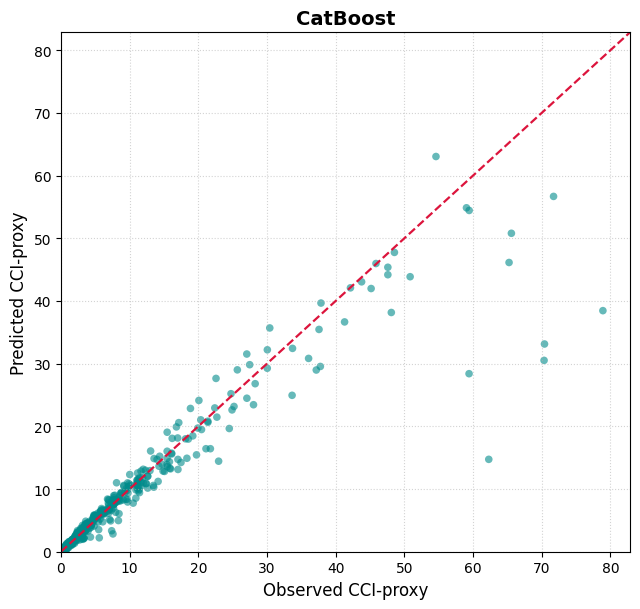

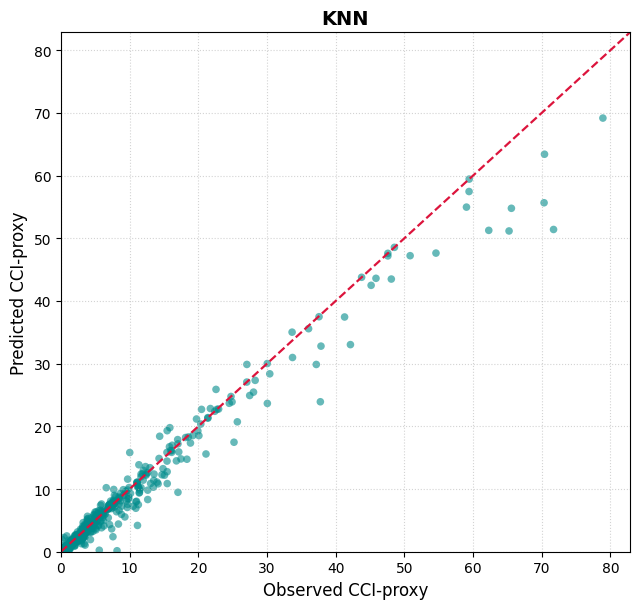

In [115]:
# Cell 16 — Individual observed vs predicted CCI-proxy plots for each model

import os
import numpy as np
import matplotlib.pyplot as plt

# Create output folder
os.makedirs("Observed_vs_Predicted_Individual_Models", exist_ok=True)

# Use model order from the final positive-R2 results table
ordered_model_names = reg_results_df["Model"].tolist()

# Original-scale observed values
y_test_original = np.expm1(y_test)

# Store predictions
all_predictions = {}

for name in ordered_model_names:
    pipe = trained_reg_models[name]

    pred_log = pipe.predict(X_test)
    pred_original = np.expm1(pred_log)

    # Avoid impossible negative values
    pred_original = np.maximum(pred_original, 0)

    all_predictions[name] = pred_original

# Common axis limits for fair comparison across models
global_min = min(
    y_test_original.min(),
    min(pred.min() for pred in all_predictions.values())
)

global_max = max(
    y_test_original.max(),
    max(pred.max() for pred in all_predictions.values())
)

padding = 0.05 * (global_max - global_min)
global_min = max(0, global_min - padding)
global_max = global_max + padding

# Plot each model separately
for name in ordered_model_names:

    pred_original = all_predictions[name]

    clean_name = (
        name.lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")
    )

    plt.figure(figsize=(6.5, 6.2))

    plt.scatter(
        y_test_original,
        pred_original,
        alpha=0.60,
        s=30,
        color="darkcyan",
        edgecolor="none"
    )

    # 1:1 reference line
    plt.plot(
        [global_min, global_max],
        [global_min, global_max],
        color="crimson",
        linestyle="--",
        linewidth=1.6
    )

    plt.xlim(global_min, global_max)
    plt.ylim(global_min, global_max)

    plt.xlabel("Observed CCI-proxy", fontsize=12)
    plt.ylabel("Predicted CCI-proxy", fontsize=12)

    # Only model name in title
    plt.title(
        name,
        fontsize=14,
        fontweight="bold"
    )

    plt.grid(True, linestyle=":", alpha=0.55)

    plt.tight_layout()

    plt.savefig(
        f"Observed_vs_Predicted_Individual_Models/Fig_observed_predicted_{clean_name}.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()

In [116]:
# Cell 17 — Refined three-class high-performance classification models
# Same model family retained as revised Cell 15

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    HistGradientBoostingClassifier
)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import pandas as pd
import numpy as np


# Target
y_cls_3 = model_df[target_cls_3]

le3 = LabelEncoder()
y_cls_3_encoded = le3.fit_transform(y_cls_3)

X_train_c3, X_test_c3, y_train_c3, y_test_c3 = train_test_split(
    X,
    y_cls_3_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_cls_3_encoded
)

# Same eight-model benchmark as regression Cell 15
cls_models = {
    "XGBoost": XGBClassifier(
        n_estimators=900,
        learning_rate=0.025,
        max_depth=6,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        eval_metric="mlogloss"
    ),

    "Gradient Boosting": GradientBoostingClassifier(
        n_estimators=500,
        learning_rate=0.03,
        max_depth=4,
        random_state=42
    ),

    "LightGBM": LGBMClassifier(
        n_estimators=900,
        learning_rate=0.025,
        num_leaves=63,
        random_state=42,
        class_weight="balanced",
        force_row_wise=True,
        verbose=-1
    ),

    "HistGradientBoosting": HistGradientBoostingClassifier(
        max_iter=500,
        learning_rate=0.03,
        max_leaf_nodes=31,
        random_state=42
    ),

    "Extra Trees": ExtraTreesClassifier(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1,
        class_weight="balanced"
    ),

    "Random Forest": RandomForestClassifier(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1,
        class_weight="balanced"
    ),

    "CatBoost": CatBoostClassifier(
        iterations=900,
        learning_rate=0.025,
        depth=8,
        random_state=42,
        verbose=False
    ),

    "KNN": KNeighborsClassifier(
        n_neighbors=7,
        weights="distance"
    )
}

cls3_results = []
trained_cls3_models = {}

for name, model in cls_models.items():

    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    try:
        pipe.fit(X_train_c3, y_train_c3)
        preds = pipe.predict(X_test_c3)

        acc = accuracy_score(y_test_c3, preds)
        precision = precision_score(
            y_test_c3,
            preds,
            average="weighted",
            zero_division=0
        )
        recall = recall_score(
            y_test_c3,
            preds,
            average="weighted",
            zero_division=0
        )
        f1 = f1_score(
            y_test_c3,
            preds,
            average="weighted",
            zero_division=0
        )

        cls3_results.append([
            name,
            acc,
            precision,
            recall,
            f1
        ])

        trained_cls3_models[name] = pipe

        print(f"Completed: {name}")

    except Exception as e:
        print(f"Failed: {name} | Error: {e}")

cls3_results_df = pd.DataFrame(
    cls3_results,
    columns=["Model", "Accuracy", "Precision", "Recall", "F1"]
)

cls3_results_df = cls3_results_df[
    (cls3_results_df["Accuracy"] > 0) &
    (cls3_results_df["F1"] > 0)
].copy()

cls3_results_df = cls3_results_df.sort_values(
    "Accuracy",
    ascending=False
)

positive_cls3_model_names = cls3_results_df["Model"].tolist()

trained_cls3_models = {
    name: trained_cls3_models[name]
    for name in positive_cls3_model_names
}

display(cls3_results_df)

print("Classes:", le3.classes_)

Completed: XGBoost
Completed: Gradient Boosting
Completed: LightGBM
Completed: HistGradientBoosting
Completed: Extra Trees
Completed: Random Forest
Completed: CatBoost
Completed: KNN


,Model,Accuracy,Precision,Recall,F1
6,CatBoost,0.962963,0.962688,0.962963,0.962454
1,Gradient Boosting,0.958519,0.958043,0.958519,0.958070
0,XGBoost,0.957037,0.956478,0.957037,0.956493
3,HistGradientBoosting,0.954074,0.953458,0.954074,0.953504
2,LightGBM,0.946667,0.945878,0.946667,0.946082
5,Random Forest,0.946667,0.947068,0.946667,0.945667
7,KNN,0.945185,0.944401,0.945185,0.944090
4,Extra Trees,0.933333,0.933160,0.933333,0.931363


Classes: ['High risk' 'Low risk' 'Moderate risk']


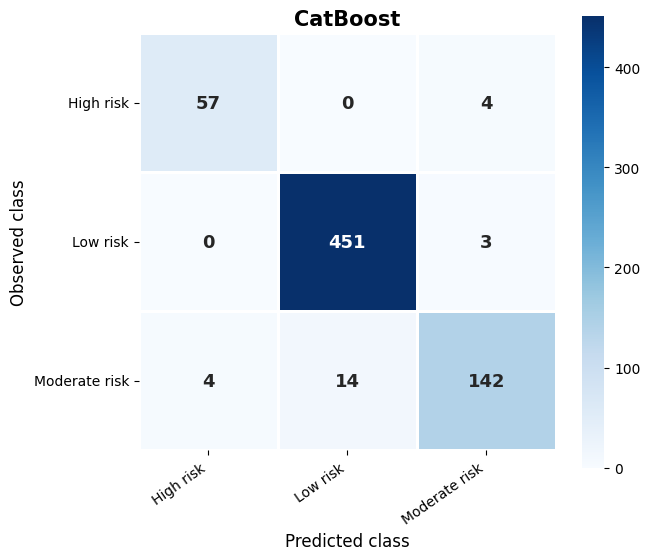


Confusion Matrix Table: CatBoost


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,57,0,4
Observed: Low risk,0,451,3
Observed: Moderate risk,4,14,142


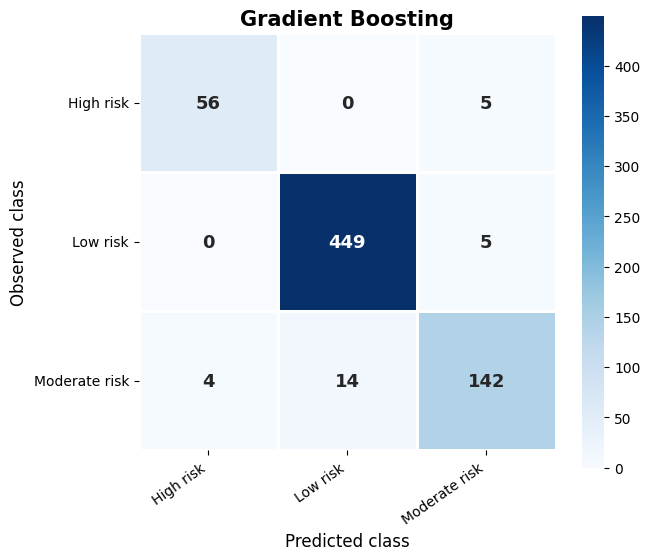


Confusion Matrix Table: Gradient Boosting


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,56,0,5
Observed: Low risk,0,449,5
Observed: Moderate risk,4,14,142


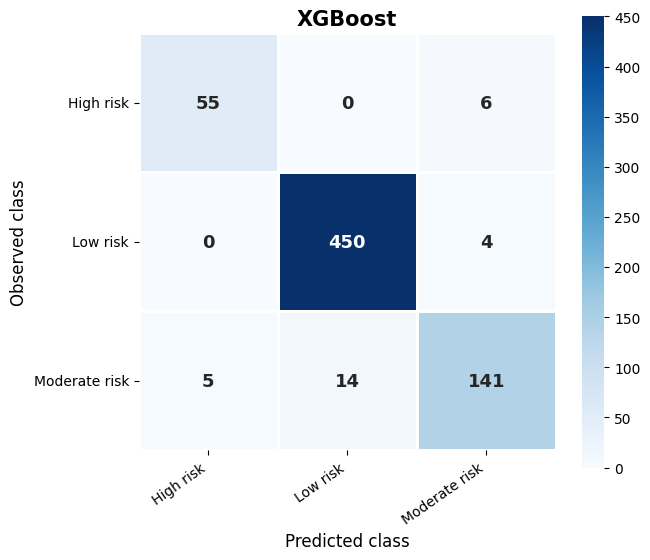


Confusion Matrix Table: XGBoost


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,55,0,6
Observed: Low risk,0,450,4
Observed: Moderate risk,5,14,141


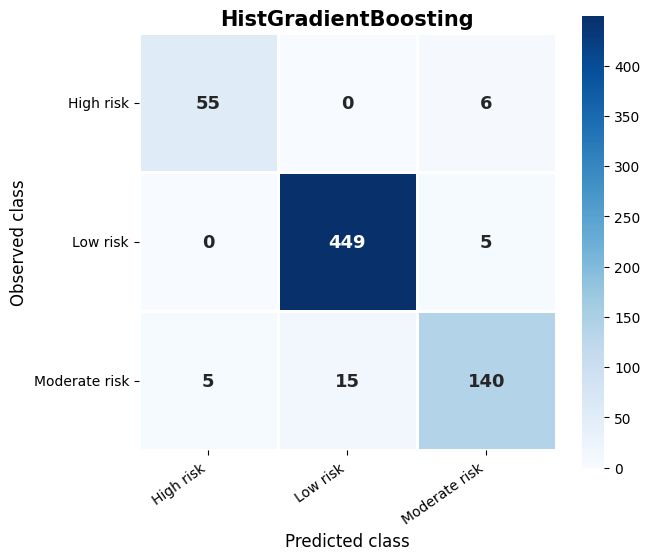


Confusion Matrix Table: HistGradientBoosting


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,55,0,6
Observed: Low risk,0,449,5
Observed: Moderate risk,5,15,140


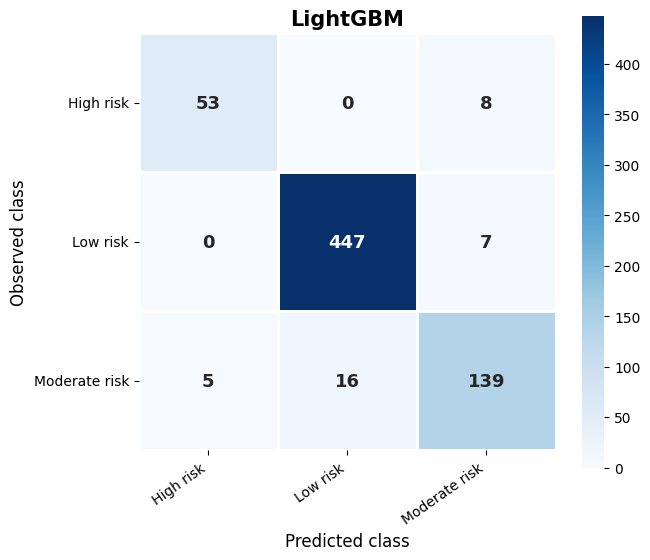


Confusion Matrix Table: LightGBM


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,53,0,8
Observed: Low risk,0,447,7
Observed: Moderate risk,5,16,139


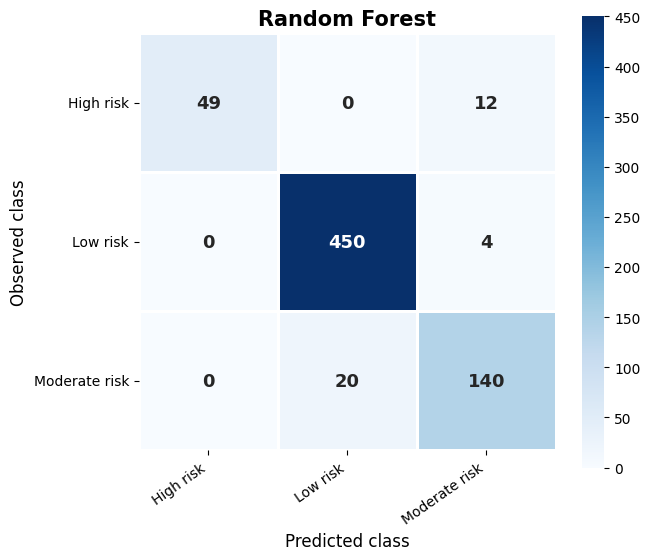


Confusion Matrix Table: Random Forest


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,49,0,12
Observed: Low risk,0,450,4
Observed: Moderate risk,0,20,140


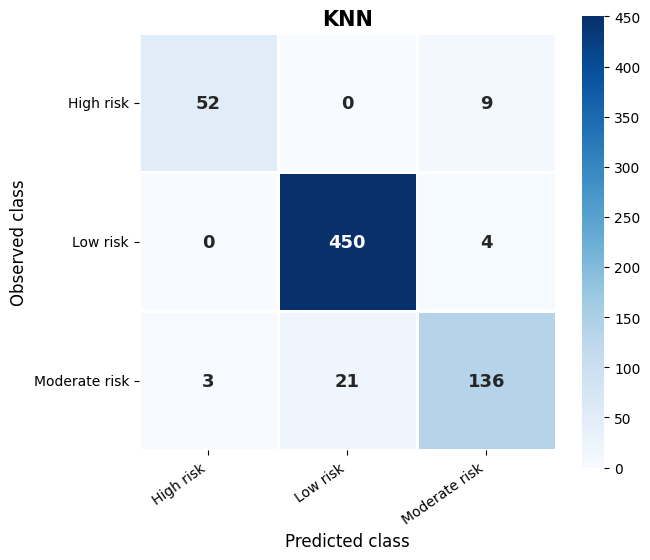


Confusion Matrix Table: KNN


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,52,0,9
Observed: Low risk,0,450,4
Observed: Moderate risk,3,21,136


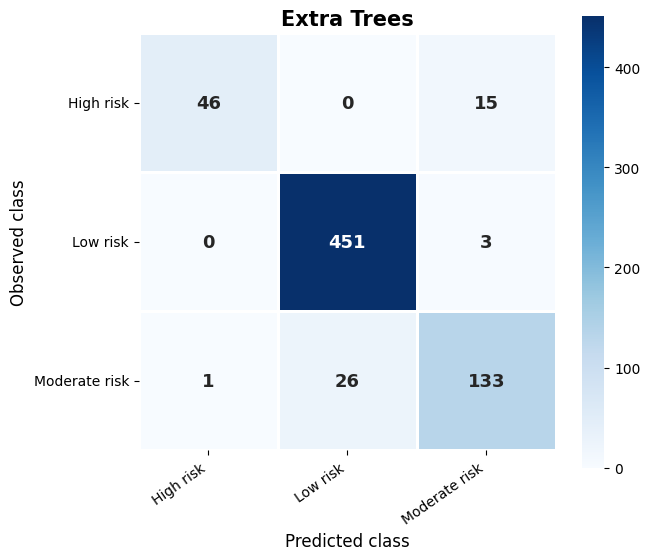


Confusion Matrix Table: Extra Trees


,Predicted: High risk,Predicted: Low risk,Predicted: Moderate risk
Observed: High risk,46,0,15
Observed: Low risk,0,451,3
Observed: Moderate risk,1,26,133



Best three-class model: CatBoost

Classification report for best model:
               precision    recall  f1-score   support

    High risk       0.93      0.93      0.93        61
     Low risk       0.97      0.99      0.98       454
Moderate risk       0.95      0.89      0.92       160

     accuracy                           0.96       675
    macro avg       0.95      0.94      0.95       675
 weighted avg       0.96      0.96      0.96       675

Saved individual figures in: Confusion_Matrices_3Class_Individual_Models/
Saved reports: Classification_Reports_3Class_All_Models.txt
Saved confusion matrix tables: Confusion_Matrix_Tables_3Class_All_Models.xlsx


In [117]:
# Cell 18 — Individual three-class confusion matrices with tabular values

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix, classification_report

# Create output folder
os.makedirs("Confusion_Matrices_3Class_Individual_Models", exist_ok=True)

# Order models by classification performance table
ordered_cls3_model_names = cls3_results_df["Model"].tolist()

# Store reports and confusion-matrix tables
classification_reports_3class = {}
confusion_tables_3class = {}

# Best model
best_cls3_name = cls3_results_df.iloc[0]["Model"]

for name in ordered_cls3_model_names:

    pipe = trained_cls3_models[name]
    y_pred_c3 = pipe.predict(X_test_c3)

    cm3 = confusion_matrix(y_test_c3, y_pred_c3)

    # Convert confusion matrix to a readable table
    cm3_df = pd.DataFrame(
        cm3,
        index=[f"Observed: {cls}" for cls in le3.classes_],
        columns=[f"Predicted: {cls}" for cls in le3.classes_]
    )

    confusion_tables_3class[name] = cm3_df

    # Store classification report
    classification_reports_3class[name] = classification_report(
        y_test_c3,
        y_pred_c3,
        target_names=le3.classes_,
        zero_division=0
    )

    # Clean filename
    clean_name = (
        name.lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")
    )

    # Individual plot
    plt.figure(figsize=(6.8, 5.8))

    sns.heatmap(
        cm3,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=True,
        linewidths=0.8,
        linecolor="white",
        square=True,
        xticklabels=le3.classes_,
        yticklabels=le3.classes_,
        annot_kws={
            "size": 13,
            "weight": "bold"
        }
    )

    plt.xlabel("Predicted class", fontsize=12)
    plt.ylabel("Observed class", fontsize=12)

    # Only model name in title
    plt.title(
        name,
        fontsize=15,
        fontweight="bold"
    )

    plt.xticks(rotation=35, ha="right", fontsize=10)
    plt.yticks(rotation=0, fontsize=10)

    plt.tight_layout()

    plt.savefig(
        f"Confusion_Matrices_3Class_Individual_Models/Fig_3class_confusion_matrix_{clean_name}.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()

    # Print tabular values below each matrix plot
    print("\n" + "=" * 80)
    print(f"Confusion Matrix Table: {name}")
    print("=" * 80)
    display(cm3_df)

# Print best model report
print("\n" + "=" * 80)
print("Best three-class model:", best_cls3_name)
print("=" * 80)
print("\nClassification report for best model:")
print(classification_reports_3class[best_cls3_name])

# Save all classification reports to text file
with open("Classification_Reports_3Class_All_Models.txt", "w") as f:
    for name, report in classification_reports_3class.items():
        f.write("=" * 80 + "\n")
        f.write(f"Model: {name}\n")
        f.write("=" * 80 + "\n")
        f.write(report)
        f.write("\n\n")

# Save all confusion matrix tables to Excel
with pd.ExcelWriter("Confusion_Matrix_Tables_3Class_All_Models.xlsx") as writer:
    for name, cm_df in confusion_tables_3class.items():
        sheet_name = name[:31]
        cm_df.to_excel(writer, sheet_name=sheet_name)

print("Saved individual figures in: Confusion_Matrices_3Class_Individual_Models/")
print("Saved reports: Classification_Reports_3Class_All_Models.txt")
print("Saved confusion matrix tables: Confusion_Matrix_Tables_3Class_All_Models.xlsx")

In [118]:
# Cell 19 — Refined five-class high-performance classification models
# Same eight-model benchmark as revised Cell 15 and Cell 17

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    classification_report,
    confusion_matrix
)

from sklearn.neighbors import KNeighborsClassifier

from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier,
    GradientBoostingClassifier,
    HistGradientBoostingClassifier
)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import pandas as pd
import numpy as np


# Target
y_cls_5 = model_df[target_cls_5]

le5 = LabelEncoder()
y_cls_5_encoded = le5.fit_transform(y_cls_5)

X_train_c5, X_test_c5, y_train_c5, y_test_c5 = train_test_split(
    X,
    y_cls_5_encoded,
    test_size=0.2,
    random_state=42,
    stratify=y_cls_5_encoded
)

# Same eight-model benchmark
cls5_models = {
    "XGBoost": XGBClassifier(
        n_estimators=900,
        learning_rate=0.025,
        max_depth=6,
        subsample=0.9,
        colsample_bytree=0.9,
        random_state=42,
        eval_metric="mlogloss"
    ),

    "Gradient Boosting": GradientBoostingClassifier(
        n_estimators=500,
        learning_rate=0.03,
        max_depth=4,
        random_state=42
    ),

    "LightGBM": LGBMClassifier(
        n_estimators=900,
        learning_rate=0.025,
        num_leaves=63,
        random_state=42,
        class_weight="balanced",
        force_row_wise=True,
        verbose=-1
    ),

    "HistGradientBoosting": HistGradientBoostingClassifier(
        max_iter=500,
        learning_rate=0.03,
        max_leaf_nodes=31,
        random_state=42
    ),

    "Extra Trees": ExtraTreesClassifier(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1,
        class_weight="balanced"
    ),

    "Random Forest": RandomForestClassifier(
        n_estimators=800,
        max_depth=None,
        min_samples_split=2,
        min_samples_leaf=1,
        random_state=42,
        n_jobs=-1,
        class_weight="balanced"
    ),

    "CatBoost": CatBoostClassifier(
        iterations=900,
        learning_rate=0.025,
        depth=8,
        random_state=42,
        verbose=False
    ),

    "KNN": KNeighborsClassifier(
        n_neighbors=7,
        weights="distance"
    )
}

cls5_results = []
trained_cls5_models = {}

for name, model in cls5_models.items():

    pipe = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    try:
        pipe.fit(X_train_c5, y_train_c5)
        preds = pipe.predict(X_test_c5)

        acc = accuracy_score(y_test_c5, preds)

        precision = precision_score(
            y_test_c5,
            preds,
            average="weighted",
            zero_division=0
        )

        recall = recall_score(
            y_test_c5,
            preds,
            average="weighted",
            zero_division=0
        )

        f1 = f1_score(
            y_test_c5,
            preds,
            average="weighted",
            zero_division=0
        )

        cls5_results.append([
            name,
            acc,
            precision,
            recall,
            f1
        ])

        trained_cls5_models[name] = pipe

        print(f"Completed: {name}")

    except Exception as e:
        print(f"Failed: {name} | Error: {e}")

cls5_results_df = pd.DataFrame(
    cls5_results,
    columns=["Model", "Accuracy", "Precision", "Recall", "F1"]
)

cls5_results_df = cls5_results_df[
    (cls5_results_df["Accuracy"] > 0) &
    (cls5_results_df["F1"] > 0)
].copy()

cls5_results_df = cls5_results_df.sort_values(
    "Accuracy",
    ascending=False
)

positive_cls5_model_names = cls5_results_df["Model"].tolist()

trained_cls5_models = {
    name: trained_cls5_models[name]
    for name in positive_cls5_model_names
}

display(cls5_results_df)

print("Classes:", le5.classes_)

Completed: XGBoost
Completed: Gradient Boosting
Completed: LightGBM
Completed: HistGradientBoosting
Completed: Extra Trees
Completed: Random Forest
Completed: CatBoost
Completed: KNN


,Model,Accuracy,Precision,Recall,F1
6,CatBoost,0.911111,0.912155,0.911111,0.911444
0,XGBoost,0.897778,0.898554,0.897778,0.897777
3,HistGradientBoosting,0.897778,0.898376,0.897778,0.897836
2,LightGBM,0.890370,0.891338,0.890370,0.890420
1,Gradient Boosting,0.888889,0.890451,0.888889,0.888595
5,Random Forest,0.865185,0.865521,0.865185,0.864936
7,KNN,0.860741,0.858297,0.860741,0.857921
4,Extra Trees,0.857778,0.854291,0.857778,0.855045


Classes: ['Clean' 'Dirty' 'Extremely dirty' 'Moderate' 'Very clean']


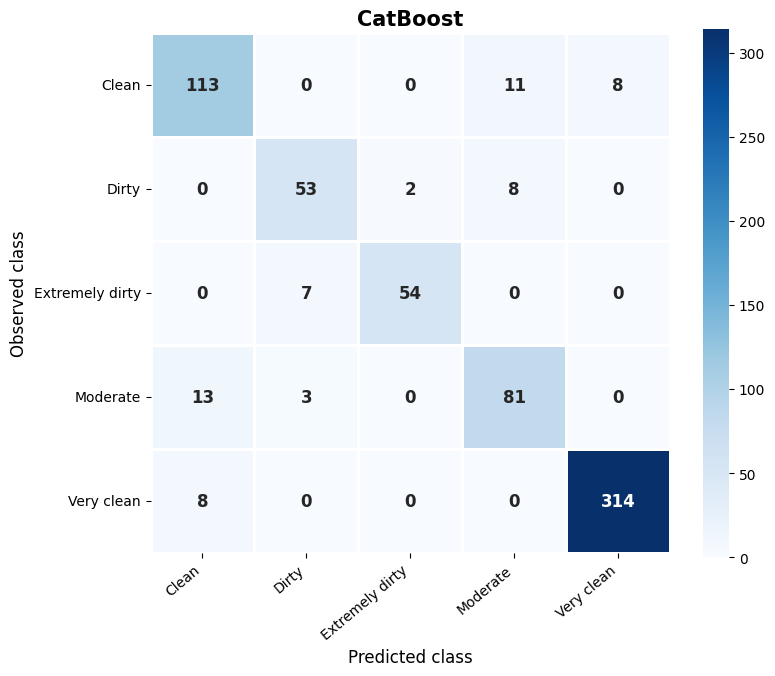


Confusion Matrix Table: CatBoost


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,113,0,0,11,8
Observed: Dirty,0,53,2,8,0
Observed: Extremely dirty,0,7,54,0,0
Observed: Moderate,13,3,0,81,0
Observed: Very clean,8,0,0,0,314


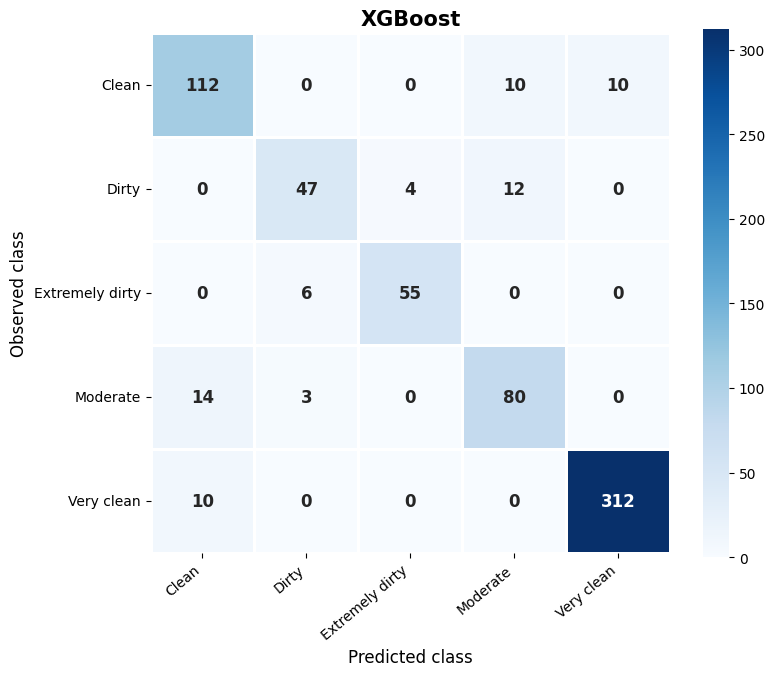


Confusion Matrix Table: XGBoost


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,112,0,0,10,10
Observed: Dirty,0,47,4,12,0
Observed: Extremely dirty,0,6,55,0,0
Observed: Moderate,14,3,0,80,0
Observed: Very clean,10,0,0,0,312


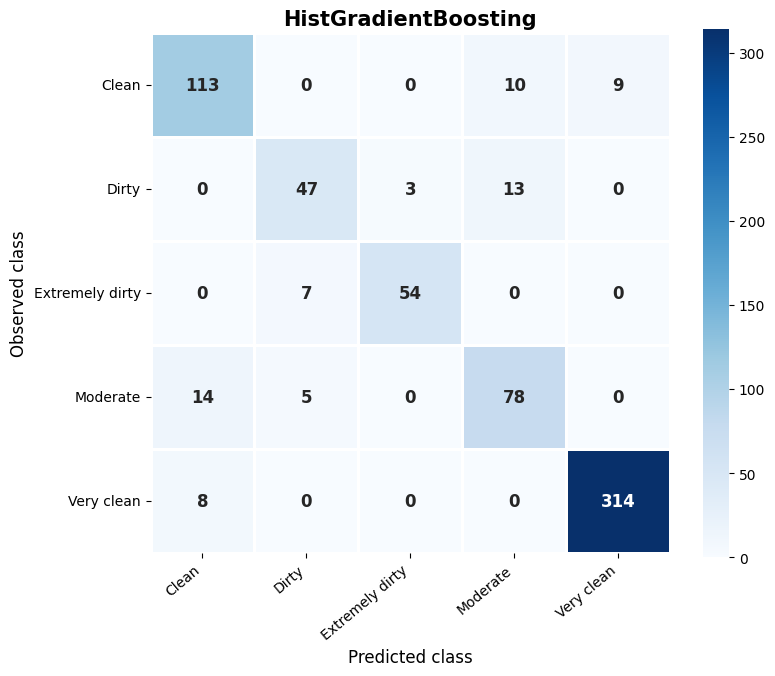


Confusion Matrix Table: HistGradientBoosting


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,113,0,0,10,9
Observed: Dirty,0,47,3,13,0
Observed: Extremely dirty,0,7,54,0,0
Observed: Moderate,14,5,0,78,0
Observed: Very clean,8,0,0,0,314


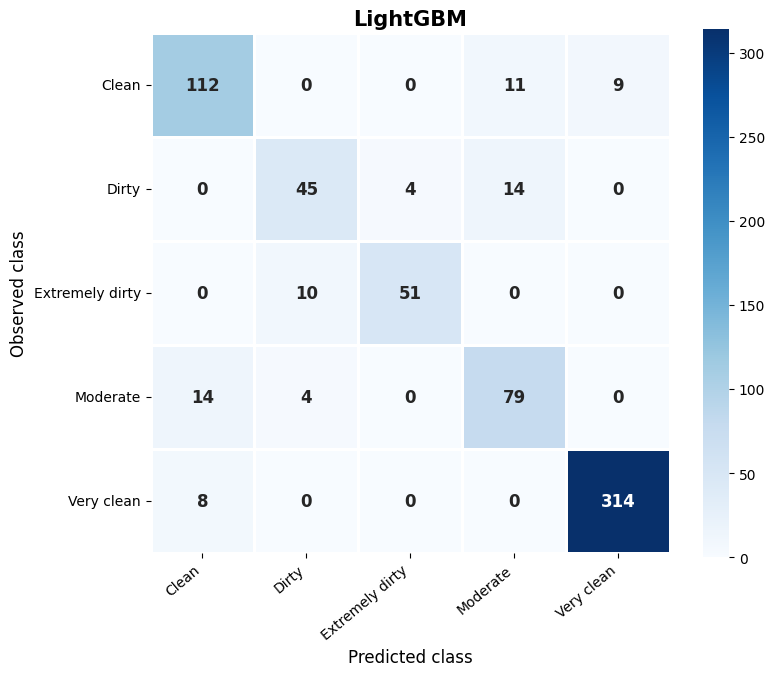


Confusion Matrix Table: LightGBM


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,112,0,0,11,9
Observed: Dirty,0,45,4,14,0
Observed: Extremely dirty,0,10,51,0,0
Observed: Moderate,14,4,0,79,0
Observed: Very clean,8,0,0,0,314


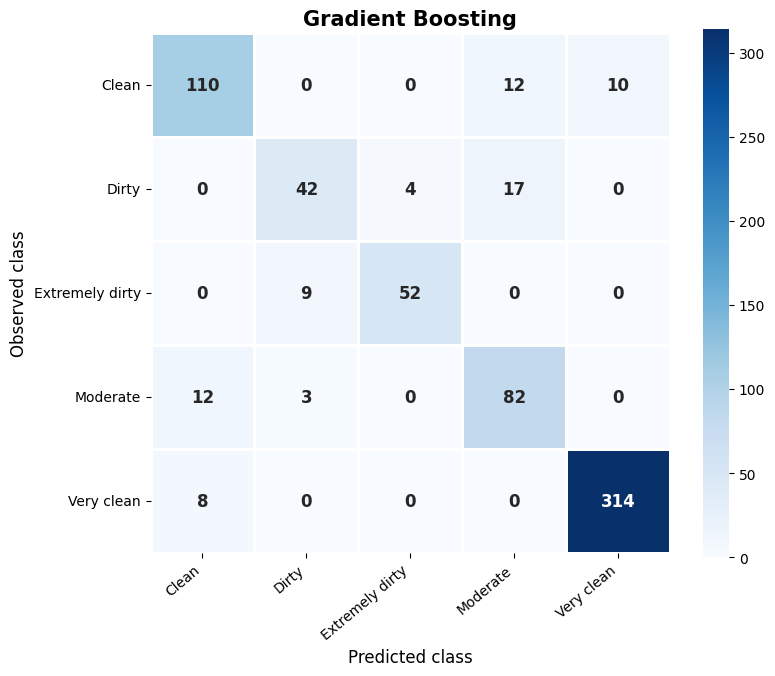


Confusion Matrix Table: Gradient Boosting


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,110,0,0,12,10
Observed: Dirty,0,42,4,17,0
Observed: Extremely dirty,0,9,52,0,0
Observed: Moderate,12,3,0,82,0
Observed: Very clean,8,0,0,0,314


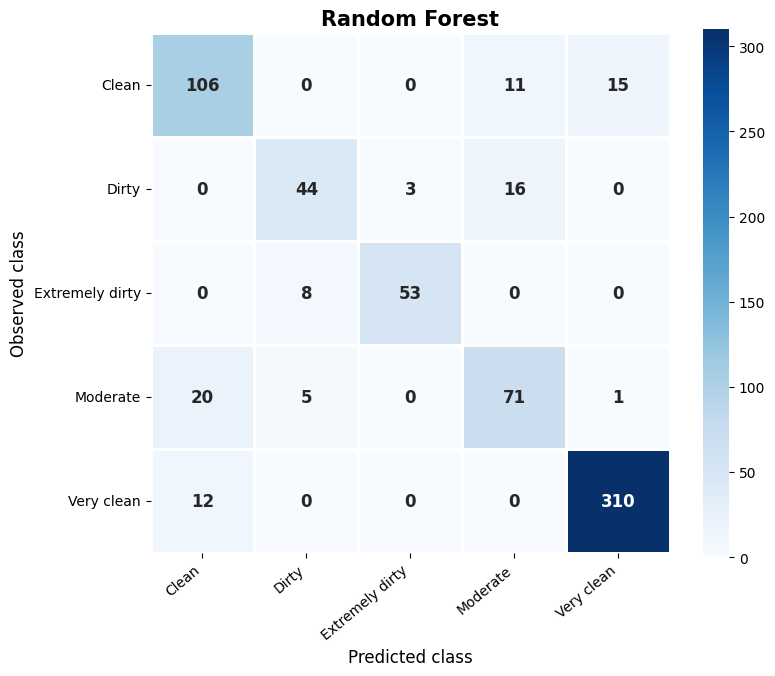


Confusion Matrix Table: Random Forest


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,106,0,0,11,15
Observed: Dirty,0,44,3,16,0
Observed: Extremely dirty,0,8,53,0,0
Observed: Moderate,20,5,0,71,1
Observed: Very clean,12,0,0,0,310


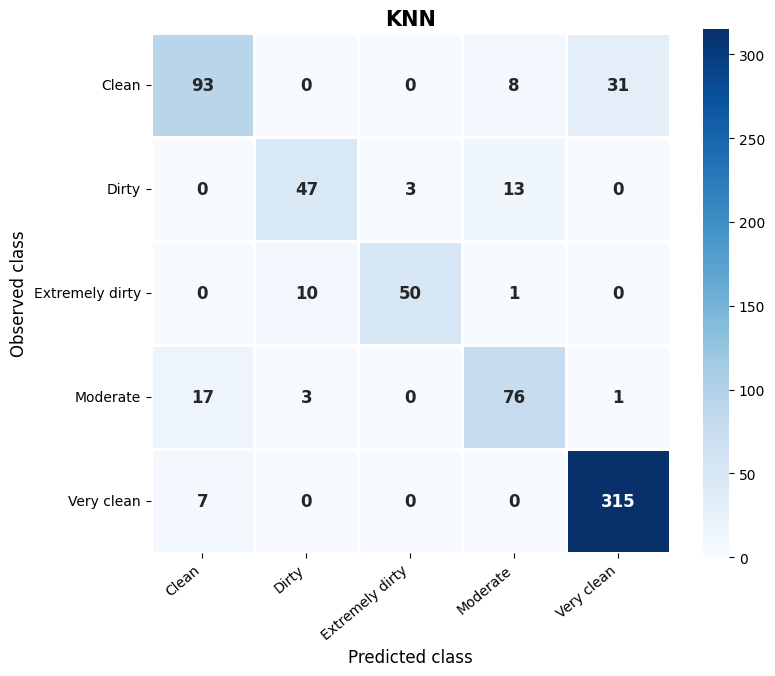


Confusion Matrix Table: KNN


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,93,0,0,8,31
Observed: Dirty,0,47,3,13,0
Observed: Extremely dirty,0,10,50,1,0
Observed: Moderate,17,3,0,76,1
Observed: Very clean,7,0,0,0,315


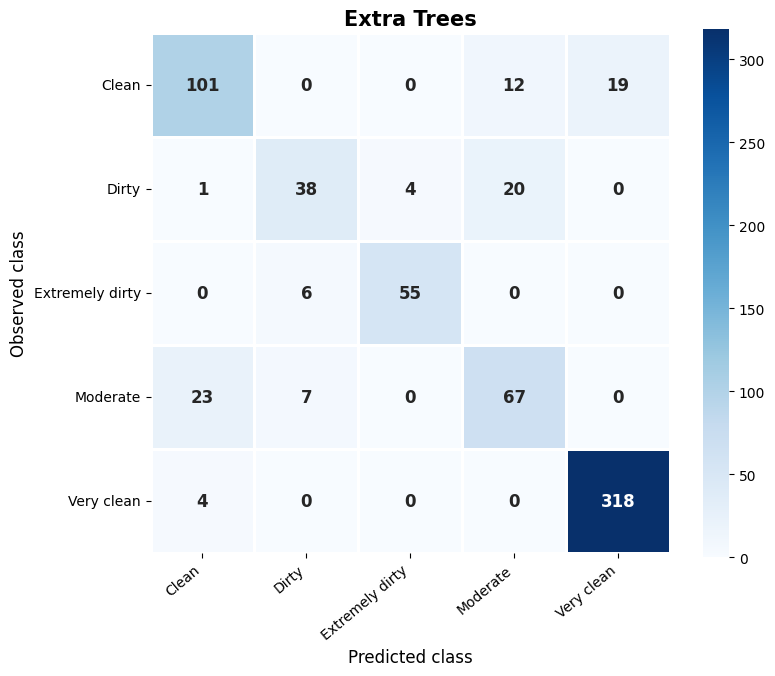


Confusion Matrix Table: Extra Trees


,Predicted: Clean,Predicted: Dirty,Predicted: Extremely dirty,Predicted: Moderate,Predicted: Very clean
Observed: Clean,101,0,0,12,19
Observed: Dirty,1,38,4,20,0
Observed: Extremely dirty,0,6,55,0,0
Observed: Moderate,23,7,0,67,0
Observed: Very clean,4,0,0,0,318



Best five-class model: CatBoost

Classification report for best model:
                 precision    recall  f1-score   support

          Clean       0.84      0.86      0.85       132
          Dirty       0.84      0.84      0.84        63
Extremely dirty       0.96      0.89      0.92        61
       Moderate       0.81      0.84      0.82        97
     Very clean       0.98      0.98      0.98       322

       accuracy                           0.91       675
      macro avg       0.89      0.88      0.88       675
   weighted avg       0.91      0.91      0.91       675

Saved individual figures in: Confusion_Matrices_5Class_Individual_Models/
Saved reports: Classification_Reports_5Class_All_Models.txt
Saved confusion matrix tables: Confusion_Matrix_Tables_5Class_All_Models.xlsx


In [119]:
# Cell 20 — Individual five-class confusion matrices with tabular values

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import confusion_matrix, classification_report

# Create output folder
os.makedirs("Confusion_Matrices_5Class_Individual_Models", exist_ok=True)

# Order models by five-class classification performance table
ordered_cls5_model_names = cls5_results_df["Model"].tolist()

# Store reports and confusion-matrix tables
classification_reports_5class = {}
confusion_tables_5class = {}

# Best model
best_cls5_name = cls5_results_df.iloc[0]["Model"]

for name in ordered_cls5_model_names:

    pipe = trained_cls5_models[name]
    y_pred_c5 = pipe.predict(X_test_c5)

    cm5 = confusion_matrix(y_test_c5, y_pred_c5)

    # Convert confusion matrix to readable table
    cm5_df = pd.DataFrame(
        cm5,
        index=[f"Observed: {cls}" for cls in le5.classes_],
        columns=[f"Predicted: {cls}" for cls in le5.classes_]
    )

    confusion_tables_5class[name] = cm5_df

    # Store classification report
    classification_reports_5class[name] = classification_report(
        y_test_c5,
        y_pred_c5,
        target_names=le5.classes_,
        zero_division=0
    )

    # Clean filename
    clean_name = (
        name.lower()
        .replace(" ", "_")
        .replace("-", "_")
        .replace("/", "_")
    )

    # Individual plot
    plt.figure(figsize=(8.2, 6.8))

    sns.heatmap(
        cm5,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=True,
        linewidths=0.8,
        linecolor="white",
        square=True,
        xticklabels=le5.classes_,
        yticklabels=le5.classes_,
        annot_kws={
            "size": 12,
            "weight": "bold"
        }
    )

    plt.xlabel("Predicted class", fontsize=12)
    plt.ylabel("Observed class", fontsize=12)

    # Only model name in title
    plt.title(
        name,
        fontsize=15,
        fontweight="bold"
    )

    plt.xticks(rotation=40, ha="right", fontsize=10)
    plt.yticks(rotation=0, fontsize=10)

    plt.tight_layout()

    plt.savefig(
        f"Confusion_Matrices_5Class_Individual_Models/Fig_5class_confusion_matrix_{clean_name}.png",
        dpi=600,
        bbox_inches="tight"
    )

    plt.show()

    # Print tabular values below each matrix plot
    print("\n" + "=" * 90)
    print(f"Confusion Matrix Table: {name}")
    print("=" * 90)
    display(cm5_df)

# Print best model report
print("\n" + "=" * 90)
print("Best five-class model:", best_cls5_name)
print("=" * 90)
print("\nClassification report for best model:")
print(classification_reports_5class[best_cls5_name])

# Save all classification reports to text file
with open("Classification_Reports_5Class_All_Models.txt", "w") as f:
    for name, report in classification_reports_5class.items():
        f.write("=" * 90 + "\n")
        f.write(f"Model: {name}\n")
        f.write("=" * 90 + "\n")
        f.write(report)
        f.write("\n\n")

# Save all confusion matrix tables to Excel
with pd.ExcelWriter("Confusion_Matrix_Tables_5Class_All_Models.xlsx") as writer:
    for name, cm_df in confusion_tables_5class.items():
        sheet_name = name[:31]
        cm_df.to_excel(writer, sheet_name=sheet_name)

print("Saved individual figures in: Confusion_Matrices_5Class_Individual_Models/")
print("Saved reports: Classification_Reports_5Class_All_Models.txt")
print("Saved confusion matrix tables: Confusion_Matrix_Tables_5Class_All_Models.xlsx")

In [120]:
# Cell 21 — Create GeoDataFrame for geospatial mapping

import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import os

os.makedirs("Publication_Maps", exist_ok=True)

# Use model_df index to align with df_model
geo_df = df_model.loc[model_df.index].copy()

# Keep valid coordinates only
geo_df = geo_df.dropna(subset=["lon_mid", "lat_mid"]).copy()

# Remove impossible coordinate values
geo_df = geo_df[
    (geo_df["lon_mid"].between(-180, 180)) &
    (geo_df["lat_mid"].between(-90, 90))
].copy()

geometry = [Point(xy) for xy in zip(geo_df["lon_mid"], geo_df["lat_mid"])]

gdf = gpd.GeoDataFrame(
    geo_df,
    geometry=geometry,
    crs="EPSG:4326"
)

print("GeoDataFrame shape:", gdf.shape)
print("Coordinate Reference System:", gdf.crs)

display(gdf[[
    "BeachCountrycode",
    "BeachRegionalSea",
    "BeachLocation",
    "BeachType",
    "CCI_proxy",
    "CCI_class_3",
    "CCI_class_5",
    "lon_mid",
    "lat_mid"
]].head())

GeoDataFrame shape: (3373, 228)
Coordinate Reference System: EPSG:4326


,BeachCountrycode,BeachRegionalSea,BeachLocation,BeachType,CCI_proxy,CCI_class_3,CCI_class_5,lon_mid,lat_mid
0,BG,Black Sea,Rural,Sandy,0.073162,Low risk,Very clean,28.569571,43.669423
1,BG,Black Sea,Rural,Sandy,0.326154,Low risk,Very clean,28.569571,43.669423
2,BG,Black Sea,Rural,Sandy,0.071795,Low risk,Very clean,28.569571,43.669423
3,BG,Black Sea,Rural,Sandy,0.349402,Low risk,Very clean,28.569571,43.669423
4,IT,Unknown,NaN,NaN,10.120000,Moderate risk,Dirty,0.000135,0.000361


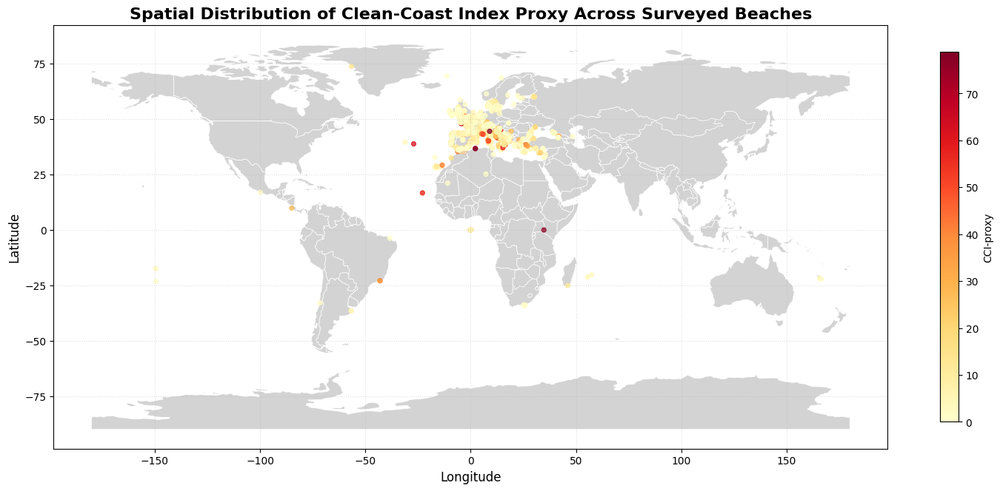

In [127]:
# Cell 22 — Static publication-grade CCI-proxy map
# Fixed for GeoPandas 1.0+

import matplotlib.pyplot as plt
import geopandas as gpd
import os

os.makedirs("Publication_Maps", exist_ok=True)

# Natural Earth world boundaries URL
world_url = (
    "https://naturalearth.s3.amazonaws.com/"
    "110m_cultural/ne_110m_admin_0_countries.zip"
)

# Load world map directly from Natural Earth
world = gpd.read_file(world_url)

# Ensure CRS consistency
world = world.to_crs("EPSG:4326")
gdf = gdf.to_crs("EPSG:4326")

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="lightgray",
    edgecolor="white",
    linewidth=0.5
)

gdf.plot(
    ax=ax,
    column="CCI_proxy",
    cmap="YlOrRd",
    markersize=18,
    alpha=0.75,
    legend=True,
    legend_kwds={
        "label": "CCI-proxy",
        "shrink": 0.65
    }
)

ax.set_title(
    "Spatial Distribution of Clean-Coast Index Proxy Across Surveyed Beaches",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Publication_Maps/Fig_CCI_proxy_geospatial_distribution.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

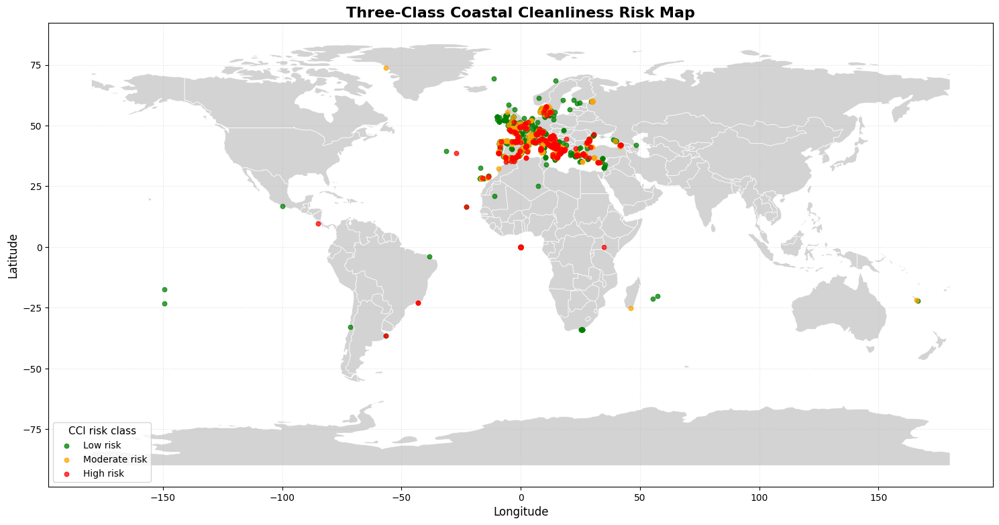

In [128]:
# Cell 23 — Static three-class coastal risk map

import matplotlib.pyplot as plt
import os

os.makedirs("Publication_Maps", exist_ok=True)

risk_colors_3 = {
    "Low risk": "green",
    "Moderate risk": "orange",
    "High risk": "red"
}

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="lightgray",
    edgecolor="white",
    linewidth=0.5
)

for cls, color in risk_colors_3.items():
    subset = gdf[gdf["CCI_class_3"] == cls]
    subset.plot(
        ax=ax,
        color=color,
        markersize=22,
        alpha=0.75,
        label=cls
    )

ax.set_title(
    "Three-Class Coastal Cleanliness Risk Map",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.legend(
    title="CCI risk class",
    fontsize=10,
    title_fontsize=11,
    loc="lower left"
)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Publication_Maps/Fig_3class_CCI_risk_map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

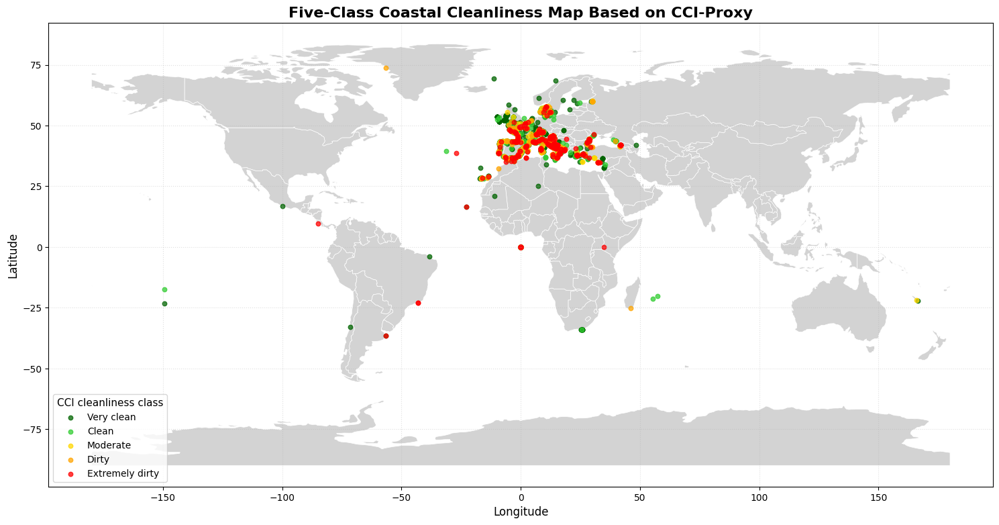

In [129]:
# Cell 24 — Static five-class cleanliness map

import matplotlib.pyplot as plt
import os

os.makedirs("Publication_Maps", exist_ok=True)

risk_colors_5 = {
    "Very clean": "darkgreen",
    "Clean": "limegreen",
    "Moderate": "gold",
    "Dirty": "orange",
    "Extremely dirty": "red"
}

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="lightgray",
    edgecolor="white",
    linewidth=0.5
)

for cls, color in risk_colors_5.items():
    subset = gdf[gdf["CCI_class_5"] == cls]
    subset.plot(
        ax=ax,
        color=color,
        markersize=22,
        alpha=0.75,
        label=cls
    )

ax.set_title(
    "Five-Class Coastal Cleanliness Map Based on CCI-Proxy",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.legend(
    title="CCI cleanliness class",
    fontsize=10,
    title_fontsize=11,
    loc="lower left"
)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Publication_Maps/Fig_5class_CCI_cleanliness_map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [130]:
# Cell 25 — Interactive Folium map for CCI risk visualization

import folium
from folium.plugins import MarkerCluster
import os

os.makedirs("Interactive_Maps", exist_ok=True)

# Center map
center_lat = gdf["lat_mid"].mean()
center_lon = gdf["lon_mid"].mean()

m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=4,
    tiles="CartoDB positron"
)

marker_cluster = MarkerCluster().add_to(m)

def risk_color_3(cls):
    if cls == "Low risk":
        return "green"
    elif cls == "Moderate risk":
        return "orange"
    elif cls == "High risk":
        return "red"
    else:
        return "gray"

for _, row in gdf.iterrows():
    popup_text = f"""
    <b>Country:</b> {row.get('BeachCountrycode', 'NA')}<br>
    <b>Regional Sea:</b> {row.get('BeachRegionalSea', 'NA')}<br>
    <b>Beach Type:</b> {row.get('BeachType', 'NA')}<br>
    <b>Beach Location:</b> {row.get('BeachLocation', 'NA')}<br>
    <b>CCI-proxy:</b> {row.get('CCI_proxy', 0):.2f}<br>
    <b>3-class risk:</b> {row.get('CCI_class_3', 'NA')}<br>
    <b>5-class cleanliness:</b> {row.get('CCI_class_5', 'NA')}
    """

    folium.CircleMarker(
        location=[row["lat_mid"], row["lon_mid"]],
        radius=5,
        popup=folium.Popup(popup_text, max_width=300),
        color=risk_color_3(row["CCI_class_3"]),
        fill=True,
        fill_color=risk_color_3(row["CCI_class_3"]),
        fill_opacity=0.75,
        weight=1
    ).add_to(marker_cluster)

m.save("Interactive_Maps/Interactive_CCI_3Class_Risk_Map.html")

m

In [131]:
# Cell 26 — Interactive heatmap of CCI-proxy intensity

from folium.plugins import HeatMap
import folium
import os

os.makedirs("Interactive_Maps", exist_ok=True)

heat_df = gdf[["lat_mid", "lon_mid", "CCI_proxy"]].dropna().copy()

# Optional cap to reduce dominance of extreme points
heat_df["CCI_for_heatmap"] = heat_df["CCI_proxy"].clip(
    upper=heat_df["CCI_proxy"].quantile(0.95)
)

m_heat = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=4,
    tiles="CartoDB positron"
)

heat_data = heat_df[["lat_mid", "lon_mid", "CCI_for_heatmap"]].values.tolist()

HeatMap(
    heat_data,
    radius=12,
    blur=18,
    max_zoom=8
).add_to(m_heat)

m_heat.save("Interactive_Maps/Interactive_CCI_proxy_heatmap.html")

m_heat

SHAP and Explainability Cells

In [132]:
# Cell 27 — SHAP explanation for best 3-class model
## SHAP explanation for best three-class model
import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

best_cls3_name = cls3_results_df.iloc[0]["Model"]
best_cls3_pipe = trained_cls3_models[best_cls3_name]

print("Best 3-class model:", best_cls3_name)

# Transform test data using fitted preprocessor
X_test_c3_transformed = best_cls3_pipe.named_steps["preprocessor"].transform(X_test_c3)

# Convert sparse to dense if needed
if hasattr(X_test_c3_transformed, "toarray"):
    X_test_c3_transformed = X_test_c3_transformed.toarray()

# Get feature names after preprocessing
feature_names_out = best_cls3_pipe.named_steps["preprocessor"].get_feature_names_out()

X_test_c3_shap = pd.DataFrame(
    X_test_c3_transformed,
    columns=feature_names_out
)

model_c3 = best_cls3_pipe.named_steps["model"]

# TreeExplainer works well for CatBoost, XGBoost, LightGBM, RF, ExtraTrees
explainer_c3 = shap.TreeExplainer(model_c3)

# To reduce CPU load
sample_size = min(500, X_test_c3_shap.shape[0])
X_shap_sample_c3 = X_test_c3_shap.sample(sample_size, random_state=42)

shap_values_c3 = explainer_c3.shap_values(X_shap_sample_c3)

print("SHAP calculation completed for 3-class model.")

Best 3-class model: CatBoost
SHAP calculation completed for 3-class model.


<Figure size 1000x700 with 0 Axes>

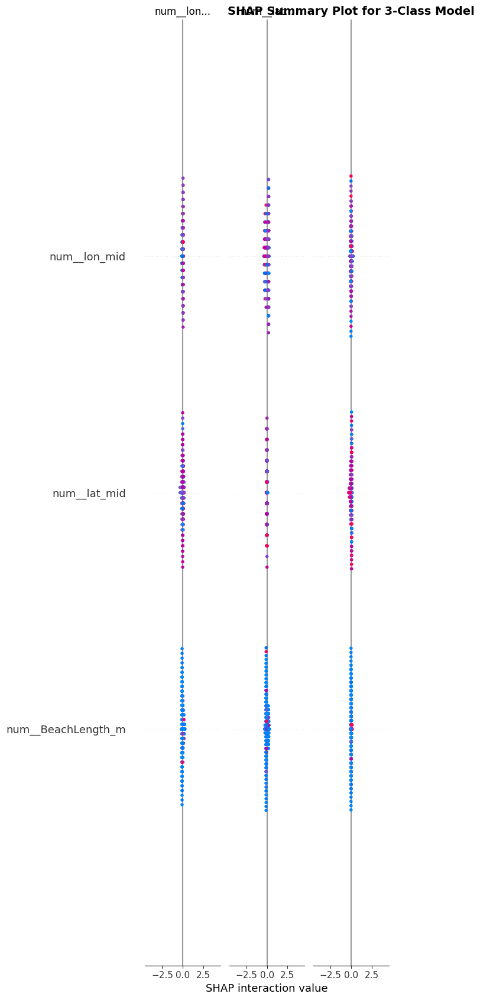

In [133]:
# Cell 28 — SHAP summary plots for 3-class model


import matplotlib.pyplot as plt
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

# For multiclass, shap_values_c3 may be a list
if isinstance(shap_values_c3, list):
    for i, class_name in enumerate(le3.classes_):
        plt.figure(figsize=(10, 7))
        shap.summary_plot(
            shap_values_c3[i],
            X_shap_sample_c3,
            show=False,
            max_display=20
        )
        plt.title(
            f"SHAP Summary Plot for 3-Class Model: {class_name}",
            fontsize=14,
            fontweight="bold"
        )
        plt.tight_layout()
        plt.savefig(
            f"SHAP_Explainability/Fig_SHAP_3class_{class_name.replace(' ', '_')}.png",
            dpi=600,
            bbox_inches="tight"
        )
        plt.show()
else:
    plt.figure(figsize=(10, 7))
    shap.summary_plot(
        shap_values_c3,
        X_shap_sample_c3,
        show=False,
        max_display=20
    )
    plt.title(
        "SHAP Summary Plot for 3-Class Model",
        fontsize=14,
        fontweight="bold"
    )
    plt.tight_layout()
    plt.savefig(
        "SHAP_Explainability/Fig_SHAP_3class_summary.png",
        dpi=600,
        bbox_inches="tight"
    )
    plt.show()

In [135]:
# Cell 29 — SHAP global importance table for 3-class model
# Robust version for list / 2D / 3D SHAP outputs

import numpy as np
import pandas as pd
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

# Convert SHAP values into one global mean absolute importance per feature
if isinstance(shap_values_c3, list):
    # Older SHAP format:
    # list of arrays, one array per class
    # each array shape = (samples, features)
    mean_abs_shap_c3 = np.mean(
        [np.abs(sv).mean(axis=0) for sv in shap_values_c3],
        axis=0
    )

else:
    shap_arr_c3 = np.array(shap_values_c3)

    print("SHAP array shape:", shap_arr_c3.shape)

    if shap_arr_c3.ndim == 2:
        # Shape: (samples, features)
        mean_abs_shap_c3 = np.abs(shap_arr_c3).mean(axis=0)

    elif shap_arr_c3.ndim == 3:
        # Newer SHAP multiclass format
        # Possible shape: (samples, features, classes)
        # Mean across samples and classes, keep features
        if shap_arr_c3.shape[1] == X_shap_sample_c3.shape[1]:
            mean_abs_shap_c3 = np.abs(shap_arr_c3).mean(axis=(0, 2))

        # Alternative possible shape: (classes, samples, features)
        elif shap_arr_c3.shape[2] == X_shap_sample_c3.shape[1]:
            mean_abs_shap_c3 = np.abs(shap_arr_c3).mean(axis=(0, 1))

        else:
            raise ValueError(
                "Could not identify feature dimension in 3D SHAP array. "
                f"SHAP shape: {shap_arr_c3.shape}, "
                f"Number of features: {X_shap_sample_c3.shape[1]}"
            )

    else:
        raise ValueError(
            f"Unsupported SHAP output dimension: {shap_arr_c3.ndim}"
        )

# Final safety flattening
mean_abs_shap_c3 = np.ravel(mean_abs_shap_c3)

print("Number of SHAP importance values:", len(mean_abs_shap_c3))
print("Number of feature names:", len(X_shap_sample_c3.columns))

# Check length match
if len(mean_abs_shap_c3) != len(X_shap_sample_c3.columns):
    raise ValueError(
        "Feature-name length and SHAP-importance length do not match. "
        f"Features: {len(X_shap_sample_c3.columns)}, "
        f"SHAP values: {len(mean_abs_shap_c3)}"
    )

shap_importance_c3 = pd.DataFrame({
    "Feature": X_shap_sample_c3.columns,
    "Mean_abs_SHAP": mean_abs_shap_c3
}).sort_values("Mean_abs_SHAP", ascending=False)

display(shap_importance_c3.head(30))

shap_importance_c3.to_csv(
    "SHAP_Explainability/SHAP_Global_Importance_3Class.csv",
    index=False
)

print("Saved: SHAP_Explainability/SHAP_Global_Importance_3Class.csv")

SHAP array shape: (500, 68, 3)
Number of SHAP importance values: 68
Number of feature names: 68


,Feature,Mean_abs_SHAP
3,num__single_use_per_100m,0.710583
5,num__smoking_per_100m,0.507736
8,num__fragments_per_100m,0.320448
7,num__packaging_per_100m,0.294977
4,num__fishing_per_100m,0.262333
6,num__sanitary_medical_per_100m,0.220411
13,num__metal_per_100m,0.102821
12,num__wood_per_100m,0.076228
14,num__glass_per_100m,0.068832
11,num__paper_per_100m,0.064999


Saved: SHAP_Explainability/SHAP_Global_Importance_3Class.csv


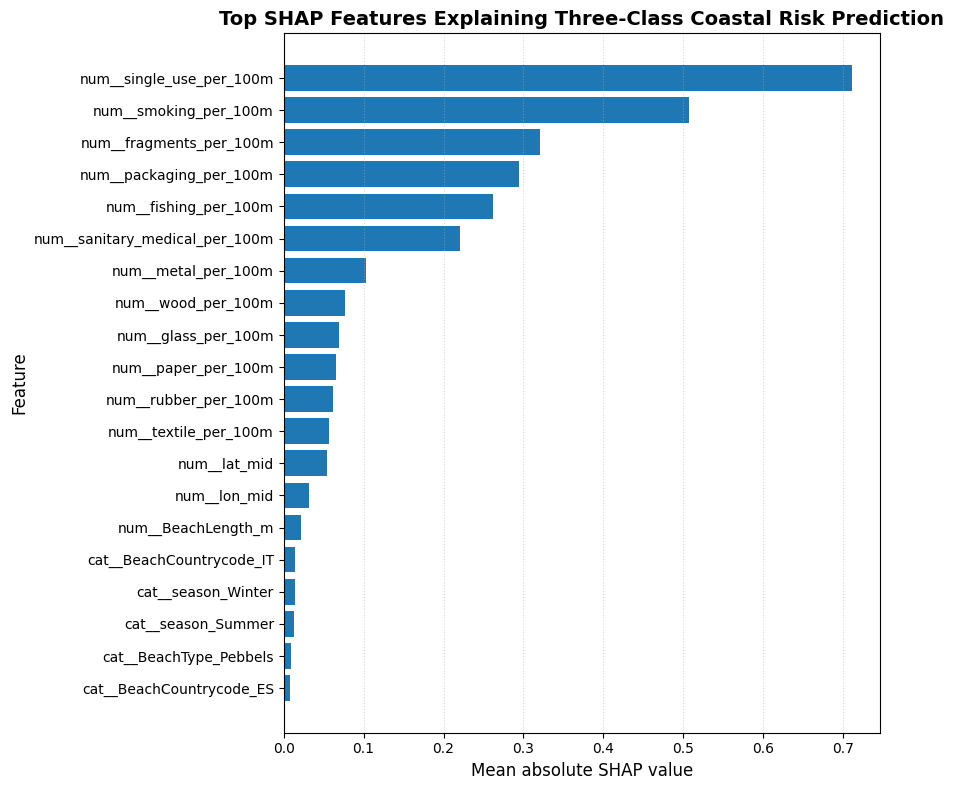


  TOP 20 SHAP VALUES (HIGHEST TO LOWEST)


,Feature,Mean_abs_SHAP
0,num__single_use_per_100m,0.710583
1,num__smoking_per_100m,0.507736
2,num__fragments_per_100m,0.320448
3,num__packaging_per_100m,0.294977
4,num__fishing_per_100m,0.262333
5,num__sanitary_medical_per_100m,0.220411
6,num__metal_per_100m,0.102821
7,num__wood_per_100m,0.076228
8,num__glass_per_100m,0.068832
9,num__paper_per_100m,0.064999


In [138]:
# Cell 30 — Publication-grade SHAP feature-importance bar plot for 3-class model

import matplotlib.pyplot as plt
import seaborn as sns
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

top_n = 20
top_shap_c3 = shap_importance_c3.head(top_n).sort_values(
    "Mean_abs_SHAP",
    ascending=True
)

plt.figure(figsize=(9, 8))

plt.barh(
    top_shap_c3["Feature"],
    top_shap_c3["Mean_abs_SHAP"]
)

plt.xlabel("Mean absolute SHAP value", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.title(
    "Top SHAP Features Explaining Three-Class Coastal Risk Prediction",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="x", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "SHAP_Explainability/Fig_Top_SHAP_Features_3Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# --- Tabular data display for Colab ---
print("\n" + "="*50)
print(f"  TOP {top_n} SHAP VALUES (HIGHEST TO LOWEST)")
print("="*50)

# Displaying in descending order of importance for better table readability
table_view = top_shap_c3.sort_values("Mean_abs_SHAP", ascending=False).reset_index(drop=True)
display(table_view)

In [137]:
# Cell 31 — SHAP explanation for best 5-class model

import shap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

best_cls5_name = cls5_results_df.iloc[0]["Model"]
best_cls5_pipe = trained_cls5_models[best_cls5_name]

print("Best 5-class model:", best_cls5_name)

X_test_c5_transformed = best_cls5_pipe.named_steps["preprocessor"].transform(X_test_c5)

if hasattr(X_test_c5_transformed, "toarray"):
    X_test_c5_transformed = X_test_c5_transformed.toarray()

feature_names_out_5 = best_cls5_pipe.named_steps["preprocessor"].get_feature_names_out()

X_test_c5_shap = pd.DataFrame(
    X_test_c5_transformed,
    columns=feature_names_out_5
)

model_c5 = best_cls5_pipe.named_steps["model"]

explainer_c5 = shap.TreeExplainer(model_c5)

sample_size = min(500, X_test_c5_shap.shape[0])
X_shap_sample_c5 = X_test_c5_shap.sample(sample_size, random_state=42)

shap_values_c5 = explainer_c5.shap_values(X_shap_sample_c5)

print("SHAP calculation completed for 5-class model.")

Best 5-class model: CatBoost
SHAP calculation completed for 5-class model.


In [140]:
# Cell 32 — SHAP global importance table for 5-class model
# Robust version for list / 2D / 3D SHAP outputs

import numpy as np
import pandas as pd
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

# Convert SHAP values into one global mean absolute importance per feature
if isinstance(shap_values_c5, list):
    # Older SHAP format:
    # list of arrays, one array per class
    # each array shape = (samples, features)
    mean_abs_shap_c5 = np.mean(
        [np.abs(sv).mean(axis=0) for sv in shap_values_c5],
        axis=0
    )

else:
    shap_arr_c5 = np.array(shap_values_c5)

    print("SHAP array shape:", shap_arr_c5.shape)

    if shap_arr_c5.ndim == 2:
        # Shape: (samples, features)
        mean_abs_shap_c5 = np.abs(shap_arr_c5).mean(axis=0)

    elif shap_arr_c5.ndim == 3:
        # Newer SHAP multiclass format
        # Common shape: (samples, features, classes)
        if shap_arr_c5.shape[1] == X_shap_sample_c5.shape[1]:
            mean_abs_shap_c5 = np.abs(shap_arr_c5).mean(axis=(0, 2))

        # Alternative shape: (classes, samples, features)
        elif shap_arr_c5.shape[2] == X_shap_sample_c5.shape[1]:
            mean_abs_shap_c5 = np.abs(shap_arr_c5).mean(axis=(0, 1))

        else:
            raise ValueError(
                "Could not identify feature dimension in 3D SHAP array. "
                f"SHAP shape: {shap_arr_c5.shape}, "
                f"Number of features: {X_shap_sample_c5.shape[1]}"
            )

    else:
        raise ValueError(
            f"Unsupported SHAP output dimension: {shap_arr_c5.ndim}"
        )

# Final safety flattening
mean_abs_shap_c5 = np.ravel(mean_abs_shap_c5)

print("Number of SHAP importance values:", len(mean_abs_shap_c5))
print("Number of feature names:", len(X_shap_sample_c5.columns))

# Check length match
if len(mean_abs_shap_c5) != len(X_shap_sample_c5.columns):
    raise ValueError(
        "Feature-name length and SHAP-importance length do not match. "
        f"Features: {len(X_shap_sample_c5.columns)}, "
        f"SHAP values: {len(mean_abs_shap_c5)}"
    )

shap_importance_c5 = pd.DataFrame({
    "Feature": X_shap_sample_c5.columns,
    "Mean_abs_SHAP": mean_abs_shap_c5
}).sort_values("Mean_abs_SHAP", ascending=False)

display(shap_importance_c5.head(30))

shap_importance_c5.to_csv(
    "SHAP_Explainability/SHAP_Global_Importance_5Class.csv",
    index=False
)

print("Saved: SHAP_Explainability/SHAP_Global_Importance_5Class.csv")

SHAP array shape: (500, 68, 5)
Number of SHAP importance values: 68
Number of feature names: 68


,Feature,Mean_abs_SHAP
3,num__single_use_per_100m,0.744440
5,num__smoking_per_100m,0.576362
7,num__packaging_per_100m,0.353040
8,num__fragments_per_100m,0.323743
4,num__fishing_per_100m,0.263063
6,num__sanitary_medical_per_100m,0.218350
13,num__metal_per_100m,0.109055
12,num__wood_per_100m,0.084696
14,num__glass_per_100m,0.079211
10,num__textile_per_100m,0.071911


Saved: SHAP_Explainability/SHAP_Global_Importance_5Class.csv


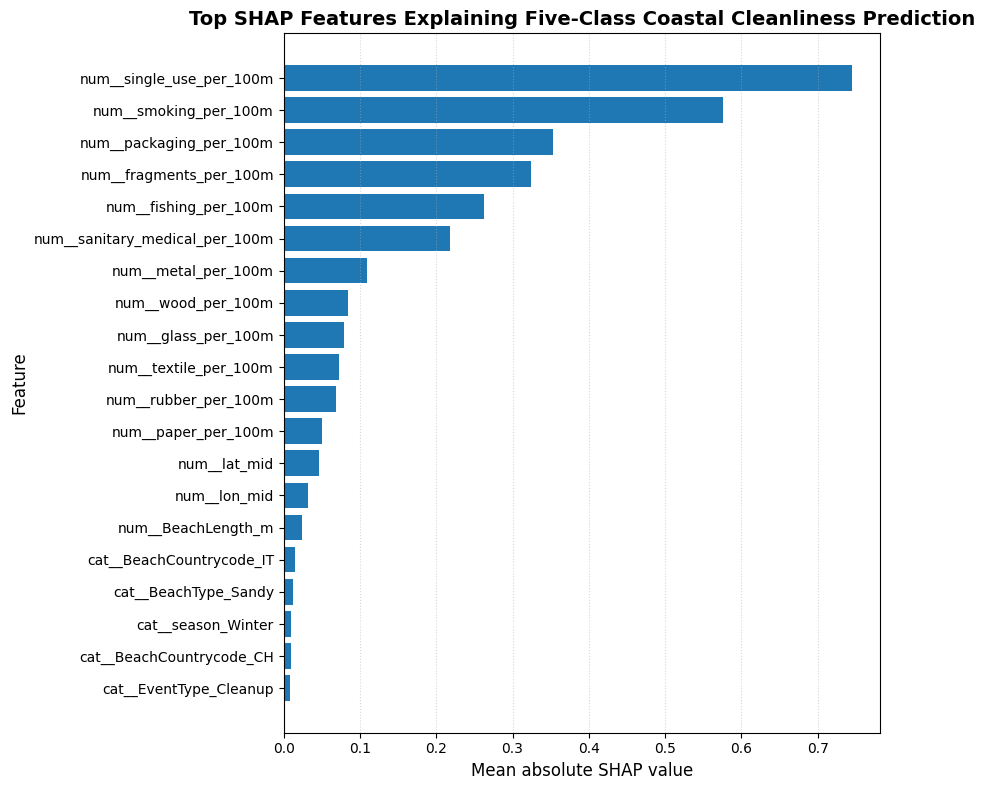


  TOP 20 SHAP VALUES (HIGHEST TO LOWEST)


,Feature,Mean_abs_SHAP
0,num__single_use_per_100m,0.744440
1,num__smoking_per_100m,0.576362
2,num__packaging_per_100m,0.353040
3,num__fragments_per_100m,0.323743
4,num__fishing_per_100m,0.263063
5,num__sanitary_medical_per_100m,0.218350
6,num__metal_per_100m,0.109055
7,num__wood_per_100m,0.084696
8,num__glass_per_100m,0.079211
9,num__textile_per_100m,0.071911


In [142]:
# Cell 33 — Publication-grade SHAP feature-importance bar plot for 5-class model

import matplotlib.pyplot as plt
import os

os.makedirs("SHAP_Explainability", exist_ok=True)

top_n = 20
top_shap_c5 = shap_importance_c5.head(top_n).sort_values(
    "Mean_abs_SHAP",
    ascending=True
)

plt.figure(figsize=(9, 8))

plt.barh(
    top_shap_c5["Feature"],
    top_shap_c5["Mean_abs_SHAP"]
)

plt.xlabel("Mean absolute SHAP value", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.title(
    "Top SHAP Features Explaining Five-Class Coastal Cleanliness Prediction",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="x", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "SHAP_Explainability/Fig_Top_SHAP_Features_5Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()


# --- Tabular data display for Colab ---
print("\n" + "="*50)
print(f"  TOP {top_n} SHAP VALUES (HIGHEST TO LOWEST)")
print("="*50)

# Displaying in descending order of importance for better table readability
table_view_c5 = top_shap_c5.sort_values("Mean_abs_SHAP", ascending=False).reset_index(drop=True)
display(table_view_c5)

CCI Risk Analysis Plots

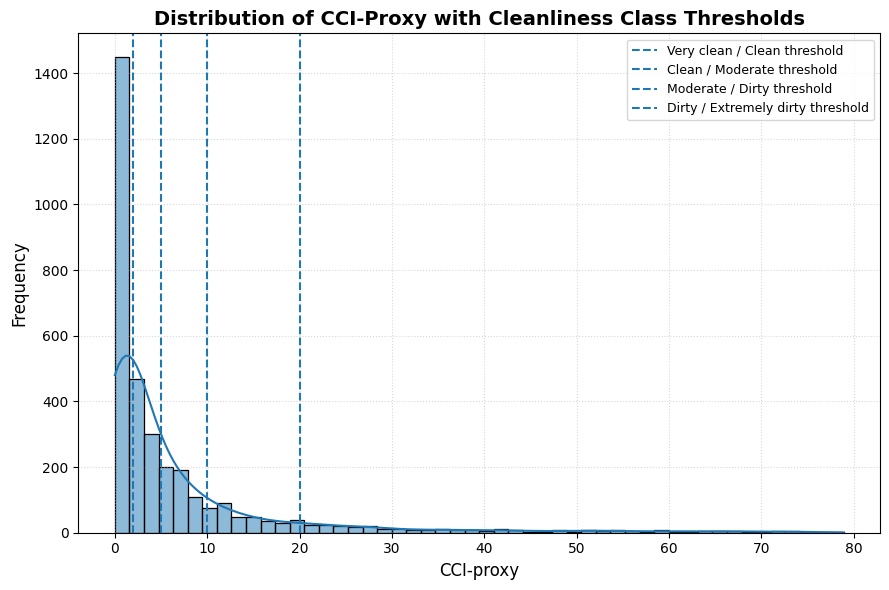

In [143]:
# Cell 34 — Distribution of CCI-proxy

import matplotlib.pyplot as plt
import seaborn as sns
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

plt.figure(figsize=(9, 6))

sns.histplot(
    df_model["CCI_proxy"],
    bins=50,
    kde=True
)

plt.axvline(2, linestyle="--", linewidth=1.5, label="Very clean / Clean threshold")
plt.axvline(5, linestyle="--", linewidth=1.5, label="Clean / Moderate threshold")
plt.axvline(10, linestyle="--", linewidth=1.5, label="Moderate / Dirty threshold")
plt.axvline(20, linestyle="--", linewidth=1.5, label="Dirty / Extremely dirty threshold")

plt.xlabel("CCI-proxy", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.title(
    "Distribution of CCI-Proxy with Cleanliness Class Thresholds",
    fontsize=14,
    fontweight="bold"
)

plt.legend(fontsize=9)
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Risk_Analysis_Plots/Fig_CCI_proxy_distribution_thresholds.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

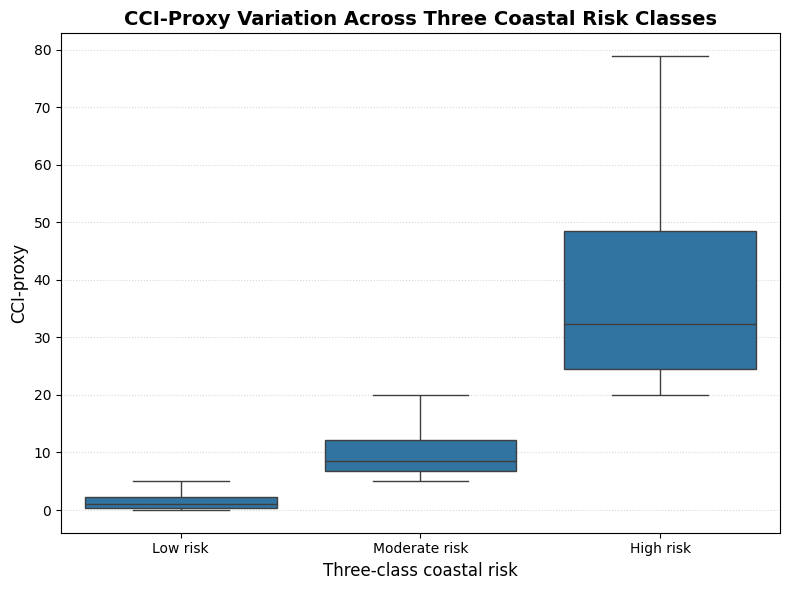

In [144]:
# Cell 35 — CCI-proxy by 3-class risk

import matplotlib.pyplot as plt
import seaborn as sns
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

order_3 = ["Low risk", "Moderate risk", "High risk"]

plt.figure(figsize=(8, 6))

sns.boxplot(
    data=df_model,
    x="CCI_class_3",
    y="CCI_proxy",
    order=order_3
)

plt.xlabel("Three-class coastal risk", fontsize=12)
plt.ylabel("CCI-proxy", fontsize=12)

plt.title(
    "CCI-Proxy Variation Across Three Coastal Risk Classes",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Risk_Analysis_Plots/Fig_CCI_proxy_boxplot_3class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

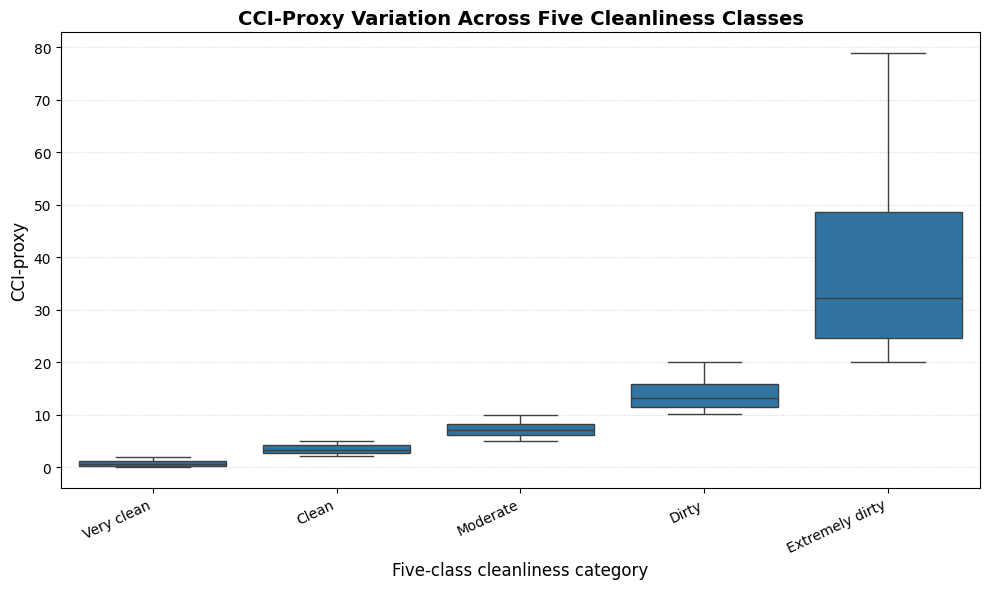

In [145]:
# Cell 36 — CCI-proxy by 5-class cleanliness

import matplotlib.pyplot as plt
import seaborn as sns
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

order_5 = [
    "Very clean",
    "Clean",
    "Moderate",
    "Dirty",
    "Extremely dirty"
]

plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df_model,
    x="CCI_class_5",
    y="CCI_proxy",
    order=order_5
)

plt.xlabel("Five-class cleanliness category", fontsize=12)
plt.ylabel("CCI-proxy", fontsize=12)

plt.title(
    "CCI-Proxy Variation Across Five Cleanliness Classes",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=25, ha="right")
plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Risk_Analysis_Plots/Fig_CCI_proxy_boxplot_5class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m,rubber_per_100m,textile_per_100m,paper_per_100m,wood_per_100m,metal_per_100m,glass_per_100m
CCI_class_3,,,,,,,,,,,,
Low risk,33.554315,5.605639,19.505836,2.787857,15.583449,13.092947,1.217463,2.344037,5.107425,2.136925,8.773986,21.050814
Moderate risk,228.238940,43.912304,115.705203,26.727301,102.831271,100.801926,6.455506,10.579471,22.630474,8.856678,30.476945,75.877942
High risk,876.188699,145.596509,450.581556,141.966475,379.644636,416.051733,12.389040,27.214098,45.720648,22.295409,66.200539,112.373671


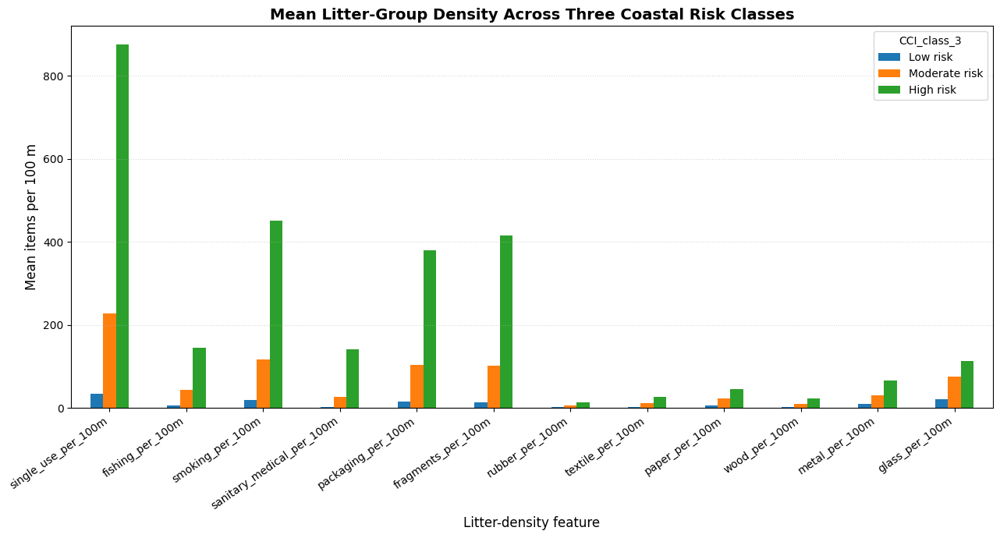

In [146]:
# Cell 37 — Mean litter-group density by 3-class risk

import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

litter_density_cols = [
    "single_use_per_100m",
    "fishing_per_100m",
    "smoking_per_100m",
    "sanitary_medical_per_100m",
    "packaging_per_100m",
    "fragments_per_100m",
    "rubber_per_100m",
    "textile_per_100m",
    "paper_per_100m",
    "wood_per_100m",
    "metal_per_100m",
    "glass_per_100m"
]

available_litter_density_cols = [
    c for c in litter_density_cols if c in df_model.columns
]

risk_profile_3 = df_model.groupby("CCI_class_3")[available_litter_density_cols].mean()
risk_profile_3 = risk_profile_3.loc[order_3]

display(risk_profile_3)

risk_profile_3.T.plot(
    kind="bar",
    figsize=(13, 7)
)

plt.xlabel("Litter-density feature", fontsize=12)
plt.ylabel("Mean items per 100 m", fontsize=12)

plt.title(
    "Mean Litter-Group Density Across Three Coastal Risk Classes",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Risk_Analysis_Plots/Fig_Mean_Litter_Density_3Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

risk_profile_3.to_csv(
    "Risk_Analysis_Plots/Table_Mean_Litter_Density_3Class.csv"
)

,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m,rubber_per_100m,textile_per_100m,paper_per_100m,wood_per_100m,metal_per_100m,glass_per_100m
CCI_class_5,,,,,,,,,,,,
Very clean,15.277491,2.503291,9.056932,1.141496,6.979393,5.941778,0.677781,2.003820,3.396786,1.139435,5.820403,12.273024
Clean,77.988289,13.147961,44.908845,6.790430,36.501328,30.478617,2.529517,3.171160,9.266270,4.561986,15.954633,42.391072
Moderate,166.068673,30.388073,85.162992,17.558027,73.674117,75.387497,5.761202,8.359125,17.407975,5.629528,25.073147,86.403798
Dirty,323.566683,64.649458,162.536593,40.786854,147.538907,139.770716,7.520105,13.984001,30.638307,13.804974,38.762769,59.738297
Extremely dirty,876.188699,145.596509,450.581556,141.966475,379.644636,416.051733,12.389040,27.214098,45.720648,22.295409,66.200539,112.373671


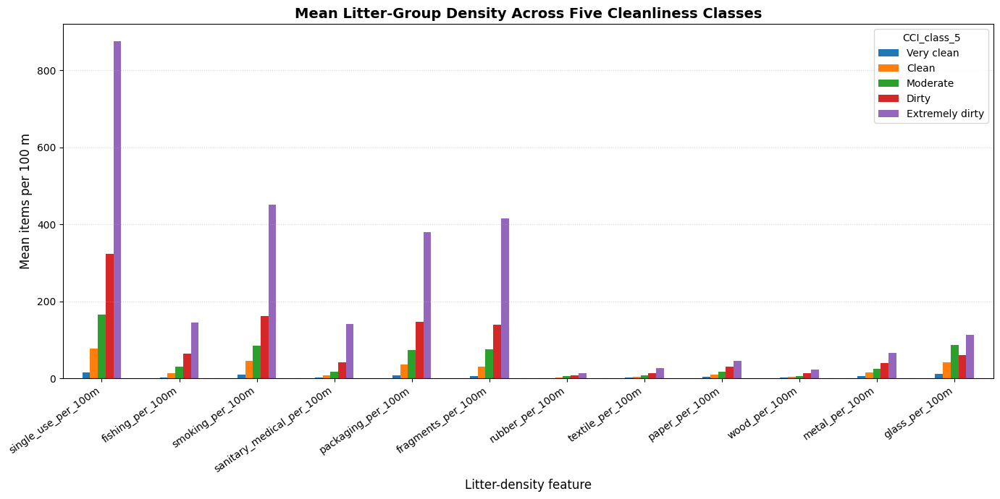

In [147]:
# Cell 38 — Mean litter-group density by 5-class cleanliness

import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

risk_profile_5 = df_model.groupby("CCI_class_5")[available_litter_density_cols].mean()
risk_profile_5 = risk_profile_5.loc[order_5]

display(risk_profile_5)

risk_profile_5.T.plot(
    kind="bar",
    figsize=(14, 7)
)

plt.xlabel("Litter-density feature", fontsize=12)
plt.ylabel("Mean items per 100 m", fontsize=12)

plt.title(
    "Mean Litter-Group Density Across Five Cleanliness Classes",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=35, ha="right")
plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Risk_Analysis_Plots/Fig_Mean_Litter_Density_5Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

risk_profile_5.to_csv(
    "Risk_Analysis_Plots/Table_Mean_Litter_Density_5Class.csv"
)

Model-Derived Risk Map

This is very useful because it maps predicted risk, not only observed CCI class.

In [148]:
# Cell 39 — Add model-predicted risk classes to geospatial dataframe

# Predict on all model records
best_cls3_pipe = trained_cls3_models[best_cls3_name]
best_cls5_pipe = trained_cls5_models[best_cls5_name]

pred3_all_encoded = best_cls3_pipe.predict(X)
pred5_all_encoded = best_cls5_pipe.predict(X)

pred3_all = le3.inverse_transform(pred3_all_encoded)
pred5_all = le5.inverse_transform(pred5_all_encoded)

prediction_df = model_df.copy()
prediction_df["Predicted_CCI_class_3"] = pred3_all
prediction_df["Predicted_CCI_class_5"] = pred5_all

# Merge predicted labels into geospatial data
gdf_pred = gdf.copy()
gdf_pred["Predicted_CCI_class_3"] = prediction_df.loc[gdf_pred.index, "Predicted_CCI_class_3"]
gdf_pred["Predicted_CCI_class_5"] = prediction_df.loc[gdf_pred.index, "Predicted_CCI_class_5"]

display(gdf_pred[[
    "CCI_class_3",
    "Predicted_CCI_class_3",
    "CCI_class_5",
    "Predicted_CCI_class_5",
    "CCI_proxy",
    "lon_mid",
    "lat_mid"
]].head())

,CCI_class_3,Predicted_CCI_class_3,CCI_class_5,Predicted_CCI_class_5,CCI_proxy,lon_mid,lat_mid
0,Low risk,Low risk,Very clean,Very clean,0.073162,28.569571,43.669423
1,Low risk,Low risk,Very clean,Very clean,0.326154,28.569571,43.669423
2,Low risk,Low risk,Very clean,Very clean,0.071795,28.569571,43.669423
3,Low risk,Low risk,Very clean,Very clean,0.349402,28.569571,43.669423
4,Moderate risk,Moderate risk,Dirty,Dirty,10.120000,0.000135,0.000361


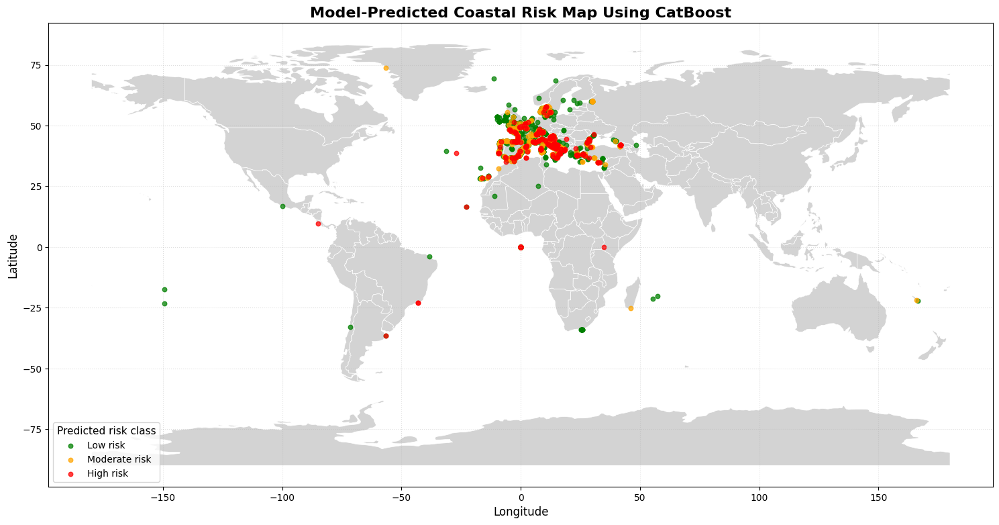

In [149]:
# Cell 40 — Predicted 3-class coastal risk map

import matplotlib.pyplot as plt
import os

os.makedirs("Publication_Maps", exist_ok=True)

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="lightgray",
    edgecolor="white",
    linewidth=0.5
)

for cls, color in risk_colors_3.items():
    subset = gdf_pred[gdf_pred["Predicted_CCI_class_3"] == cls]
    subset.plot(
        ax=ax,
        color=color,
        markersize=22,
        alpha=0.75,
        label=cls
    )

ax.set_title(
    f"Model-Predicted Coastal Risk Map Using {best_cls3_name}",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.legend(
    title="Predicted risk class",
    fontsize=10,
    title_fontsize=11,
    loc="lower left"
)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Publication_Maps/Fig_Model_Predicted_3Class_Risk_Map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [150]:
# Cell 41 — Descriptive statistics of CCI-proxy by risk class

import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

cci_stats_3 = df_model.groupby("CCI_class_3")["CCI_proxy"].agg(
    ["count", "mean", "std", "median", "min", "max"]
).loc[["Low risk", "Moderate risk", "High risk"]]

cci_stats_5 = df_model.groupby("CCI_class_5")["CCI_proxy"].agg(
    ["count", "mean", "std", "median", "min", "max"]
).loc[["Very clean", "Clean", "Moderate", "Dirty", "Extremely dirty"]]

print("CCI-proxy descriptive statistics by 3-class risk:")
display(cci_stats_3)

print("CCI-proxy descriptive statistics by 5-class cleanliness:")
display(cci_stats_5)

cci_stats_3.to_csv("Statistical_Analysis/Table_CCI_Stats_3Class.csv")
cci_stats_5.to_csv("Statistical_Analysis/Table_CCI_Stats_5Class.csv")

CCI-proxy descriptive statistics by 3-class risk:


,count,mean,std,median,min,max
CCI_class_3,,,,,,
Low risk,2268,1.450800,1.406951,0.968536,0.000000,5.000000
Moderate risk,798,9.801887,3.838802,8.585859,5.018667,20.000000
High risk,307,37.650792,15.930878,32.285714,20.037736,78.901099


CCI-proxy descriptive statistics by 5-class cleanliness:


,count,mean,std,median,min,max
CCI_class_5,,,,,,
Very clean,1607,0.661425,0.586562,0.509333,0.000000,2.000000
Clean,661,3.369899,0.869719,3.280000,2.005333,5.000000
Moderate,483,7.167972,1.365193,7.061728,5.018667,10.000000
Dirty,315,13.840557,2.740266,13.201072,10.020000,20.000000
Extremely dirty,307,37.650792,15.930878,32.285714,20.037736,78.901099


In [151]:
# Cell 42 — Normality test for CCI-proxy

from scipy.stats import shapiro, normaltest
import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

# Shapiro can be sensitive for large samples, so sample up to 5000
sample_cci = df_model["CCI_proxy"].dropna()

if len(sample_cci) > 5000:
    sample_cci = sample_cci.sample(5000, random_state=42)

shapiro_stat, shapiro_p = shapiro(sample_cci)
dagostino_stat, dagostino_p = normaltest(sample_cci)

normality_df = pd.DataFrame({
    "Test": ["Shapiro-Wilk", "D'Agostino-Pearson"],
    "Statistic": [shapiro_stat, dagostino_stat],
    "p_value": [shapiro_p, dagostino_p]
})

display(normality_df)

normality_df.to_csv(
    "Statistical_Analysis/Table_CCI_Normality_Tests.csv",
    index=False
)

,Test,Statistic,p_value
0,Shapiro-Wilk,0.586223,3.401844e-67
1,D'Agostino-Pearson,2276.015025,0.000000e+00


In [152]:
# Cell 43 — Kruskal-Wallis test for CCI differences across classes

from scipy.stats import kruskal
import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

# 3-class Kruskal-Wallis
groups_3 = [
    df_model[df_model["CCI_class_3"] == cls]["CCI_proxy"].dropna()
    for cls in ["Low risk", "Moderate risk", "High risk"]
]

kw3_stat, kw3_p = kruskal(*groups_3)

# 5-class Kruskal-Wallis
groups_5 = [
    df_model[df_model["CCI_class_5"] == cls]["CCI_proxy"].dropna()
    for cls in ["Very clean", "Clean", "Moderate", "Dirty", "Extremely dirty"]
]

kw5_stat, kw5_p = kruskal(*groups_5)

kruskal_df = pd.DataFrame({
    "Target": ["3-class risk", "5-class cleanliness"],
    "Kruskal_H": [kw3_stat, kw5_stat],
    "p_value": [kw3_p, kw5_p]
})

display(kruskal_df)

kruskal_df.to_csv(
    "Statistical_Analysis/Table_Kruskal_Wallis_CCI_Classes.csv",
    index=False
)

,Target,Kruskal_H,p_value
0,3-class risk,2299.957963,0.0
1,5-class cleanliness,2967.105489,0.0


In [153]:
# Cell 44 — Effect size for class-wise CCI differences

import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

def eta_squared_from_kruskal(H, n, k):
    return (H - k + 1) / (n - k)

n3 = sum(len(g) for g in groups_3)
k3 = len(groups_3)

n5 = sum(len(g) for g in groups_5)
k5 = len(groups_5)

eta3 = eta_squared_from_kruskal(kw3_stat, n3, k3)
eta5 = eta_squared_from_kruskal(kw5_stat, n5, k5)

effect_df = pd.DataFrame({
    "Target": ["3-class risk", "5-class cleanliness"],
    "N": [n3, n5],
    "Number_of_groups": [k3, k5],
    "Eta_squared_approx": [eta3, eta5]
})

display(effect_df)

effect_df.to_csv(
    "Statistical_Analysis/Table_Kruskal_Effect_Size.csv",
    index=False
)

,Target,N,Number_of_groups,Eta_squared_approx
0,3-class risk,3373,3,0.681887
1,5-class cleanliness,3373,5,0.879782


In [154]:
# Cell 45 — Pairwise Mann-Whitney U tests between CCI classes

from scipy.stats import mannwhitneyu
from itertools import combinations
import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

def pairwise_mannwhitney(data, class_col, value_col, class_order):
    results = []

    for c1, c2 in combinations(class_order, 2):
        x = data[data[class_col] == c1][value_col].dropna()
        y = data[data[class_col] == c2][value_col].dropna()

        stat, p = mannwhitneyu(x, y, alternative="two-sided")

        results.append({
            "Class_1": c1,
            "Class_2": c2,
            "U_statistic": stat,
            "p_value": p
        })

    result_df = pd.DataFrame(results)

    # Bonferroni correction
    result_df["p_value_bonferroni"] = (
        result_df["p_value"] * len(result_df)
    ).clip(upper=1.0)

    return result_df

pairwise_3 = pairwise_mannwhitney(
    df_model,
    "CCI_class_3",
    "CCI_proxy",
    ["Low risk", "Moderate risk", "High risk"]
)

pairwise_5 = pairwise_mannwhitney(
    df_model,
    "CCI_class_5",
    "CCI_proxy",
    ["Very clean", "Clean", "Moderate", "Dirty", "Extremely dirty"]
)

print("Pairwise tests for 3-class risk:")
display(pairwise_3)

print("Pairwise tests for 5-class cleanliness:")
display(pairwise_5)

pairwise_3.to_csv(
    "Statistical_Analysis/Table_Pairwise_MannWhitney_3Class.csv",
    index=False
)

pairwise_5.to_csv(
    "Statistical_Analysis/Table_Pairwise_MannWhitney_5Class.csv",
    index=False
)

Pairwise tests for 3-class risk:


,Class_1,Class_2,U_statistic,p_value,p_value_bonferroni
0,Low risk,Moderate risk,0.0,0.000000e+00,0.000000e+00
1,Low risk,High risk,0.0,2.103019e-178,6.309057e-178
2,Moderate risk,High risk,0.0,1.557324e-146,4.671971e-146


Pairwise tests for 5-class cleanliness:


,Class_1,Class_2,U_statistic,p_value,p_value_bonferroni
0,Very clean,Clean,0.0,1.760849e-307,1.760849e-306
1,Very clean,Moderate,0.0,2.816872e-244,2.816872e-243
2,Very clean,Dirty,0.0,7.350602e-174,7.350602e-173
3,Very clean,Extremely dirty,0.0,3.379721e-170,3.379721e-169
4,Clean,Moderate,0.0,6.278166e-184,6.278166e-183
5,Clean,Dirty,0.0,4.635467e-141,4.635467e-140
6,Clean,Extremely dirty,0.0,1.198835e-138,1.198835e-137
7,Moderate,Dirty,0.0,2.997067e-126,2.997067e-125
8,Moderate,Extremely dirty,0.0,2.557602e-124,2.557602e-123
9,Dirty,Extremely dirty,0.0,2.808036e-103,2.808036e-102


,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m,rubber_per_100m,textile_per_100m,paper_per_100m,wood_per_100m,metal_per_100m,glass_per_100m,CCI_proxy
single_use_per_100m,1.000000,0.654984,0.490583,0.612192,0.915785,0.827205,0.455391,0.541617,0.241123,0.322246,0.520667,0.521833,0.932262
fishing_per_100m,0.654984,1.000000,0.248141,0.550114,0.638657,0.566701,0.424040,0.482715,0.129276,0.325893,0.294720,0.376548,0.655890
smoking_per_100m,0.490583,0.248141,1.000000,0.413671,0.498271,0.381697,0.312770,0.344377,0.408970,0.258677,0.523267,0.392883,0.659845
sanitary_medical_per_100m,0.612192,0.550114,0.413671,1.000000,0.602660,0.534046,0.441131,0.459619,0.207327,0.359242,0.377997,0.350055,0.657916
packaging_per_100m,0.915785,0.638657,0.498271,0.602660,1.000000,0.659214,0.465287,0.538758,0.272581,0.342470,0.519286,0.489279,0.879602
fragments_per_100m,0.827205,0.566701,0.381697,0.534046,0.659214,1.000000,0.425809,0.453744,0.231496,0.312726,0.418009,0.463828,0.769370
rubber_per_100m,0.455391,0.424040,0.312770,0.441131,0.465287,0.425809,1.000000,0.411621,0.381763,0.473212,0.411080,0.345382,0.490464
textile_per_100m,0.541617,0.482715,0.344377,0.459619,0.538758,0.453744,0.411621,1.000000,0.269459,0.312660,0.446826,0.431138,0.548458
paper_per_100m,0.241123,0.129276,0.408970,0.207327,0.272581,0.231496,0.381763,0.269459,1.000000,0.491315,0.458933,0.266964,0.322792
wood_per_100m,0.322246,0.325893,0.258677,0.359242,0.342470,0.312726,0.473212,0.312660,0.491315,1.000000,0.321909,0.251046,0.377958


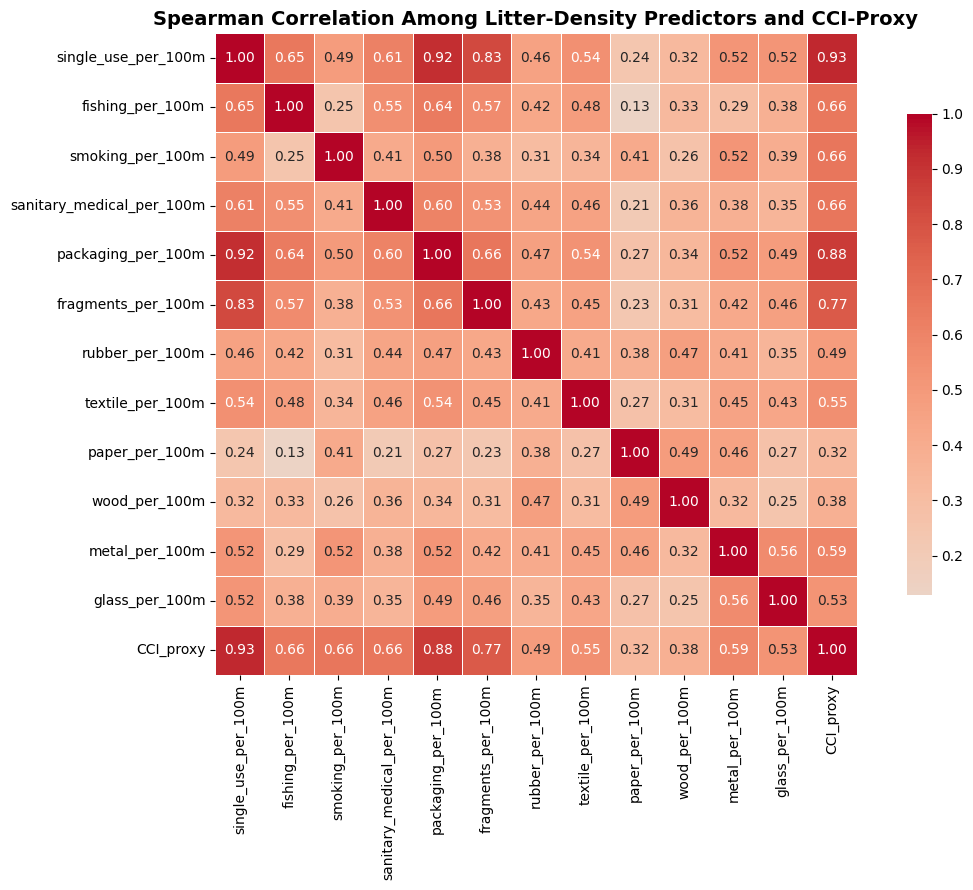

In [155]:
# Cell 46 — Correlation analysis among engineered litter-density predictors

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

density_cols = [
    "single_use_per_100m",
    "fishing_per_100m",
    "smoking_per_100m",
    "sanitary_medical_per_100m",
    "packaging_per_100m",
    "fragments_per_100m",
    "rubber_per_100m",
    "textile_per_100m",
    "paper_per_100m",
    "wood_per_100m",
    "metal_per_100m",
    "glass_per_100m",
    "CCI_proxy"
]

density_cols = [c for c in density_cols if c in df_model.columns]

corr_df = df_model[density_cols].corr(method="spearman")

display(corr_df)

plt.figure(figsize=(12, 9))

sns.heatmap(
    corr_df,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    square=True,
    linewidths=0.5,
    cbar_kws={"shrink": 0.75}
)

plt.title(
    "Spearman Correlation Among Litter-Density Predictors and CCI-Proxy",
    fontsize=14,
    fontweight="bold"
)

plt.tight_layout()

plt.savefig(
    "Statistical_Analysis/Fig_Spearman_Correlation_Litter_Features.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

corr_df.to_csv("Statistical_Analysis/Table_Spearman_Correlation.csv")

,Feature,Spearman_rho_with_CCI,p_value
0,single_use_per_100m,0.932262,0.000000e+00
4,packaging_per_100m,0.879602,0.000000e+00
5,fragments_per_100m,0.769370,0.000000e+00
2,smoking_per_100m,0.659845,0.000000e+00
3,sanitary_medical_per_100m,0.657916,0.000000e+00
1,fishing_per_100m,0.655890,0.000000e+00
10,metal_per_100m,0.592390,9.710366e-319
7,textile_per_100m,0.548458,2.936666e-264
11,glass_per_100m,0.527914,1.890797e-241
6,rubber_per_100m,0.490464,1.056019e-203


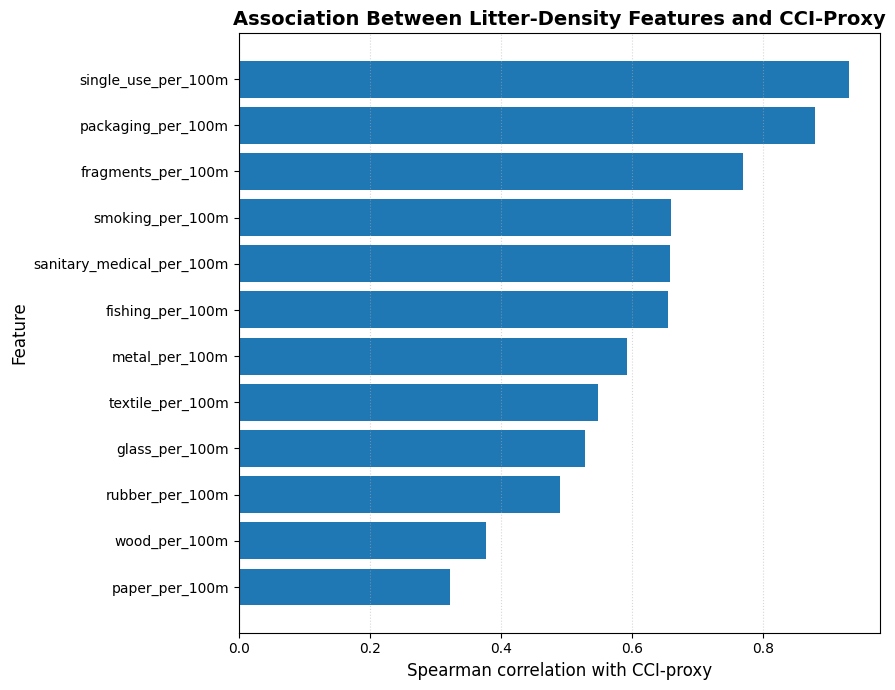

In [156]:
# Cell 47 — Feature-wise Spearman correlation with CCI-proxy

from scipy.stats import spearmanr
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Statistical_Analysis", exist_ok=True)

corr_results = []

for col in density_cols:
    if col != "CCI_proxy":
        temp = df_model[[col, "CCI_proxy"]].dropna()
        rho, p = spearmanr(temp[col], temp["CCI_proxy"])

        corr_results.append({
            "Feature": col,
            "Spearman_rho_with_CCI": rho,
            "p_value": p
        })

feature_corr_df = pd.DataFrame(corr_results).sort_values(
    "Spearman_rho_with_CCI",
    ascending=False
)

display(feature_corr_df)

feature_corr_df.to_csv(
    "Statistical_Analysis/Table_Feature_CCI_Spearman_Correlation.csv",
    index=False
)

# Plot
plot_df = feature_corr_df.sort_values("Spearman_rho_with_CCI")

plt.figure(figsize=(9, 7))

plt.barh(
    plot_df["Feature"],
    plot_df["Spearman_rho_with_CCI"]
)

plt.xlabel("Spearman correlation with CCI-proxy", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.title(
    "Association Between Litter-Density Features and CCI-Proxy",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="x", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Statistical_Analysis/Fig_Feature_CCI_Spearman_Correlation.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [157]:
# Cell 48 — Country-wise CCI risk summary

import pandas as pd
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

country_summary = df_model.groupby("BeachCountrycode").agg(
    Survey_Count=("CCI_proxy", "count"),
    Mean_CCI=("CCI_proxy", "mean"),
    Median_CCI=("CCI_proxy", "median"),
    Max_CCI=("CCI_proxy", "max"),
    High_Risk_Count=("CCI_class_3", lambda x: (x == "High risk").sum()),
    Moderate_Risk_Count=("CCI_class_3", lambda x: (x == "Moderate risk").sum()),
    Low_Risk_Count=("CCI_class_3", lambda x: (x == "Low risk").sum())
).reset_index()

country_summary["High_Risk_Percent"] = (
    country_summary["High_Risk_Count"] /
    country_summary["Survey_Count"] * 100
)

country_summary = country_summary.sort_values(
    ["High_Risk_Percent", "Mean_CCI"],
    ascending=False
)

display(country_summary.head(30))

country_summary.to_csv(
    "Risk_Analysis_Plots/Table_Country_Wise_CCI_Risk_Summary.csv",
    index=False
)

,BeachCountrycode,Survey_Count,Mean_CCI,Median_CCI,Max_CCI,High_Risk_Count,Moderate_Risk_Count,Low_Risk_Count,High_Risk_Percent
8,DZ,2,73.736264,73.736264,78.901099,2,0,0,100.000000
22,MA,3,43.054454,41.569892,72.920000,2,1,0,66.666667
14,GE,20,21.414914,21.740000,56.452830,11,4,5,55.000000
4,CV,2,29.160000,29.160000,58.320000,1,0,1,50.000000
0,BA,2,14.579274,14.579274,26.302326,1,0,1,50.000000
5,CY,7,15.712272,19.596154,27.072727,3,2,2,42.857143
16,HR,4,10.129372,5.742955,28.800000,1,1,2,25.000000
1,BE,4,7.808874,0.367253,30.405797,1,0,3,25.000000
28,RO,138,14.010534,5.227124,76.616822,34,36,68,24.637681
20,Int,23,13.152931,5.897436,74.386364,5,7,11,21.739130


In [158]:
# Cell 49 — Top high-risk beach locations

import pandas as pd
import os

os.makedirs("Risk_Analysis_Plots", exist_ok=True)

top_high_risk_locations = df_model.sort_values(
    "CCI_proxy",
    ascending=False
)[[
    "BeachCountrycode",
    "BeachRegionalSea",
    "BeachLocation",
    "BeachType",
    "EventDate",
    "BeachLength_m",
    "CCI_proxy",
    "CCI_class_3",
    "CCI_class_5",
    "plastic_litter",
    "total_litter"
]].head(50)

display(top_high_risk_locations)

top_high_risk_locations.to_csv(
    "Risk_Analysis_Plots/Table_Top_50_High_Risk_Beach_Records.csv",
    index=False
)

,BeachCountrycode,BeachRegionalSea,BeachLocation,BeachType,EventDate,BeachLength_m,CCI_proxy,CCI_class_3,CCI_class_5,plastic_litter,total_litter
535,DZ,Mediterranean Sea,NaN,NaN,2016-03-19,91,78.901099,High risk,Extremely dirty,3590.0,3784.0
3388,IT,Mediterranean Sea,NaN,NaN,2019-05-12,350,77.697143,High risk,Extremely dirty,13597.0,16440.0
1750,RO,Black Sea,Urban,Sandy,2020-11-05,107,76.616822,High risk,Extremely dirty,4099.0,4833.0
427,NaN,Unknown,Rural,Other (mixed),2020-12-12,130,76.061538,High risk,Extremely dirty,4944.0,4964.0
648,Int,Mediterranean Sea,NaN,NaN,2015-03-20,88,74.386364,High risk,Extremely dirty,3273.0,4489.0
2053,IT,Mediterranean Sea,NaN,NaN,2017-04-20,100,73.640000,High risk,Extremely dirty,3682.0,3999.0
1844,ES,North-east Atlantic Ocean,NaN,NaN,2015-03-21,81,73.111111,High risk,Extremely dirty,2961.0,3041.0
1814,RO,Black Sea,Urban,Sandy,2019-09-18,107,73.102804,High risk,Extremely dirty,3911.0,5121.0
1561,MA,Mediterranean Sea,NaN,NaN,2019-09-15,150,72.920000,High risk,Extremely dirty,5469.0,5707.0
1090,GR,Mediterranean Sea,Rural,Other (mixed),2018-04-04,51,72.274510,High risk,Extremely dirty,1843.0,1857.0


,Observed,Predicted,Confidence,Correct
0,Low risk,Low risk,0.967239,True
1,Low risk,Low risk,0.999453,True
2,Low risk,Low risk,0.991196,True
3,Low risk,Low risk,0.999606,True
4,High risk,High risk,0.774622,True


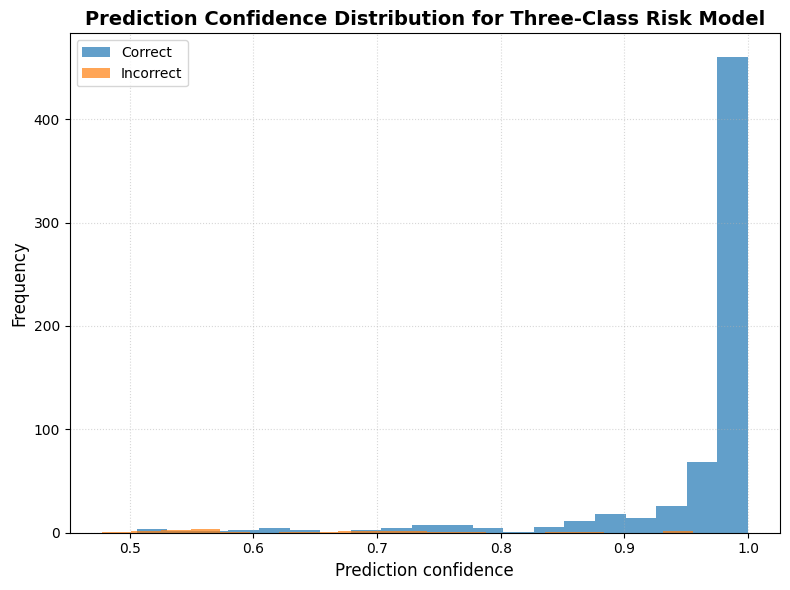

In [159]:
# Cell 50 — Prediction confidence analysis for 3-class model

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Model_Reliability", exist_ok=True)

best_cls3_pipe = trained_cls3_models[best_cls3_name]

# Predict probabilities
proba3 = best_cls3_pipe.predict_proba(X_test_c3)
pred3 = np.argmax(proba3, axis=1)

confidence3 = np.max(proba3, axis=1)
correct3 = pred3 == y_test_c3

confidence_df_3 = pd.DataFrame({
    "Observed": le3.inverse_transform(y_test_c3),
    "Predicted": le3.inverse_transform(pred3),
    "Confidence": confidence3,
    "Correct": correct3
})

display(confidence_df_3.head())

confidence_df_3.to_csv(
    "Model_Reliability/Table_3Class_Prediction_Confidence.csv",
    index=False
)

plt.figure(figsize=(8, 6))

plt.hist(
    confidence_df_3[confidence_df_3["Correct"] == True]["Confidence"],
    bins=20,
    alpha=0.7,
    label="Correct"
)

plt.hist(
    confidence_df_3[confidence_df_3["Correct"] == False]["Confidence"],
    bins=20,
    alpha=0.7,
    label="Incorrect"
)

plt.xlabel("Prediction confidence", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.title(
    "Prediction Confidence Distribution for Three-Class Risk Model",
    fontsize=14,
    fontweight="bold"
)

plt.legend()
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Model_Reliability/Fig_3Class_Prediction_Confidence.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

,Observed,Predicted,Confidence,Correct
0,Very clean,Very clean,0.991720,True
1,Clean,Clean,0.660335,True
2,Clean,Moderate,0.602278,False
3,Very clean,Very clean,0.985414,True
4,Very clean,Very clean,0.998407,True


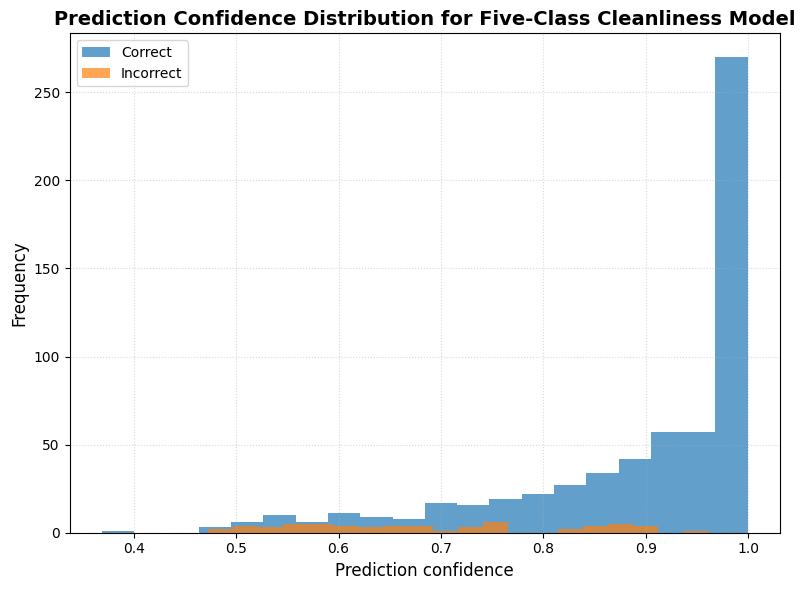

In [160]:
# Cell 51 — Prediction confidence analysis for 5-class model

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Model_Reliability", exist_ok=True)

best_cls5_pipe = trained_cls5_models[best_cls5_name]

proba5 = best_cls5_pipe.predict_proba(X_test_c5)
pred5 = np.argmax(proba5, axis=1)

confidence5 = np.max(proba5, axis=1)
correct5 = pred5 == y_test_c5

confidence_df_5 = pd.DataFrame({
    "Observed": le5.inverse_transform(y_test_c5),
    "Predicted": le5.inverse_transform(pred5),
    "Confidence": confidence5,
    "Correct": correct5
})

display(confidence_df_5.head())

confidence_df_5.to_csv(
    "Model_Reliability/Table_5Class_Prediction_Confidence.csv",
    index=False
)

plt.figure(figsize=(8, 6))

plt.hist(
    confidence_df_5[confidence_df_5["Correct"] == True]["Confidence"],
    bins=20,
    alpha=0.7,
    label="Correct"
)

plt.hist(
    confidence_df_5[confidence_df_5["Correct"] == False]["Confidence"],
    bins=20,
    alpha=0.7,
    label="Incorrect"
)

plt.xlabel("Prediction confidence", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.title(
    "Prediction Confidence Distribution for Five-Class Cleanliness Model",
    fontsize=14,
    fontweight="bold"
)

plt.legend()
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Model_Reliability/Fig_5Class_Prediction_Confidence.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

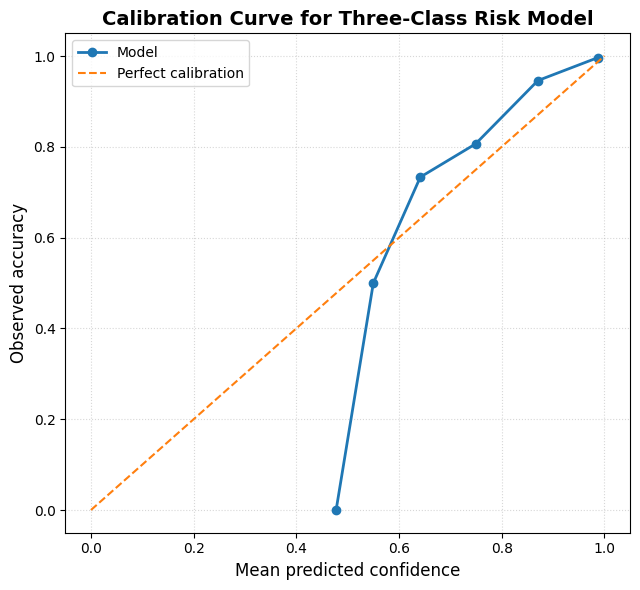

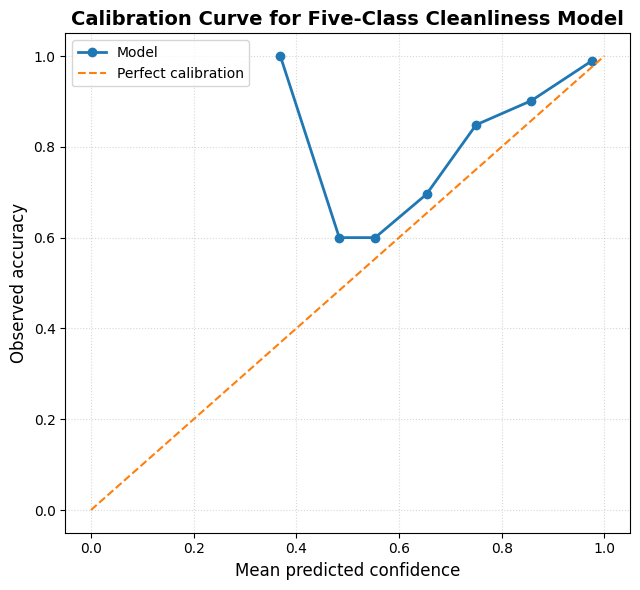

In [161]:
# Cell 52 — Multiclass calibration curve using maximum predicted probability

from sklearn.calibration import calibration_curve
import matplotlib.pyplot as plt
import numpy as np
import os

os.makedirs("Model_Reliability", exist_ok=True)

def plot_confidence_calibration(confidence, correct, title, save_path):
    prob_true, prob_pred = calibration_curve(
        correct.astype(int),
        confidence,
        n_bins=10,
        strategy="uniform"
    )

    plt.figure(figsize=(6.5, 6))

    plt.plot(
        prob_pred,
        prob_true,
        marker="o",
        linewidth=2,
        label="Model"
    )

    plt.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        linewidth=1.5,
        label="Perfect calibration"
    )

    plt.xlabel("Mean predicted confidence", fontsize=12)
    plt.ylabel("Observed accuracy", fontsize=12)

    plt.title(title, fontsize=14, fontweight="bold")

    plt.legend()
    plt.grid(True, linestyle=":", alpha=0.5)

    plt.tight_layout()

    plt.savefig(save_path, dpi=600, bbox_inches="tight")
    plt.show()

plot_confidence_calibration(
    confidence_df_3["Confidence"].values,
    confidence_df_3["Correct"].values,
    "Calibration Curve for Three-Class Risk Model",
    "Model_Reliability/Fig_3Class_Calibration_Curve.png"
)

plot_confidence_calibration(
    confidence_df_5["Confidence"].values,
    confidence_df_5["Correct"].values,
    "Calibration Curve for Five-Class Cleanliness Model",
    "Model_Reliability/Fig_5Class_Calibration_Curve.png"
)

In [162]:
# Cell 53 — Misclassification analysis for 3-class model

import pandas as pd
import os

os.makedirs("Model_Reliability", exist_ok=True)

misclassified_3 = confidence_df_3[
    confidence_df_3["Correct"] == False
].copy()

misclass_summary_3 = misclassified_3.groupby(
    ["Observed", "Predicted"]
).size().reset_index(name="Count").sort_values(
    "Count",
    ascending=False
)

print("3-class misclassification summary:")
display(misclass_summary_3)

misclass_summary_3.to_csv(
    "Model_Reliability/Table_3Class_Misclassification_Summary.csv",
    index=False
)

3-class misclassification summary:


,Observed,Predicted,Count
3,Moderate risk,Low risk,14
0,High risk,Moderate risk,4
2,Moderate risk,High risk,4
1,Low risk,Moderate risk,3


In [164]:
# Cell 54 — Misclassification analysis for 5-class model

import pandas as pd
import os

os.makedirs("Model_Reliability", exist_ok=True)

misclassified_5 = confidence_df_5[
    confidence_df_5["Correct"] == False
].copy()

misclass_summary_5 = misclassified_5.groupby(
    ["Observed", "Predicted"]
).size().reset_index(name="Count").sort_values(
    "Count",
    ascending=False
)

print("5-class misclassification summary:")
display(misclass_summary_5)

misclass_summary_5.to_csv(
    "Model_Reliability/Table_5Class_Misclassification_Summary.csv",
    index=False
)

5-class misclassification summary:


,Observed,Predicted,Count
5,Moderate,Clean,13
0,Clean,Moderate,11
3,Dirty,Moderate,8
1,Clean,Very clean,8
7,Very clean,Clean,8
4,Extremely dirty,Dirty,7
6,Moderate,Dirty,3
2,Dirty,Extremely dirty,2


In [165]:
# Cell 55 — Bootstrap confidence intervals for classification metrics

from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import pandas as pd
import os

os.makedirs("Model_Reliability", exist_ok=True)

def bootstrap_metric_ci(y_true, y_pred, class_name, n_bootstrap=1000, random_state=42):
    rng = np.random.default_rng(random_state)
    n = len(y_true)

    acc_scores = []
    f1_scores = []

    for _ in range(n_bootstrap):
        idx = rng.choice(np.arange(n), size=n, replace=True)

        acc_scores.append(
            accuracy_score(y_true[idx], y_pred[idx])
        )

        f1_scores.append(
            f1_score(y_true[idx], y_pred[idx], average="weighted", zero_division=0)
        )

    result = {
        "Task": class_name,
        "Accuracy_mean": np.mean(acc_scores),
        "Accuracy_CI_2.5": np.percentile(acc_scores, 2.5),
        "Accuracy_CI_97.5": np.percentile(acc_scores, 97.5),
        "F1_mean": np.mean(f1_scores),
        "F1_CI_2.5": np.percentile(f1_scores, 2.5),
        "F1_CI_97.5": np.percentile(f1_scores, 97.5)
    }

    return result

boot3 = bootstrap_metric_ci(
    np.array(y_test_c3),
    np.array(pred3),
    "3-class risk"
)

boot5 = bootstrap_metric_ci(
    np.array(y_test_c5),
    np.array(pred5),
    "5-class cleanliness"
)

bootstrap_df = pd.DataFrame([boot3, boot5])

display(bootstrap_df)

bootstrap_df.to_csv(
    "Model_Reliability/Table_Bootstrap_CI_Classification_Metrics.csv",
    index=False
)

,Task,Accuracy_mean,Accuracy_CI_2.5,Accuracy_CI_97.5,F1_mean,F1_CI_2.5,F1_CI_97.5
0,3-class risk,0.962785,0.948148,0.976296,0.962254,0.947632,0.976121
1,5-class cleanliness,0.910881,0.890370,0.930370,0.911198,0.890401,0.930431


,Feature,Importance_mean,Importance_std
12,single_use_per_100m,0.187480,0.008675
14,smoking_per_100m,0.120242,0.007839
15,sanitary_medical_per_100m,0.026113,0.004773
13,fishing_per_100m,0.021824,0.004107
16,packaging_per_100m,0.016956,0.004986
17,fragments_per_100m,0.015577,0.004080
22,metal_per_100m,0.004410,0.002392
20,paper_per_100m,0.003427,0.001921
18,rubber_per_100m,0.002233,0.001669
1,BeachRegionalSea,0.001327,0.001384


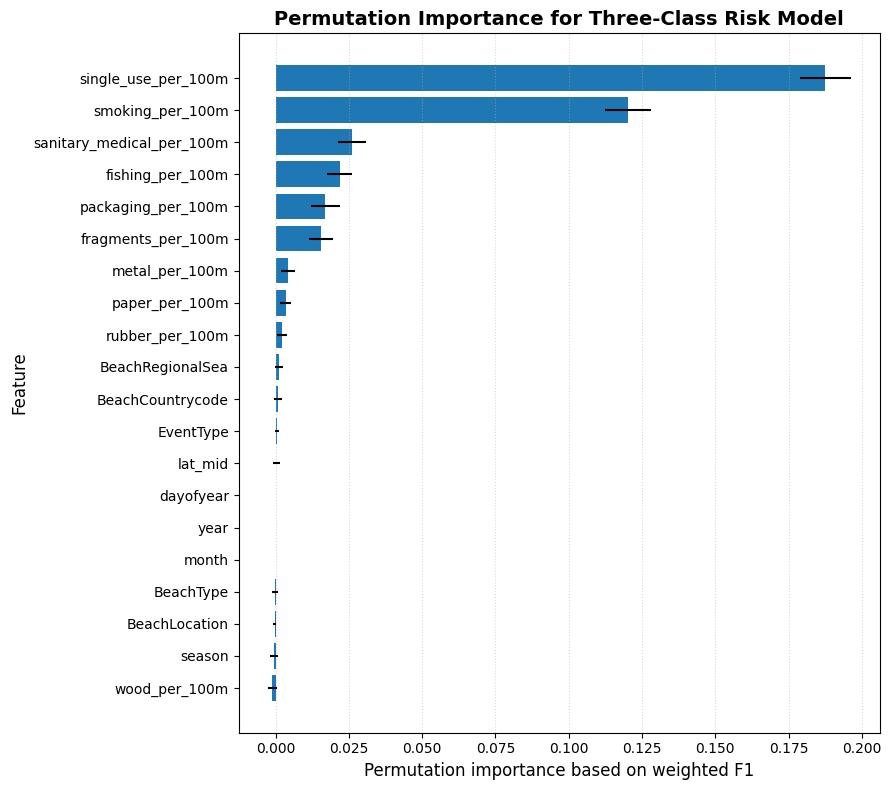

In [166]:
# Cell 56 — Permutation importance for best 3-class model

from sklearn.inspection import permutation_importance
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Model_Reliability", exist_ok=True)

perm3 = permutation_importance(
    best_cls3_pipe,
    X_test_c3,
    y_test_c3,
    scoring="f1_weighted",
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

perm_importance_3 = pd.DataFrame({
    "Feature": X_test_c3.columns,
    "Importance_mean": perm3.importances_mean,
    "Importance_std": perm3.importances_std
}).sort_values("Importance_mean", ascending=False)

display(perm_importance_3.head(20))

perm_importance_3.to_csv(
    "Model_Reliability/Table_Permutation_Importance_3Class.csv",
    index=False
)

plot_perm3 = perm_importance_3.head(20).sort_values("Importance_mean")

plt.figure(figsize=(9, 8))

plt.barh(
    plot_perm3["Feature"],
    plot_perm3["Importance_mean"],
    xerr=plot_perm3["Importance_std"]
)

plt.xlabel("Permutation importance based on weighted F1", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.title(
    "Permutation Importance for Three-Class Risk Model",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="x", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Model_Reliability/Fig_Permutation_Importance_3Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

,Feature,Importance_mean,Importance_std
12,single_use_per_100m,0.300775,0.011551
14,smoking_per_100m,0.223014,0.010764
13,fishing_per_100m,0.047299,0.003764
16,packaging_per_100m,0.041217,0.005144
17,fragments_per_100m,0.040154,0.004783
15,sanitary_medical_per_100m,0.034756,0.004369
22,metal_per_100m,0.004506,0.003046
21,wood_per_100m,0.002520,0.003007
19,textile_per_100m,0.002109,0.002854
9,season,0.001601,0.001450


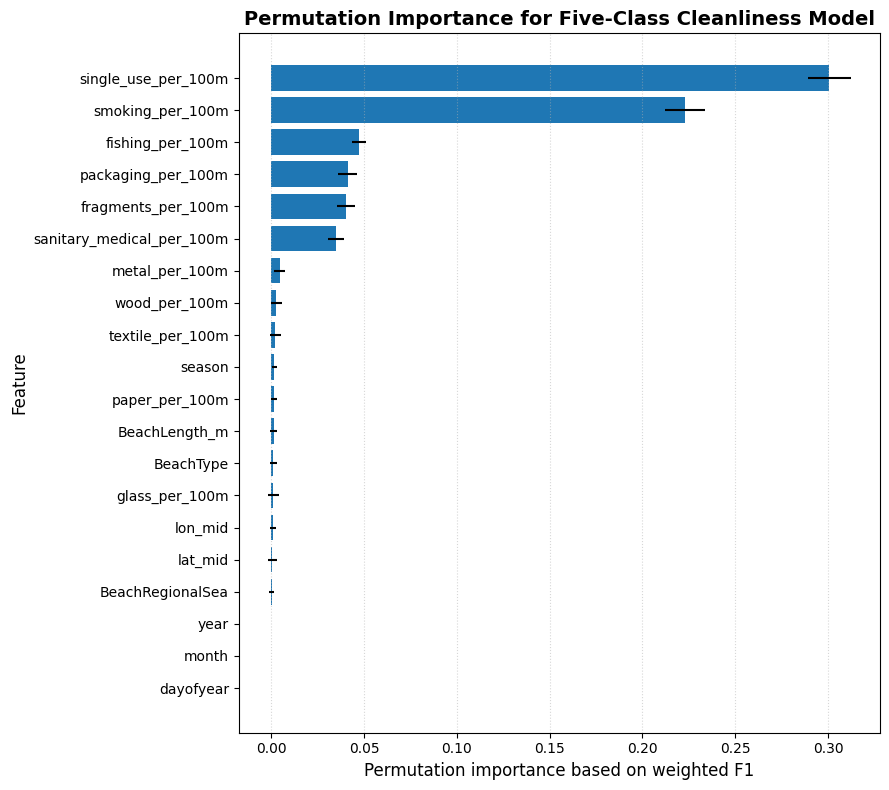

In [167]:
# Cell 57 — Permutation importance for best 5-class model

from sklearn.inspection import permutation_importance
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Model_Reliability", exist_ok=True)

perm5 = permutation_importance(
    best_cls5_pipe,
    X_test_c5,
    y_test_c5,
    scoring="f1_weighted",
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

perm_importance_5 = pd.DataFrame({
    "Feature": X_test_c5.columns,
    "Importance_mean": perm5.importances_mean,
    "Importance_std": perm5.importances_std
}).sort_values("Importance_mean", ascending=False)

display(perm_importance_5.head(20))

perm_importance_5.to_csv(
    "Model_Reliability/Table_Permutation_Importance_5Class.csv",
    index=False
)

plot_perm5 = perm_importance_5.head(20).sort_values("Importance_mean")

plt.figure(figsize=(9, 8))

plt.barh(
    plot_perm5["Feature"],
    plot_perm5["Importance_mean"],
    xerr=plot_perm5["Importance_std"]
)

plt.xlabel("Permutation importance based on weighted F1", fontsize=12)
plt.ylabel("Feature", fontsize=12)

plt.title(
    "Permutation Importance for Five-Class Cleanliness Model",
    fontsize=14,
    fontweight="bold"
)

plt.grid(axis="x", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Model_Reliability/Fig_Permutation_Importance_5Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [168]:
# Cell 58 — Compare SHAP and permutation importance

import pandas as pd
import os

os.makedirs("Model_Reliability", exist_ok=True)

# Clean SHAP feature names for comparison
shap_compare_3 = shap_importance_c3.copy()
shap_compare_3["Feature_clean"] = shap_compare_3["Feature"].str.replace(
    "num__", "", regex=False
)

perm_compare_3 = perm_importance_3.copy()
perm_compare_3["Feature_clean"] = perm_compare_3["Feature"]

comparison_3 = pd.merge(
    shap_compare_3,
    perm_compare_3,
    on="Feature_clean",
    how="inner"
)

comparison_3 = comparison_3[[
    "Feature_clean",
    "Mean_abs_SHAP",
    "Importance_mean",
    "Importance_std"
]].sort_values("Mean_abs_SHAP", ascending=False)

display(comparison_3.head(20))

comparison_3.to_csv(
    "Model_Reliability/Table_SHAP_vs_Permutation_Importance_3Class.csv",
    index=False
)

,Feature_clean,Mean_abs_SHAP,Importance_mean,Importance_std
0,single_use_per_100m,0.710583,0.187480,0.008675
1,smoking_per_100m,0.507736,0.120242,0.007839
2,fragments_per_100m,0.320448,0.015577,0.004080
3,packaging_per_100m,0.294977,0.016956,0.004986
4,fishing_per_100m,0.262333,0.021824,0.004107
5,sanitary_medical_per_100m,0.220411,0.026113,0.004773
6,metal_per_100m,0.102821,0.004410,0.002392
7,wood_per_100m,0.076228,-0.001131,0.001511
8,glass_per_100m,0.068832,-0.001409,0.002286
9,paper_per_100m,0.064999,0.003427,0.001921


In [169]:
# Cell 59 — Add high-risk probability to geospatial dataframe

import numpy as np
import pandas as pd
import os

os.makedirs("Publication_Maps", exist_ok=True)

# Predict probabilities for all records
proba3_all = best_cls3_pipe.predict_proba(X)

# Identify index of High risk class
high_risk_index = list(le3.classes_).index("High risk")

high_risk_probability = proba3_all[:, high_risk_index]

prediction_df["High_Risk_Probability"] = high_risk_probability

gdf_pred["High_Risk_Probability"] = prediction_df.loc[
    gdf_pred.index,
    "High_Risk_Probability"
]

display(gdf_pred[[
    "CCI_proxy",
    "CCI_class_3",
    "Predicted_CCI_class_3",
    "High_Risk_Probability",
    "lon_mid",
    "lat_mid"
]].head())

,CCI_proxy,CCI_class_3,Predicted_CCI_class_3,High_Risk_Probability,lon_mid,lat_mid
0,0.073162,Low risk,Low risk,0.000085,28.569571,43.669423
1,0.326154,Low risk,Low risk,0.000077,28.569571,43.669423
2,0.071795,Low risk,Low risk,0.000099,28.569571,43.669423
3,0.349402,Low risk,Low risk,0.000081,28.569571,43.669423
4,10.120000,Moderate risk,Moderate risk,0.029212,0.000135,0.000361


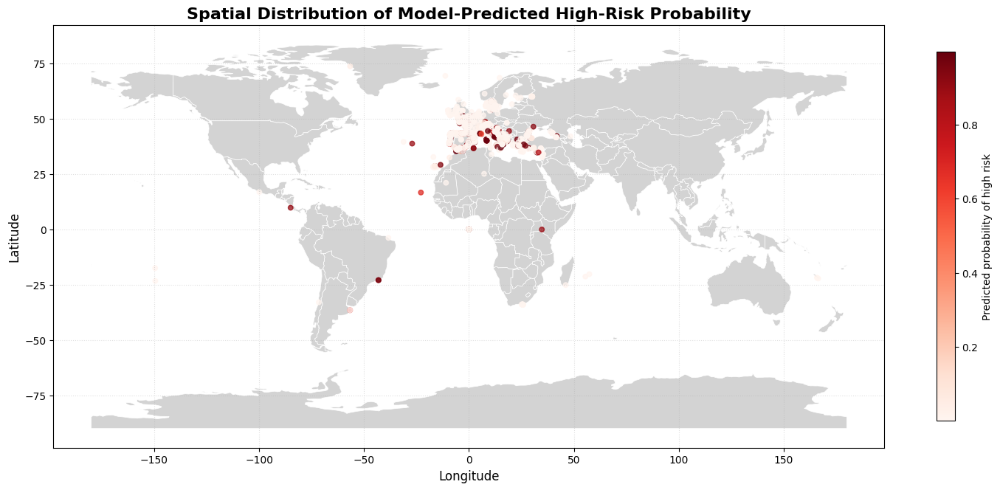

In [170]:
# Cell 60 — High-risk probability map

import matplotlib.pyplot as plt
import os

os.makedirs("Publication_Maps", exist_ok=True)

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="lightgray",
    edgecolor="white",
    linewidth=0.5
)

gdf_pred.plot(
    ax=ax,
    column="High_Risk_Probability",
    cmap="Reds",
    markersize=22,
    alpha=0.75,
    legend=True,
    legend_kwds={
        "label": "Predicted probability of high risk",
        "shrink": 0.65
    }
)

ax.set_title(
    "Spatial Distribution of Model-Predicted High-Risk Probability",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Publication_Maps/Fig_High_Risk_Probability_Map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [171]:
# Cell 62 — Spatial autocorrelation preparation

!pip install libpysal esda -q

import geopandas as gpd
import pandas as pd
import numpy as np
import os

from libpysal.weights import KNN
from esda.moran import Moran

os.makedirs("Advanced_Spatial_Analysis", exist_ok=True)

# Use valid geospatial data
spatial_gdf = gdf_pred.dropna(
    subset=["lon_mid", "lat_mid", "CCI_proxy"]
).copy()

spatial_gdf = spatial_gdf[
    (spatial_gdf["lon_mid"].between(-180, 180)) &
    (spatial_gdf["lat_mid"].between(-90, 90))
].copy()

spatial_gdf = spatial_gdf.to_crs("EPSG:4326")

print("Spatial records:", spatial_gdf.shape)
display(spatial_gdf[[
    "CCI_proxy",
    "CCI_class_3",
    "Predicted_CCI_class_3",
    "lon_mid",
    "lat_mid"
]].head())

Spatial records: (3373, 231)


,CCI_proxy,CCI_class_3,Predicted_CCI_class_3,lon_mid,lat_mid
0,0.073162,Low risk,Low risk,28.569571,43.669423
1,0.326154,Low risk,Low risk,28.569571,43.669423
2,0.071795,Low risk,Low risk,28.569571,43.669423
3,0.349402,Low risk,Low risk,28.569571,43.669423
4,10.120000,Moderate risk,Moderate risk,0.000135,0.000361


In [172]:
# Cell 63 — Global Moran's I for CCI-proxy
# This checks whether high or low CCI values are spatially clustered.
# Interpretation:
#A significant positive Moran’s I means high-CCI beaches tend to be near other high-CCI beaches, indicating spatial clustering of pollution risk.

from libpysal.weights import KNN
from esda.moran import Moran
import pandas as pd
import numpy as np
import os

os.makedirs("Advanced_Spatial_Analysis", exist_ok=True)

coords = list(zip(spatial_gdf["lon_mid"], spatial_gdf["lat_mid"]))

# K-nearest spatial neighbours
w = KNN.from_array(coords, k=8)
w.transform = "r"

y = spatial_gdf["CCI_proxy"].values

moran = Moran(y, w)

moran_df = pd.DataFrame({
    "Statistic": ["Moran_I", "Expected_I", "p_value_permutation", "z_score"],
    "Value": [moran.I, moran.EI, moran.p_sim, moran.z_sim]
})

display(moran_df)

moran_df.to_csv(
    "Advanced_Spatial_Analysis/Table_Global_Morans_I_CCI.csv",
    index=False
)

print("Moran's I:", moran.I)
print("Permutation p-value:", moran.p_sim)

,Statistic,Value
0,Moran_I,0.288170
1,Expected_I,-0.000297
2,p_value_permutation,0.001000
3,z_score,36.307606


Moran's I: 0.2881699225908356
Permutation p-value: 0.001


In [173]:
# Cell 64 — Local Moran's I hotspot analysis

from esda.moran import Moran_Local
import pandas as pd
import numpy as np
import os

os.makedirs("Advanced_Spatial_Analysis", exist_ok=True)

local_moran = Moran_Local(y, w)

spatial_gdf["Local_Moran_I"] = local_moran.Is
spatial_gdf["Local_Moran_p"] = local_moran.p_sim
spatial_gdf["Moran_quadrant"] = local_moran.q

def hotspot_label(row):
    if row["Local_Moran_p"] >= 0.05:
        return "Not significant"
    elif row["Moran_quadrant"] == 1:
        return "High-High hotspot"
    elif row["Moran_quadrant"] == 2:
        return "Low-High spatial outlier"
    elif row["Moran_quadrant"] == 3:
        return "Low-Low coldspot"
    elif row["Moran_quadrant"] == 4:
        return "High-Low spatial outlier"
    else:
        return "Not significant"

spatial_gdf["Spatial_Hotspot_Type"] = spatial_gdf.apply(hotspot_label, axis=1)

hotspot_summary = spatial_gdf["Spatial_Hotspot_Type"].value_counts().reset_index()
hotspot_summary.columns = ["Spatial_Hotspot_Type", "Count"]

display(hotspot_summary)

hotspot_summary.to_csv(
    "Advanced_Spatial_Analysis/Table_Local_Moran_Hotspot_Summary.csv",
    index=False
)

spatial_gdf[[
    "BeachCountrycode",
    "BeachRegionalSea",
    "CCI_proxy",
    "CCI_class_3",
    "Local_Moran_I",
    "Local_Moran_p",
    "Spatial_Hotspot_Type",
    "lon_mid",
    "lat_mid"
]].to_csv(
    "Advanced_Spatial_Analysis/Table_Local_Moran_Hotspots.csv",
    index=False
)

,Spatial_Hotspot_Type,Count
0,Not significant,2048
1,Low-Low coldspot,899
2,High-High hotspot,287
3,Low-High spatial outlier,115
4,High-Low spatial outlier,24


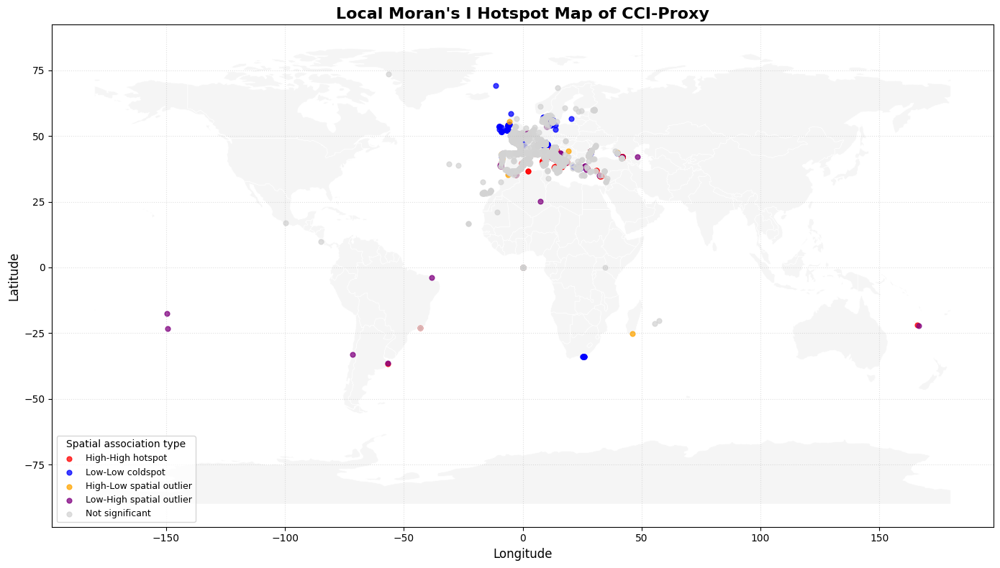

In [174]:
# Cell 65 — Spatial hotspot map

import matplotlib.pyplot as plt
import os

os.makedirs("Advanced_Spatial_Analysis", exist_ok=True)

hotspot_colors = {
    "High-High hotspot": "red",
    "Low-Low coldspot": "blue",
    "High-Low spatial outlier": "orange",
    "Low-High spatial outlier": "purple",
    "Not significant": "lightgray"
}

fig, ax = plt.subplots(figsize=(15, 8))

world.plot(
    ax=ax,
    color="whitesmoke",
    edgecolor="white",
    linewidth=0.5
)

for label, color in hotspot_colors.items():
    subset = spatial_gdf[spatial_gdf["Spatial_Hotspot_Type"] == label]
    if len(subset) > 0:
        subset.plot(
            ax=ax,
            color=color,
            markersize=24,
            alpha=0.75,
            label=label
        )

ax.set_title(
    "Local Moran's I Hotspot Map of CCI-Proxy",
    fontsize=16,
    fontweight="bold"
)

ax.set_xlabel("Longitude", fontsize=12)
ax.set_ylabel("Latitude", fontsize=12)

ax.legend(
    title="Spatial association type",
    fontsize=9,
    title_fontsize=10,
    loc="lower left"
)

ax.grid(True, linestyle=":", alpha=0.4)

plt.tight_layout()

plt.savefig(
    "Advanced_Spatial_Analysis/Fig_Local_Moran_CCI_Hotspot_Map.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [175]:
# Cell 66 — Regional sea-wise hotspot and CCI summary

import pandas as pd
import os

os.makedirs("Advanced_Spatial_Analysis", exist_ok=True)

regional_hotspot_summary = spatial_gdf.groupby("BeachRegionalSea").agg(
    Survey_Count=("CCI_proxy", "count"),
    Mean_CCI=("CCI_proxy", "mean"),
    Median_CCI=("CCI_proxy", "median"),
    Max_CCI=("CCI_proxy", "max"),
    High_Risk_Count=("CCI_class_3", lambda x: (x == "High risk").sum()),
    Hotspot_Count=("Spatial_Hotspot_Type", lambda x: (x == "High-High hotspot").sum())
).reset_index()

regional_hotspot_summary["High_Risk_Percent"] = (
    regional_hotspot_summary["High_Risk_Count"] /
    regional_hotspot_summary["Survey_Count"] * 100
)

regional_hotspot_summary["Hotspot_Percent"] = (
    regional_hotspot_summary["Hotspot_Count"] /
    regional_hotspot_summary["Survey_Count"] * 100
)

regional_hotspot_summary = regional_hotspot_summary.sort_values(
    "Mean_CCI",
    ascending=False
)

display(regional_hotspot_summary)

regional_hotspot_summary.to_csv(
    "Advanced_Spatial_Analysis/Table_Regional_Sea_Hotspot_CCI_Summary.csv",
    index=False
)

,BeachRegionalSea,Survey_Count,Mean_CCI,Median_CCI,Max_CCI,High_Risk_Count,Hotspot_Count,High_Risk_Percent,Hotspot_Percent
1,Black Sea,261,11.014820,3.230769,76.616822,50,70,19.157088,26.819923
2,Mediterranean Sea,985,10.288162,5.080000,78.901099,155,149,15.736041,15.126904
3,North-east Atlantic Ocean,811,6.671987,2.637333,73.111111,65,45,8.014797,5.548705
4,Unknown,108,5.649717,1.737143,76.061538,7,1,6.481481,0.925926
0,Baltic Sea,96,3.020706,0.939394,67.166667,2,0,2.083333,0.000000


,month,Survey_Count,Mean_CCI,Median_CCI,High_Risk_Count,High_Risk_Percent
0,1,137,3.670866,1.000000,5,3.649635
1,2,116,3.839203,1.270468,5,4.310345
2,3,380,10.073389,3.884982,60,15.789474
3,4,544,8.030694,3.663434,62,11.397059
4,5,427,6.603684,2.707071,37,8.665105
5,6,294,5.738908,2.294372,18,6.122449
6,7,224,4.131971,1.508621,10,4.464286
7,8,200,4.918075,1.468254,13,6.500000
8,9,291,7.174456,1.818182,28,9.621993
9,10,349,7.397321,2.100000,37,10.601719


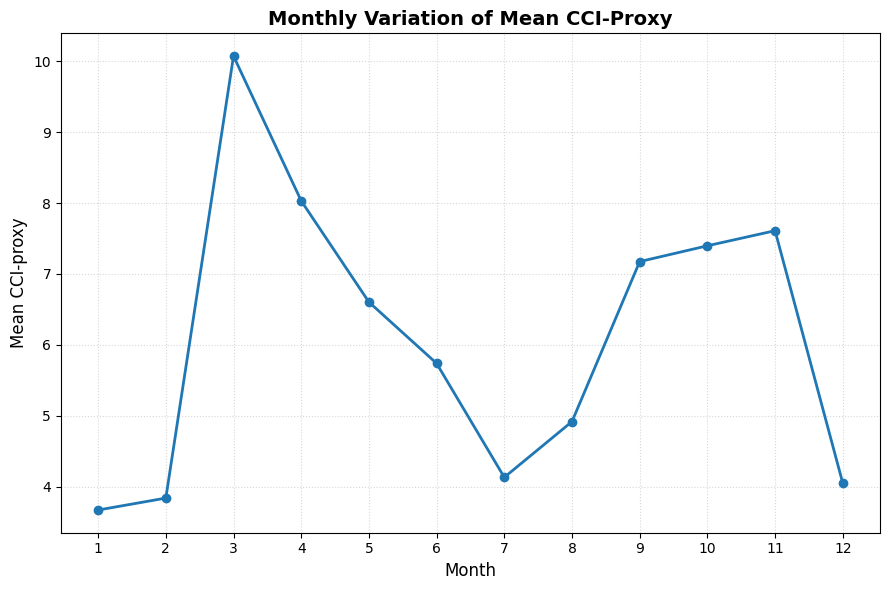

In [176]:
# Cell 67 — Monthly and seasonal CCI trend analysis

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

os.makedirs("Temporal_Risk_Analysis", exist_ok=True)

temporal_df = df_model.dropna(subset=["year", "month", "season", "CCI_proxy"]).copy()

monthly_cci = temporal_df.groupby("month").agg(
    Survey_Count=("CCI_proxy", "count"),
    Mean_CCI=("CCI_proxy", "mean"),
    Median_CCI=("CCI_proxy", "median"),
    High_Risk_Count=("CCI_class_3", lambda x: (x == "High risk").sum())
).reset_index()

monthly_cci["High_Risk_Percent"] = (
    monthly_cci["High_Risk_Count"] /
    monthly_cci["Survey_Count"] * 100
)

display(monthly_cci)

monthly_cci.to_csv(
    "Temporal_Risk_Analysis/Table_Monthly_CCI_Risk_Summary.csv",
    index=False
)

plt.figure(figsize=(9, 6))

plt.plot(
    monthly_cci["month"],
    monthly_cci["Mean_CCI"],
    marker="o",
    linewidth=2
)

plt.xlabel("Month", fontsize=12)
plt.ylabel("Mean CCI-proxy", fontsize=12)

plt.title(
    "Monthly Variation of Mean CCI-Proxy",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(range(1, 13))
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Temporal_Risk_Analysis/Fig_Monthly_Mean_CCI_Trend.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

CCI_class_3,High risk,Low risk,Moderate risk
season,,,
Winter,3.811659,79.372197,16.816143
Spring,11.769060,60.473723,27.757217
Summer,5.710306,74.373259,19.916435
Autumn,10.489510,65.617716,23.892774


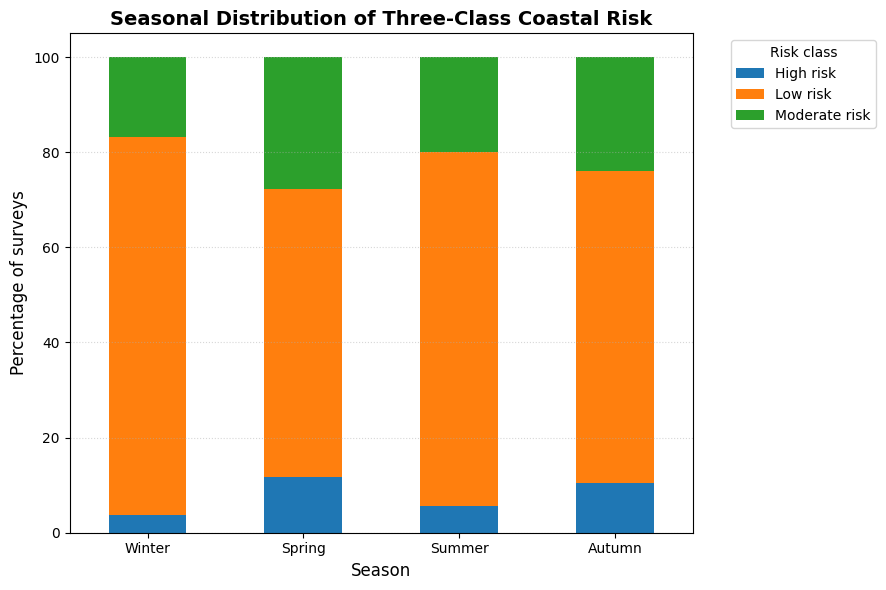

In [177]:
# Cell 68 — Seasonal risk-class distribution

import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Temporal_Risk_Analysis", exist_ok=True)

season_order = ["Winter", "Spring", "Summer", "Autumn"]

season_class_counts = pd.crosstab(
    temporal_df["season"],
    temporal_df["CCI_class_3"],
    normalize="index"
) * 100

season_class_counts = season_class_counts.loc[
    [s for s in season_order if s in season_class_counts.index]
]

display(season_class_counts)

season_class_counts.to_csv(
    "Temporal_Risk_Analysis/Table_Seasonal_3Class_Risk_Percent.csv"
)

season_class_counts.plot(
    kind="bar",
    stacked=True,
    figsize=(9, 6)
)

plt.xlabel("Season", fontsize=12)
plt.ylabel("Percentage of surveys", fontsize=12)

plt.title(
    "Seasonal Distribution of Three-Class Coastal Risk",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=0)
plt.legend(title="Risk class", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Temporal_Risk_Analysis/Fig_Seasonal_3Class_Risk_Distribution.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [178]:
# Cell 69 — Seasonal statistical test for CCI differences

from scipy.stats import kruskal
import pandas as pd
import os

os.makedirs("Temporal_Risk_Analysis", exist_ok=True)

season_groups = [
    temporal_df[temporal_df["season"] == s]["CCI_proxy"].dropna()
    for s in season_order
    if s in temporal_df["season"].unique()
]

season_names_available = [
    s for s in season_order
    if s in temporal_df["season"].unique()
]

season_kw_stat, season_kw_p = kruskal(*season_groups)

season_test_df = pd.DataFrame({
    "Comparison": ["CCI-proxy across seasons"],
    "Groups": [", ".join(season_names_available)],
    "Kruskal_H": [season_kw_stat],
    "p_value": [season_kw_p]
})

display(season_test_df)

season_test_df.to_csv(
    "Temporal_Risk_Analysis/Table_Seasonal_Kruskal_CCI_Test.csv",
    index=False
)

,Comparison,Groups,Kruskal_H,p_value
0,CCI-proxy across seasons,"Winter, Spring, Summer, Autumn",111.025027,6.602866e-24


,year,Survey_Count,Mean_CCI,Median_CCI,High_Risk_Count,High_Risk_Percent
0,2013,73,2.463834,1.270015,1,1.369863
1,2014,132,4.820332,1.669672,6,4.545455
2,2015,463,10.327926,4.360000,76,16.414687
3,2016,247,9.162145,2.152381,33,13.360324
4,2017,1192,4.818051,1.590000,66,5.536913
5,2018,686,7.049157,2.577381,70,10.204082
6,2019,489,6.801655,2.851754,41,8.384458
7,2020,85,10.450284,3.720000,14,16.470588
8,2021,6,2.827836,2.091458,0,0.000000


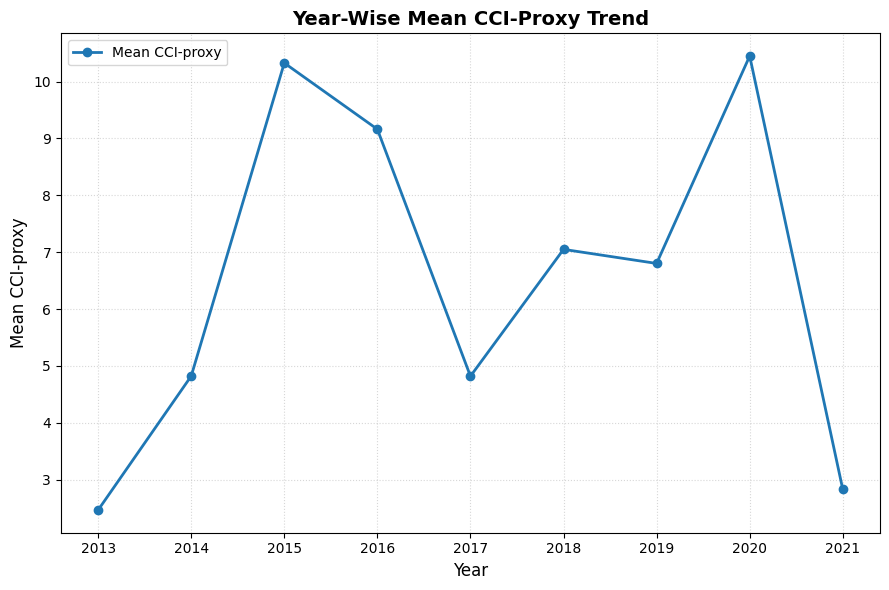

In [179]:
# Cell 70 — Year-wise CCI and high-risk trend

import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Temporal_Risk_Analysis", exist_ok=True)

yearly_cci = temporal_df.groupby("year").agg(
    Survey_Count=("CCI_proxy", "count"),
    Mean_CCI=("CCI_proxy", "mean"),
    Median_CCI=("CCI_proxy", "median"),
    High_Risk_Count=("CCI_class_3", lambda x: (x == "High risk").sum())
).reset_index()

yearly_cci["High_Risk_Percent"] = (
    yearly_cci["High_Risk_Count"] /
    yearly_cci["Survey_Count"] * 100
)

display(yearly_cci)

yearly_cci.to_csv(
    "Temporal_Risk_Analysis/Table_Yearly_CCI_Risk_Summary.csv",
    index=False
)

plt.figure(figsize=(9, 6))

plt.plot(
    yearly_cci["year"],
    yearly_cci["Mean_CCI"],
    marker="o",
    linewidth=2,
    label="Mean CCI-proxy"
)

plt.xlabel("Year", fontsize=12)
plt.ylabel("Mean CCI-proxy", fontsize=12)

plt.title(
    "Year-Wise Mean CCI-Proxy Trend",
    fontsize=14,
    fontweight="bold"
)

plt.grid(True, linestyle=":", alpha=0.5)
plt.legend()

plt.tight_layout()

plt.savefig(
    "Temporal_Risk_Analysis/Fig_Yearly_Mean_CCI_Trend.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [180]:
# Cell 71 — Threshold sensitivity analysis for 3-class CCI labels

from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder
import pandas as pd
import numpy as np
import os

os.makedirs("Threshold_Sensitivity", exist_ok=True)

def make_3class_threshold(x, low_thr=5, high_thr=20):
    if x <= low_thr:
        return "Low risk"
    elif x <= high_thr:
        return "Moderate risk"
    else:
        return "High risk"

threshold_settings = [
    (4, 18),
    (5, 20),
    (6, 22),
    (5, 18),
    (5, 22)
]

threshold_results = []

# Use same best model family as current best 3-class model
for low_thr, high_thr in threshold_settings:

    temp_y = model_df["CCI_proxy"].apply(
        lambda x: make_3class_threshold(x, low_thr, high_thr)
    )

    le_temp = LabelEncoder()
    y_temp_encoded = le_temp.fit_transform(temp_y)

    X_train_t, X_test_t, y_train_t, y_test_t = train_test_split(
        X,
        y_temp_encoded,
        test_size=0.2,
        random_state=42,
        stratify=y_temp_encoded
    )

    pipe_t = Pipeline(steps=[
        ("preprocessor", preprocessor),
        ("model", cls_models[best_cls3_name])
    ])

    pipe_t.fit(X_train_t, y_train_t)
    pred_t = pipe_t.predict(X_test_t)

    threshold_results.append({
        "Low_threshold": low_thr,
        "High_threshold": high_thr,
        "Accuracy": accuracy_score(y_test_t, pred_t),
        "Weighted_F1": f1_score(y_test_t, pred_t, average="weighted", zero_division=0),
        "Classes": ", ".join(le_temp.classes_)
    })

threshold_sensitivity_df = pd.DataFrame(threshold_results)

display(threshold_sensitivity_df)

threshold_sensitivity_df.to_csv(
    "Threshold_Sensitivity/Table_3Class_Threshold_Sensitivity.csv",
    index=False
)

,Low_threshold,High_threshold,Accuracy,Weighted_F1,Classes
0,4,18,0.961481,0.961283,"High risk, Low risk, Moderate risk"
1,5,20,0.962963,0.962454,"High risk, Low risk, Moderate risk"
2,6,22,0.954074,0.954126,"High risk, Low risk, Moderate risk"
3,5,18,0.967407,0.967444,"High risk, Low risk, Moderate risk"
4,5,22,0.951111,0.950423,"High risk, Low risk, Moderate risk"


In [181]:
# Cell 72 — Borderline CCI threshold case analysis

import pandas as pd
import numpy as np
import os

os.makedirs("Threshold_Sensitivity", exist_ok=True)

thresholds = [2, 5, 10, 20]
margin = 0.5

borderline_records = []

for thr in thresholds:
    temp = df_model[
        (df_model["CCI_proxy"] >= thr - margin) &
        (df_model["CCI_proxy"] <= thr + margin)
    ].copy()

    temp["Nearby_Threshold"] = thr
    temp["Threshold_Margin"] = margin

    borderline_records.append(temp)

borderline_df = pd.concat(borderline_records, axis=0)

borderline_summary = borderline_df.groupby("Nearby_Threshold").agg(
    Borderline_Count=("CCI_proxy", "count"),
    Mean_CCI=("CCI_proxy", "mean"),
    Min_CCI=("CCI_proxy", "min"),
    Max_CCI=("CCI_proxy", "max")
).reset_index()

display(borderline_summary)

borderline_summary.to_csv(
    "Threshold_Sensitivity/Table_Borderline_CCI_Threshold_Summary.csv",
    index=False
)

borderline_df[[
    "BeachCountrycode",
    "BeachRegionalSea",
    "BeachLocation",
    "BeachType",
    "CCI_proxy",
    "CCI_class_3",
    "CCI_class_5"
]].to_csv(
    "Threshold_Sensitivity/Table_Borderline_CCI_Records.csv",
    index=False
)

,Nearby_Threshold,Borderline_Count,Mean_CCI,Min_CCI,Max_CCI
0,2,331,1.947934,1.50,2.500000
1,5,165,4.957619,4.50,5.500000
2,10,58,9.982263,9.54,10.493333
3,20,28,20.189210,19.50,20.469136


In [182]:
# Cell 73 — Ordinal misclassification distance for 5-class model
# Because 5-class labels are ordered, misclassifying Very clean as Clean is less severe than Very clean as Extremely dirty.

import pandas as pd
import numpy as np
import os

os.makedirs("Ordinal_Error_Analysis", exist_ok=True)

ordinal_order_5 = [
    "Very clean",
    "Clean",
    "Moderate",
    "Dirty",
    "Extremely dirty"
]

ordinal_map_5 = {cls: i for i, cls in enumerate(ordinal_order_5)}

confidence_df_5["Observed_Ordinal"] = confidence_df_5["Observed"].map(ordinal_map_5)
confidence_df_5["Predicted_Ordinal"] = confidence_df_5["Predicted"].map(ordinal_map_5)

confidence_df_5["Ordinal_Error_Distance"] = (
    confidence_df_5["Observed_Ordinal"] -
    confidence_df_5["Predicted_Ordinal"]
).abs()

ordinal_error_summary = confidence_df_5["Ordinal_Error_Distance"].value_counts().sort_index()
ordinal_error_summary = ordinal_error_summary.reset_index()
ordinal_error_summary.columns = ["Ordinal_Error_Distance", "Count"]

ordinal_error_summary["Percent"] = (
    ordinal_error_summary["Count"] /
    ordinal_error_summary["Count"].sum() * 100
)

display(ordinal_error_summary)

ordinal_error_summary.to_csv(
    "Ordinal_Error_Analysis/Table_5Class_Ordinal_Error_Distance.csv",
    index=False
)

print("Mean ordinal error distance:", confidence_df_5["Ordinal_Error_Distance"].mean())
print("Maximum ordinal error distance:", confidence_df_5["Ordinal_Error_Distance"].max())

,Ordinal_Error_Distance,Count,Percent
0,0,615,91.111111
1,1,60,8.888889


Mean ordinal error distance: 0.08888888888888889
Maximum ordinal error distance: 1


In [183]:
# Cell 74 — Ordinal-weighted five-class performance

import pandas as pd
import numpy as np
import os

os.makedirs("Ordinal_Error_Analysis", exist_ok=True)

max_distance = len(ordinal_order_5) - 1

confidence_df_5["Ordinal_Closeness_Score"] = (
    1 - confidence_df_5["Ordinal_Error_Distance"] / max_distance
)

ordinal_weighted_accuracy = confidence_df_5["Ordinal_Closeness_Score"].mean()

ordinal_performance_df = pd.DataFrame({
    "Metric": [
        "Standard accuracy",
        "Mean ordinal error distance",
        "Ordinal-weighted accuracy"
    ],
    "Value": [
        (confidence_df_5["Correct"].mean()),
        confidence_df_5["Ordinal_Error_Distance"].mean(),
        ordinal_weighted_accuracy
    ]
})

display(ordinal_performance_df)

ordinal_performance_df.to_csv(
    "Ordinal_Error_Analysis/Table_5Class_Ordinal_Weighted_Performance.csv",
    index=False
)

,Metric,Value
0,Standard accuracy,0.911111
1,Mean ordinal error distance,0.088889
2,Ordinal-weighted accuracy,0.977778


In [184]:
# Cell 75 — Exact and neighbouring-class correctness for 5-class model

import pandas as pd
import os

os.makedirs("Ordinal_Error_Analysis", exist_ok=True)

exact_correct = (confidence_df_5["Ordinal_Error_Distance"] == 0).mean()
within_one_class = (confidence_df_5["Ordinal_Error_Distance"] <= 1).mean()
within_two_classes = (confidence_df_5["Ordinal_Error_Distance"] <= 2).mean()

neighbor_error_df = pd.DataFrame({
    "Criterion": [
        "Exact class match",
        "Within one neighbouring class",
        "Within two neighbouring classes"
    ],
    "Proportion": [
        exact_correct,
        within_one_class,
        within_two_classes
    ]
})

display(neighbor_error_df)

neighbor_error_df.to_csv(
    "Ordinal_Error_Analysis/Table_5Class_Neighbouring_Class_Performance.csv",
    index=False
)

,Criterion,Proportion
0,Exact class match,0.911111
1,Within one neighbouring class,1.000000
2,Within two neighbouring classes,1.000000


In [185]:
# Cell 76 — Litter source contribution ratio by risk class

import pandas as pd
import numpy as np
import os

os.makedirs("Litter_Source_Analysis", exist_ok=True)

source_cols = [
    "single_use_per_100m",
    "fishing_per_100m",
    "smoking_per_100m",
    "sanitary_medical_per_100m",
    "packaging_per_100m",
    "fragments_per_100m",
    "rubber_per_100m",
    "textile_per_100m",
    "paper_per_100m",
    "wood_per_100m",
    "metal_per_100m",
    "glass_per_100m"
]

source_cols = [c for c in source_cols if c in df_model.columns]

source_profile_3 = df_model.groupby("CCI_class_3")[source_cols].mean()
source_profile_3 = source_profile_3.loc[["Low risk", "Moderate risk", "High risk"]]

source_share_3 = source_profile_3.div(source_profile_3.sum(axis=1), axis=0) * 100

display(source_share_3)

source_share_3.to_csv(
    "Litter_Source_Analysis/Table_Source_Share_3Class.csv"
)

source_profile_5 = df_model.groupby("CCI_class_5")[source_cols].mean()
source_profile_5 = source_profile_5.loc[
    ["Very clean", "Clean", "Moderate", "Dirty", "Extremely dirty"]
]

source_share_5 = source_profile_5.div(source_profile_5.sum(axis=1), axis=0) * 100

display(source_share_5)

source_share_5.to_csv(
    "Litter_Source_Analysis/Table_Source_Share_5Class.csv"
)

,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m,rubber_per_100m,textile_per_100m,paper_per_100m,wood_per_100m,metal_per_100m,glass_per_100m
CCI_class_3,,,,,,,,,,,,
Low risk,25.660857,4.286945,14.917201,2.132030,11.917533,10.012907,0.931062,1.792616,3.905933,1.634225,6.709957,16.098733
Moderate risk,29.522794,5.680073,14.966512,3.457187,13.301264,13.038768,0.835022,1.368459,2.927261,1.145615,3.942205,9.814841
High risk,32.496893,5.400017,16.711583,5.265383,14.080610,15.430909,0.459496,1.009342,1.695729,0.826913,2.455307,4.167818


,single_use_per_100m,fishing_per_100m,smoking_per_100m,sanitary_medical_per_100m,packaging_per_100m,fragments_per_100m,rubber_per_100m,textile_per_100m,paper_per_100m,wood_per_100m,metal_per_100m,glass_per_100m
CCI_class_5,,,,,,,,,,,,
Very clean,23.073726,3.780741,13.678763,1.724012,10.541038,8.973919,1.023659,3.026387,5.130196,1.720899,8.790606,18.536054
Clean,27.108436,4.570182,15.610146,2.360328,12.687724,10.594253,0.879251,1.102283,3.220921,1.585729,5.545770,14.734977
Moderate,27.823063,5.091203,14.268166,2.941663,12.343325,12.630384,0.965229,1.400484,2.916523,0.943168,4.200743,14.476049
Dirty,31.013841,6.196646,15.579120,3.909417,14.141593,13.397012,0.720801,1.340365,2.936679,1.323206,3.715408,5.725911
Extremely dirty,32.496893,5.400017,16.711583,5.265383,14.080610,15.430909,0.459496,1.009342,1.695729,0.826913,2.455307,4.167818


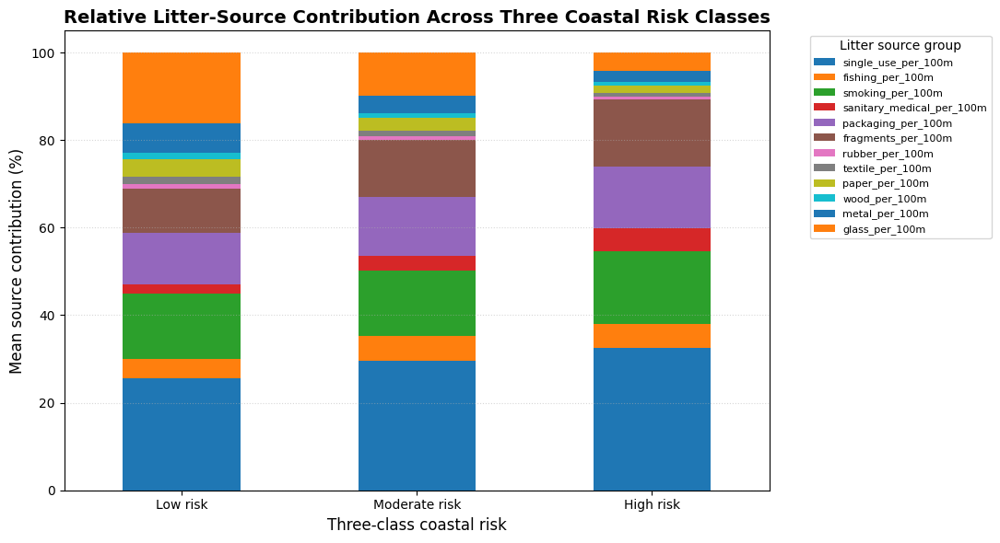

In [186]:
# Cell 77 — Stacked source contribution plot for 3-class risk

import matplotlib.pyplot as plt
import os

os.makedirs("Litter_Source_Analysis", exist_ok=True)

source_share_3.plot(
    kind="bar",
    stacked=True,
    figsize=(11, 6)
)

plt.xlabel("Three-class coastal risk", fontsize=12)
plt.ylabel("Mean source contribution (%)", fontsize=12)

plt.title(
    "Relative Litter-Source Contribution Across Three Coastal Risk Classes",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=0)
plt.legend(
    title="Litter source group",
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    fontsize=8
)

plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Litter_Source_Analysis/Fig_Source_Contribution_3Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

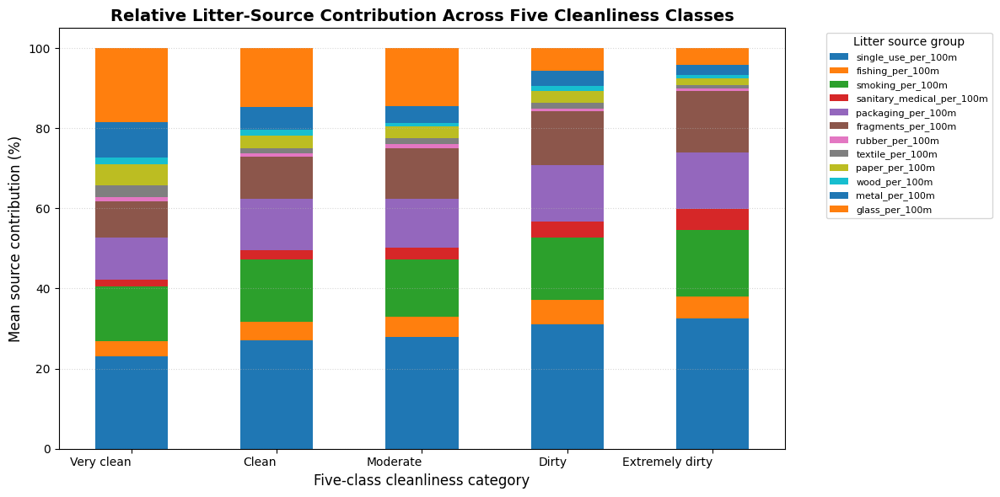

In [189]:
# Cell 78 — Stacked source contribution plot for 5-class cleanliness

import matplotlib.pyplot as plt
import os

os.makedirs("Litter_Source_Analysis", exist_ok=True)

source_share_5.plot(
    kind="bar",
    stacked=True,
    figsize=(12, 6)
)

plt.xlabel("Five-class cleanliness category", fontsize=12)
plt.ylabel("Mean source contribution (%)", fontsize=12)

plt.title(
    "Relative Litter-Source Contribution Across Five Cleanliness Classes",
    fontsize=14,
    fontweight="bold"
)

plt.xticks(rotation=0, ha="right")
plt.legend(
    title="Litter source group",
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    fontsize=8
)

plt.grid(axis="y", linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Litter_Source_Analysis/Fig_Source_Contribution_5Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

Explained variance by PC1: 0.28648943759794565
Explained variance by PC2: 0.1293803537282651
Total explained variance: 0.4158697913262107


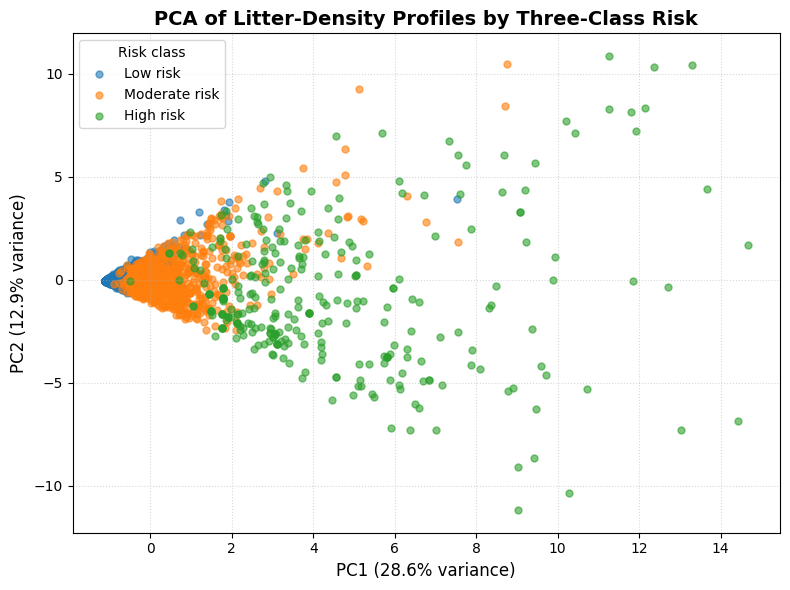

In [190]:
# Cell 79 — PCA of litter-density profiles

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import os

os.makedirs("Multivariate_Analysis", exist_ok=True)

pca_df = df_model[source_cols + ["CCI_class_3", "CCI_class_5"]].dropna().copy()

X_pca = pca_df[source_cols]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_pca)

pca = PCA(n_components=2, random_state=42)
pca_components = pca.fit_transform(X_scaled)

pca_df["PC1"] = pca_components[:, 0]
pca_df["PC2"] = pca_components[:, 1]

explained_variance = pca.explained_variance_ratio_

print("Explained variance by PC1:", explained_variance[0])
print("Explained variance by PC2:", explained_variance[1])
print("Total explained variance:", explained_variance.sum())

plt.figure(figsize=(8, 6))

for cls in ["Low risk", "Moderate risk", "High risk"]:
    subset = pca_df[pca_df["CCI_class_3"] == cls]
    plt.scatter(
        subset["PC1"],
        subset["PC2"],
        alpha=0.6,
        s=25,
        label=cls
    )

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% variance)", fontsize=12)
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% variance)", fontsize=12)

plt.title(
    "PCA of Litter-Density Profiles by Three-Class Risk",
    fontsize=14,
    fontweight="bold"
)

plt.legend(title="Risk class")
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Multivariate_Analysis/Fig_PCA_Litter_Profile_3Class.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [191]:
# Cell 80 — PCA loading table

import pandas as pd
import os

os.makedirs("Multivariate_Analysis", exist_ok=True)

pca_loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1_Loading", "PC2_Loading"],
    index=source_cols
).reset_index()

pca_loadings = pca_loadings.rename(columns={"index": "Feature"})

display(pca_loadings)

pca_loadings.to_csv(
    "Multivariate_Analysis/Table_PCA_Loadings_Litter_Profile.csv",
    index=False
)

,Feature,PC1_Loading,PC2_Loading
0,single_use_per_100m,0.454283,-0.326240
1,fishing_per_100m,0.188977,-0.243245
2,smoking_per_100m,0.275301,0.360255
3,sanitary_medical_per_100m,0.228809,-0.296877
4,packaging_per_100m,0.407357,-0.157629
5,fragments_per_100m,0.330410,-0.390249
6,rubber_per_100m,0.274378,0.133629
7,textile_per_100m,0.259989,0.121719
8,paper_per_100m,0.245753,0.436722
9,wood_per_100m,0.216266,0.266992


In [192]:
# Cell 81 — K-means clustering of litter-density profiles

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import pandas as pd
import os

os.makedirs("Multivariate_Analysis", exist_ok=True)

cluster_results = []

for k in range(2, 8):
    km = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = km.fit_predict(X_scaled)
    sil = silhouette_score(X_scaled, labels)

    cluster_results.append({
        "k": k,
        "Silhouette_score": sil
    })

cluster_results_df = pd.DataFrame(cluster_results)

display(cluster_results_df)

cluster_results_df.to_csv(
    "Multivariate_Analysis/Table_KMeans_Silhouette_Scores.csv",
    index=False
)

best_k = cluster_results_df.sort_values(
    "Silhouette_score",
    ascending=False
).iloc[0]["k"]

best_k = int(best_k)

print("Best k based on silhouette score:", best_k)

kmeans = KMeans(n_clusters=best_k, random_state=42, n_init=10)
pca_df["Litter_Profile_Cluster"] = kmeans.fit_predict(X_scaled)

cluster_risk_table = pd.crosstab(
    pca_df["Litter_Profile_Cluster"],
    pca_df["CCI_class_3"],
    normalize="index"
) * 100

display(cluster_risk_table)

cluster_risk_table.to_csv(
    "Multivariate_Analysis/Table_Cluster_vs_3Class_Risk.csv"
)

,k,Silhouette_score
0,2,0.745700
1,3,0.729305
2,4,0.729425
3,5,0.604652
4,6,0.601985
5,7,0.728297


Best k based on silhouette score: 2


CCI_class_3,High risk,Low risk,Moderate risk
Litter_Profile_Cluster,,,
0,85.393258,1.123596,13.483146
1,2.543464,72.923374,24.533162


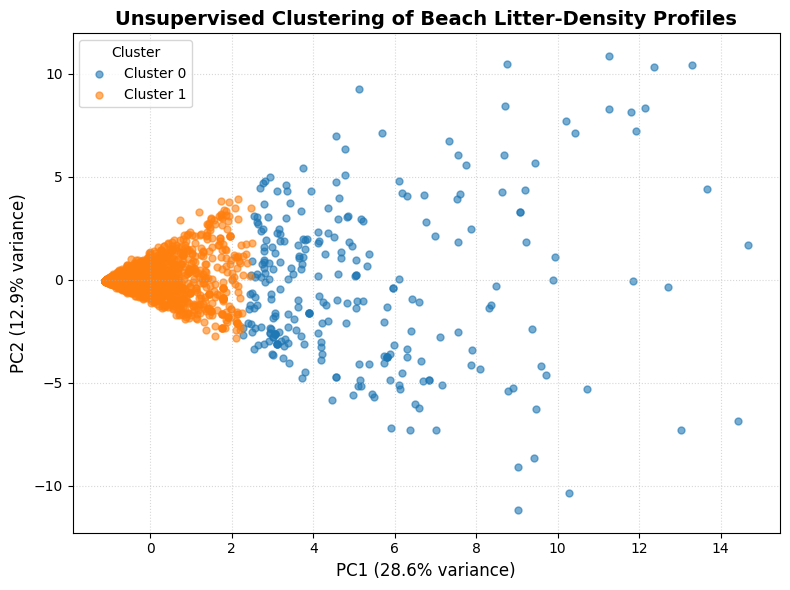

In [193]:
# Cell 82 — PCA plot coloured by litter-profile clusters

import matplotlib.pyplot as plt
import os

os.makedirs("Multivariate_Analysis", exist_ok=True)

plt.figure(figsize=(8, 6))

for cluster_id in sorted(pca_df["Litter_Profile_Cluster"].unique()):
    subset = pca_df[pca_df["Litter_Profile_Cluster"] == cluster_id]
    plt.scatter(
        subset["PC1"],
        subset["PC2"],
        alpha=0.6,
        s=25,
        label=f"Cluster {cluster_id}"
    )

plt.xlabel(f"PC1 ({explained_variance[0]*100:.1f}% variance)", fontsize=12)
plt.ylabel(f"PC2 ({explained_variance[1]*100:.1f}% variance)", fontsize=12)

plt.title(
    "Unsupervised Clustering of Beach Litter-Density Profiles",
    fontsize=14,
    fontweight="bold"
)

plt.legend(title="Cluster")
plt.grid(True, linestyle=":", alpha=0.5)

plt.tight_layout()

plt.savefig(
    "Multivariate_Analysis/Fig_PCA_Litter_Profile_Clusters.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

In [194]:
# Cell 83 — Final publication figure inventory

import pandas as pd
import os

os.makedirs("Final_Results", exist_ok=True)

figure_inventory = pd.DataFrame({
    "Figure": [
        "CCI-proxy geospatial distribution",
        "Observed 3-class coastal risk map",
        "Observed 5-class cleanliness map",
        "Predicted 3-class coastal risk map",
        "High-risk probability map",
        "CCI-proxy threshold distribution",
        "SHAP importance for 3-class model",
        "SHAP importance for 5-class model",
        "Spearman correlation heatmap",
        "Prediction confidence and calibration",
        "Local Moran hotspot map",
        "Seasonal risk distribution",
        "PCA of litter-density profiles",
        "Source contribution stacked plot"
    ],
    "Suggested_location": [
        "Main paper",
        "Main paper",
        "Supplementary",
        "Main paper",
        "Main paper",
        "Main paper",
        "Main paper",
        "Main paper or Supplementary",
        "Supplementary",
        "Supplementary",
        "Main paper or Supplementary",
        "Supplementary",
        "Supplementary",
        "Supplementary"
    ],
    "Purpose": [
        "Shows spatial intensity of CCI-proxy",
        "Shows observed coastal risk distribution",
        "Shows detailed cleanliness categories",
        "Shows model-derived risk mapping",
        "Shows probabilistic high-risk zones",
        "Explains class threshold structure",
        "Explains major drivers of 3-class risk prediction",
        "Explains major drivers of 5-class cleanliness prediction",
        "Shows statistical association among litter groups",
        "Assesses model reliability",
        "Tests spatial clustering and hotspots",
        "Assesses temporal/seasonal risk patterns",
        "Shows multivariate litter-profile separation",
        "Explains relative litter-source dominance"
    ]
})

display(figure_inventory)

figure_inventory.to_csv(
    "Final_Results/Table_Publication_Figure_Inventory.csv",
    index=False
)

,Figure,Suggested_location,Purpose
0,CCI-proxy geospatial distribution,Main paper,Shows spatial intensity of CCI-proxy
1,Observed 3-class coastal risk map,Main paper,Shows observed coastal risk distribution
2,Observed 5-class cleanliness map,Supplementary,Shows detailed cleanliness categories
3,Predicted 3-class coastal risk map,Main paper,Shows model-derived risk mapping
4,High-risk probability map,Main paper,Shows probabilistic high-risk zones
5,CCI-proxy threshold distribution,Main paper,Explains class threshold structure
6,SHAP importance for 3-class model,Main paper,Explains major drivers of 3-class risk prediction
7,SHAP importance for 5-class model,Main paper or Supplementary,Explains major drivers of 5-class cleanliness ...
8,Spearman correlation heatmap,Supplementary,Shows statistical association among litter groups
9,Prediction confidence and calibration,Supplementary,Assesses model reliability


In [195]:
# Cell 84 — Final publication table inventory

import pandas as pd
import os

os.makedirs("Final_Results", exist_ok=True)

table_inventory = pd.DataFrame({
    "Table": [
        "Dataset metadata and preprocessing summary",
        "Class distribution table",
        "Regression model performance",
        "3-class classification performance",
        "5-class classification performance",
        "Kruskal-Wallis and effect-size table",
        "Pairwise Mann-Whitney tests",
        "SHAP global importance table",
        "Permutation importance table",
        "Bootstrap confidence interval table",
        "Country-wise risk summary",
        "Regional sea hotspot summary",
        "Ordinal error analysis for 5-class task",
        "PCA loading table"
    ],
    "Suggested_location": [
        "Main paper",
        "Main paper",
        "Main paper",
        "Main paper",
        "Main paper",
        "Main paper or Supplementary",
        "Supplementary",
        "Supplementary",
        "Supplementary",
        "Main paper",
        "Supplementary",
        "Supplementary",
        "Supplementary",
        "Supplementary"
    ],
    "Purpose": [
        "Describes dataset and cleaning process",
        "Shows target imbalance",
        "Reports CCI-proxy regression performance",
        "Reports broad risk classification performance",
        "Reports detailed cleanliness classification performance",
        "Statistically validates class separation",
        "Shows pairwise class differences",
        "Lists most influential model features",
        "Validates feature importance independently",
        "Adds uncertainty intervals for model metrics",
        "Summarizes country-level risk burden",
        "Links hotspots to regional seas",
        "Shows severity of five-class prediction errors",
        "Explains PCA component meaning"
    ]
})

display(table_inventory)

table_inventory.to_csv(
    "Final_Results/Table_Publication_Table_Inventory.csv",
    index=False
)

,Table,Suggested_location,Purpose
0,Dataset metadata and preprocessing summary,Main paper,Describes dataset and cleaning process
1,Class distribution table,Main paper,Shows target imbalance
2,Regression model performance,Main paper,Reports CCI-proxy regression performance
3,3-class classification performance,Main paper,Reports broad risk classification performance
4,5-class classification performance,Main paper,Reports detailed cleanliness classification pe...
5,Kruskal-Wallis and effect-size table,Main paper or Supplementary,Statistically validates class separation
6,Pairwise Mann-Whitney tests,Supplementary,Shows pairwise class differences
7,SHAP global importance table,Supplementary,Lists most influential model features
8,Permutation importance table,Supplementary,Validates feature importance independently
9,Bootstrap confidence interval table,Main paper,Adds uncertainty intervals for model metrics


In [196]:
# Cell 85 — Auto-generate key result summary text for manuscript

import os

os.makedirs("Final_Results", exist_ok=True)

summary_text = f"""
The final modelling dataset contained {model_df.shape[0]} records after preprocessing and
99th-percentile trimming of extreme CCI-proxy values. The best three-class classifier was
{best_cls3_name}, achieving an accuracy of {cls3_results_df.iloc[0]['Accuracy']:.4f}
and weighted F1-score of {cls3_results_df.iloc[0]['F1']:.4f}. The best five-class classifier
was {best_cls5_name}, achieving an accuracy of {cls5_results_df.iloc[0]['Accuracy']:.4f}
and weighted F1-score of {cls5_results_df.iloc[0]['F1']:.4f}.

Statistical testing showed whether CCI-proxy differed significantly across risk classes,
while SHAP and permutation-importance analyses identified the most influential predictors
driving coastal cleanliness risk prediction. Geospatial mapping further enabled spatial
visualization of observed CCI-proxy, predicted risk classes, and predicted high-risk
probability. Additional ordinal-error analysis was used for the five-class task to assess
whether misclassifications occurred mainly between neighbouring cleanliness classes.
"""

print(summary_text)

with open("Final_Results/Auto_Generated_Manuscript_Result_Summary.txt", "w") as f:
    f.write(summary_text)


The final modelling dataset contained 3373 records after preprocessing and
99th-percentile trimming of extreme CCI-proxy values. The best three-class classifier was
CatBoost, achieving an accuracy of 0.9630
and weighted F1-score of 0.9625. The best five-class classifier
was CatBoost, achieving an accuracy of 0.9111
and weighted F1-score of 0.9114.

Statistical testing showed whether CCI-proxy differed significantly across risk classes,
while SHAP and permutation-importance analyses identified the most influential predictors
driving coastal cleanliness risk prediction. Geospatial mapping further enabled spatial
visualization of observed CCI-proxy, predicted risk classes, and predicted high-risk
probability. Additional ordinal-error analysis was used for the five-class task to assess
whether misclassifications occurred mainly between neighbouring cleanliness classes.



In [197]:
# Cell 86 — Download all generated CSV, images, maps, reports, and tables as ZIP

import os
import zipfile
from google.colab import files

# Output ZIP name
zip_filename = "BeachLitter_CCI_XAI_All_Results.zip"

# File extensions to include
allowed_extensions = (
    ".csv", ".xlsx", ".txt", ".html",
    ".png", ".jpg", ".jpeg", ".pdf",
    ".svg", ".tiff", ".tif"
)

# Folders usually created in this notebook
target_folders = [
    "Observed_vs_Predicted_Individual_Models",
    "Confusion_Matrices_3Class_Individual_Models",
    "Confusion_Matrices_5Class_Individual_Models",
    "Publication_Maps",
    "Interactive_Maps",
    "SHAP_Explainability",
    "Risk_Analysis_Plots",
    "Statistical_Analysis",
    "Model_Reliability",
    "Advanced_Spatial_Analysis",
    "Temporal_Risk_Analysis",
    "Threshold_Sensitivity",
    "Ordinal_Error_Analysis",
    "Litter_Source_Analysis",
    "Multivariate_Analysis",
    "Final_Results"
]

# Also include important files saved in the main working directory
main_directory_files = []

for file in os.listdir("."):
    if os.path.isfile(file) and file.lower().endswith(allowed_extensions):
        main_directory_files.append(file)

# Create ZIP
with zipfile.ZipFile(zip_filename, "w", zipfile.ZIP_DEFLATED) as zipf:

    # Add files from main directory
    for file in main_directory_files:
        zipf.write(file, arcname=file)

    # Add files from target folders
    for folder in target_folders:
        if os.path.exists(folder):
            for root, dirs, files_in_dir in os.walk(folder):
                for file in files_in_dir:
                    if file.lower().endswith(allowed_extensions):
                        file_path = os.path.join(root, file)
                        arcname = os.path.relpath(file_path, ".")
                        zipf.write(file_path, arcname=arcname)

# Show ZIP size
zip_size_mb = os.path.getsize(zip_filename) / (1024 * 1024)

print("ZIP file created successfully.")
print("ZIP filename:", zip_filename)
print(f"ZIP size: {zip_size_mb:.2f} MB")

# Download ZIP to local system
files.download(zip_filename)

ZIP file created successfully.
ZIP filename: BeachLitter_CCI_XAI_All_Results.zip
ZIP size: 31.32 MB


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>